# Binning test

## Imports

In [3]:
# 3rd party imports
import networkx as nx
import numpy as np
np.set_printoptions(linewidth=1000)
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from pprint import pprint
import pandas as pd

# local imports
from modules import laplacian, jacobian

## Functions

In [4]:
def points_in_grid(points, center, grid_size=7):
    """
    Get the indexes of the points that lie within a grid centered at the center point.
    
    Args:
    - points (np.array): The points to filter
    - center (tuple): The center of the grid
    - grid_size (int): The size of the grid
    
    Returns:
    - np.array: The indexes of the points that lie within the grid
    """
    cz, cy, cx = center
    radius = grid_size // 2  # 3 for a 7x7 grid
    
    # Filtering points that lie within the 7x7 boundary
    filtered_indexes = [
        i for i, (z, y, x) in enumerate(points)
        if (cx - radius) <= x <= (cx + radius) and (cy - radius) <= y <= (cy + radius) and not np.array_equal(center, [z, y, x])
    ]
    
    return np.array(filtered_indexes)

In [5]:
class Data:
    def __init__(self, mpoints: np.ndarray, fpoints: np.ndarray, resolution: np.ndarray):
        """Initialize the Data object with matched points and resolution.
        
        Args:
            mpoints (np.ndarray): Matched points in the model image.
            fpoints (np.ndarray): Corresponding points in the frame image.
            resolution (np.ndarray): Resolution of the image (y, x)
        """
        self.mpoints = mpoints
        self.fpoints = fpoints
        self.resolution = resolution
        self.deformation, self.jdet_field = self._create_grid()
        
        self.A = None  # Placeholder for the Laplacian matrix
        self.Xd = None  # Placeholder for the X deformation field
        self.Yd = None  # Placeholder for the Y deformation field
        self.Zd = None  # Placeholder for the Z deformation field

        
    def _create_grid(self):
        """Create a grid of correspondences between matched points.

        Args:
            mpoints (np.ndarray): Matched points in the model image.
            fpoints (np.ndarray): Corresponding points in the frame image.
            
        Returns:
            np.ndarray: Deformation field.
            np.ndarray: Jacobian determinant field.
        """
        # Run Laplacian and Jacobian determinant calculations and save the Jacobian determinant field
        grid_resolution = np.zeros((1, self.resolution[0], self.resolution[1]))
        deformation, A, Xd, Yd, Zd = laplacian.sliceToSlice3DLaplacian(grid_resolution, self.mpoints, self.fpoints)
        jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]
        self.A = A
        self.Xd = Xd
        self.Yd = Yd
        self.Zd = Zd
        return deformation, jdet_field
    
    def get_error(self):
        """ Calculate the error in the deformation field."""
        # L2 error calculation
        deformation_z = self.deformation[0, 0, :, :]  # Get the first slice (only slice)
        deformation_y = self.deformation[1, 0, :, :]  # Get the second slice
        deformation_x = self.deformation[2, 0, :, :]  # Get the third slice
        # Reshape
        
        # Calculate the error
        err_z = self.A @ deformation_z.flatten() - self.Zd
        err_y = self.A @ deformation_y.flatten() - self.Yd
        err_x = self.A @ deformation_x.flatten() - self.Xd
        return err_z + err_y + err_x
        
        
    def compare(self, idx1: int, idx2: int, grid_size=None, title=None, figsize=(10, 5), fontsize=6, show=True):
        """Compare two correspondences in the grid.
        
        Args:
            idx1 (int): Index of the first point.
            idx2 (int): Index of the second point.
            
        Returns:
            Data: New Data object with only the two correspondences compared.
        """
        mpoint1 = self.mpoints[idx1].copy()
        fpoint1 = self.fpoints[idx1].copy()
        mpoint2 = self.mpoints[idx2].copy()
        fpoint2 = self.fpoints[idx2].copy()
        
        if grid_size is not None:
            center = grid_size // 2
            center_array = np.array([0, center, center])
            #center_diff = center_array - mpoint1
            center_diff = center_array - fpoint1
            
            # Move points to center of grid
            mpoint1 += center_diff
            fpoint1 += center_diff
            mpoint2 += center_diff
            fpoint2 += center_diff
            #print("Center array:", center_array)
            #print("Center diff:", center_diff)
            #print("Moved mpoint1:", mpoint1)
            #print("Moved fpoint1:", fpoint1)
            #print("Moved mpoint2:", mpoint2)
            #print("Moved fpoint2:", fpoint2)

        mpoints = np.vstack((mpoint1, mpoint2))
        fpoints = np.vstack((fpoint1, fpoint2))
        
        if grid_size is None:
            d = Data(mpoints, fpoints, self.resolution)
        else:
            d = Data(mpoints, fpoints, (grid_size, grid_size))
            
        if show:
            if title is None:
                title = f"Comparing {idx1} and {idx2}, min = {d.min():.2f}"
            d.show(title=title, figsize=figsize, fontsize=fontsize)
        return d
    
    
    def min(self):
        """Find the minimum Jacobian determinant value in the grid.
        
        Returns:
            float: Minimum Jacobian determinant value.
        """
        return np.min(self.jdet_field)
    
    
    def count_negatives(self):
        """
        Counts the number of negative Jacobian determinants in the grid.
        
        Returns:
            int: Number of negative Jacobian determinants.
        """
        return np.sum(self.jdet_field <= 0)
    
    
    def get_negative_coordinates(self, show=True):
        """
        Get the coordinates of negative Jacobian determinants in the grid.
        
        Args:
            show (bool): Whether to print the coordinates of the negative Jacobian determinants.
            
        Returns:
            np.ndarray: Array of coordinates of negative Jacobian determinants.
        """
        # Get coordinate of negative Jacobian determinants
        negatives = np.argwhere(self.jdet_field <= 0)
        if show:
            print("Negative Jacobian determinants:")
            for y, x in negatives:
                print(f"({y}, {x})")
        return negatives
    
    
    def build_conflict_graph(self, threshold: float = 0.0, grid_size=101, show_compare=False):
        """Build a conflict graph based on the Jacobian determinant field.
        
        Args:
            threshold (float, optional): Threshold for conflict detection. Defaults to 0.0.
            
        Returns:
            nx.Graph: Conflict graph where keys are indices of moving points and values are lists of conflicting indices.
        """
        conflict_graph = nx.Graph()
        scores = np.zeros(self.mpoints.shape[0])
        
        #scores = np.full(self.mpoints.shape[0], np.inf)
        
        # Check for conflicts between correspondence pairs
        num_correspondences = self.mpoints.shape[0]
        #for i in tqdm(range(num_correspondences)):
        for i in range(num_correspondences):
            
            # Filter points and compare only to nearby points
            current_point = self.fpoints[i]
            neighbor_indices = points_in_grid(self.fpoints, current_point, grid_size=grid_size)
            neighbor_indices = neighbor_indices[neighbor_indices >= i]
            
            #for j in tqdm(range(i + 1, num_correspondences), leave=False):
            #for nj in tqdm(range(len(neighbor_indices)), leave=False):
            for nj in range(len(neighbor_indices)):
                j = neighbor_indices[nj]
                d = self.compare(i, j, grid_size=grid_size, show=show_compare)
                min_jdet = d.min()
                scores[i] += min_jdet
                scores[j] += min_jdet
                if min_jdet < threshold:
                    conflict_graph.add_edge(i, j, weight=min_jdet)
        return conflict_graph, scores
        
        
    def remove(self, idx: int, title=None, show=True, figsize=(10, 5), fontsize=6):
        """Remove a correspondence by index.
        
        Args:
            idx (int): Index of the correspondence to remove.
            
        Returns:
            Data: New Data object with the specified correspondence removed.
        """
        mpoints = np.delete(self.mpoints, idx, axis=0)
        fpoints = np.delete(self.fpoints, idx, axis=0)
        d = Data(mpoints, fpoints, self.resolution)
        if show:
            if title is None:
                title = f"Removing {idx}, min = {d.min():.2f}"
            d.show(title=title, figsize=figsize, fontsize=fontsize)
        return d
        
        
    def show(self, title: str = None, figsize: tuple = (10, 5), fontsize: int = 6, show_text=True, show_axis=True, show_correspondence=True, show_orientation=False):
        """Show the deformation field and the Jacobian determinant field.
        
        Args:
            title (str, optional): Title of the plot. Defaults to None.
            figsize (tuple, optional): Size of the plot. Defaults to (10, 5).
            fontsize (int, optional): Font size of the text. Defaults to 6.
            show_text (bool, optional): Whether to show text on the plot. Defaults to True.
            show_axis (bool, optional): Whether to show the normalized axis text or use the default. Defaults to True.
        """
        norm = mcolors.TwoSlopeNorm(vmin=min(self.jdet_field.min(), -1), vcenter=0, vmax=self.jdet_field.max())
        jdet_field = self.jdet_field.copy()
        
        jdet_field[jdet_field < 0] = -1
        jdet_field[jdet_field > 0] = 1  # Clip values to [-1, 1] for better visualization

        f = plt.figure(figsize=figsize)
        plt.imshow(jdet_field, cmap="seismic", norm=norm)
        plt.colorbar()
        
        # Draw correspondence arrows
        if show_correspondence:
            for i in range(self.mpoints.shape[0]):
                plt.arrow(self.mpoints[i, 2], self.mpoints[i, 1], self.fpoints[i, 2] - self.mpoints[i, 2], self.fpoints[i, 1] - self.mpoints[i, 1],
                        head_width=0.15, head_length=0.15, fc='g', ec='g')
            
            # Draw index at each moving point
            #if fontsize != 0:
            for i in range(self.mpoints.shape[0]):
                plt.text(self.mpoints[i, 2], self.mpoints[i, 1] + 0.4, str(i), color='green', ha='center', va='bottom', fontsize=12, weight='bold')
            
        # Plot the coordinate text
        if show_text:
            for y in range(self.jdet_field.shape[0]):
                for x in range(self.jdet_field.shape[1]):
                    # Get the pixel information                
                    curr_displacement = self.deformation[:, 0, y, x]  # Get first slice (only slice)
                    displacement_y = curr_displacement[1]
                    displacement_x = curr_displacement[2]

                    # Get the angle information
                    curr_theta_rad = np.arctan2(displacement_y, displacement_x)
                    if curr_theta_rad < 0:  # Ensure the angle is in the range [0, 2pi)
                        curr_theta_rad += 2 * np.pi
                    curr_theta = np.abs(np.degrees(curr_theta_rad))
                    
                    # Get the magnitude information
                    curr_magnitude = np.linalg.norm(curr_displacement)
                    jdet = self.jdet_field[y, x]
                    
                    # Setup text to display
                    coord_text = f"({displacement_y:.2f}, {displacement_x:.2f})\n"
                    jdet_text = f"{jdet:.2f} J"
                    vector_text = f"\n{curr_theta:.2f}°\n" + f"∥{curr_magnitude:.2f}∥"
                    #pixel_text = coord_text + jdet_text + vector_text
                    pixel_text = coord_text + jdet_text
                    if fontsize != 0:
                        plt.text(x, y, pixel_text, color='black', ha='center', va='center', fontsize=fontsize, weight='normal')
                                    
                    # Draw the vector direction
                    if show_orientation:
                        magnitude_scale = 0.33  # To scale the vector magnitude for visualization purposes
                        plt.arrow(x, y, np.cos(curr_theta_rad) * magnitude_scale, np.sin(curr_theta_rad) * magnitude_scale, head_width=0.15, head_length=0.15, fc='black', ec='black')            

        if title is None:
            title = f"{self.resolution} Jacobian determinants"
        plt.title(title)
        
        if show_axis and fontsize != 0:
            offset_y = 0 if self.jdet_field.shape[0] % 2 == 0 else 1
            offset_x = 0 if self.jdet_field.shape[1] % 2 == 0 else 1
            plt.yticks(np.arange(self.jdet_field.shape[0]), labels=np.arange(-(self.jdet_field.shape[0] // 2) - offset_y, self.jdet_field.shape[0] // 2) + offset_y)
            plt.xticks(np.arange(self.jdet_field.shape[1]), labels=np.arange(-(self.jdet_field.shape[1] // 2) - offset_x, self.jdet_field.shape[1] // 2) + offset_x)
        plt.show()
        f.clear()
        plt.close(f)
        
        


In [6]:
import numpy as np
from scipy.interpolate import griddata, RBFInterpolator
from scipy.spatial.distance import cdist

def interpolate_coordinates_2d(A, B, A_prime, method='linear', fill_value=np.nan):
    """
    Interpolate coordinates from moving space A to fixed space B.
    
    Parameters:
    -----------
    A : np.ndarray, shape (n, 2)
        Known coordinates in moving image space
    B : np.ndarray, shape (n, 2) 
        Corresponding coordinates in fixed image space
    A_prime : np.ndarray, shape (2,) or (m, 2)
        Query coordinate(s) in moving space to interpolate
    method : str
        Interpolation method: 'linear', 'nearest', 'cubic', 'rbf'
    fill_value : float
        Value to use for extrapolation (outside convex hull)
    
    Returns:
    --------
    B_prime : np.ndarray
        Interpolated coordinate(s) in fixed space
    """
    
    # Ensure inputs are numpy arrays
    A = np.asarray(A)
    B = np.asarray(B)
    A_prime = np.asarray(A_prime)
    
    # Handle single point input
    if A_prime.ndim == 1:
        A_prime = A_prime.reshape(1, -1)
        single_point = True
    else:
        single_point = False
    
    if method == 'rbf':
        # Use Radial Basis Function interpolation for smooth results
        rbf_x = RBFInterpolator(A, B[:, 0], kernel='thin_plate_spline')
        rbf_y = RBFInterpolator(A, B[:, 1], kernel='thin_plate_spline')
        
        B_prime_x = rbf_x(A_prime)
        B_prime_y = rbf_y(A_prime)
        B_prime = np.column_stack((B_prime_x, B_prime_y))
        
    else:
        # Use griddata for linear, nearest, or cubic interpolation
        B_prime_x = griddata(A, B[:, 0], A_prime, method=method, fill_value=fill_value)
        B_prime_y = griddata(A, B[:, 1], A_prime, method=method, fill_value=fill_value)
        B_prime = np.column_stack((B_prime_x, B_prime_y))
    
    # Return single point if input was single point
    if single_point:
        return B_prime[0]
    else:
        return B_prime

"""
# Example usage with different interpolation methods
print("=== 2D Coordinate Interpolation Demo ===\n")

# Example coordinates in 2D (moving image space A and fixed image space B)
A = np.array([[1, 2], [3, 4], [5, 6], [2, 5], [4, 1]])  # Moving coordinates
B = np.array([[10, 12], [20, 22], [30, 32], [15, 25], [25, 10]])  # Fixed coordinates

print("Known correspondences:")
for i, (a, b) in enumerate(zip(A, B)):
    print(f"  A[{i}]: {a} -> B[{i}]: {b}")

# Query points
A_prime_single = np.array([3.5, 3.5])  # Single query point
A_prime_multiple = np.array([[2.5, 3], [4, 2.5], [3, 3]])  # Multiple query points

print(f"\nQuery point: {A_prime_single}")

# Test different interpolation methods
methods = ['linear', 'nearest', 'cubic', 'rbf']
for method in methods:
    try:
        B_prime = interpolate_coordinates_2d(A, B, A_prime_single, method=method)
        print(f"  {method:8} -> {B_prime}")
    except Exception as e:
        print(f"  {method:8} -> Error: {e}")

print(f"\nMultiple query points:")
for method in ['linear', 'rbf']:
    try:
        B_prime_multi = interpolate_coordinates_2d(A, B, A_prime_multiple, method=method)
        print(f"  {method} interpolation:")
        for i, (a_q, b_q) in enumerate(zip(A_prime_multiple, B_prime_multi)):
            print(f"    {a_q} -> {b_q}")
    except Exception as e:
        print(f"  {method} -> Error: {e}")
"""

'\n# Example usage with different interpolation methods\nprint("=== 2D Coordinate Interpolation Demo ===\n")\n\n# Example coordinates in 2D (moving image space A and fixed image space B)\nA = np.array([[1, 2], [3, 4], [5, 6], [2, 5], [4, 1]])  # Moving coordinates\nB = np.array([[10, 12], [20, 22], [30, 32], [15, 25], [25, 10]])  # Fixed coordinates\n\nprint("Known correspondences:")\nfor i, (a, b) in enumerate(zip(A, B)):\n    print(f"  A[{i}]: {a} -> B[{i}]: {b}")\n\n# Query points\nA_prime_single = np.array([3.5, 3.5])  # Single query point\nA_prime_multiple = np.array([[2.5, 3], [4, 2.5], [3, 3]])  # Multiple query points\n\nprint(f"\nQuery point: {A_prime_single}")\n\n# Test different interpolation methods\nmethods = [\'linear\', \'nearest\', \'cubic\', \'rbf\']\nfor method in methods:\n    try:\n        B_prime = interpolate_coordinates_2d(A, B, A_prime_single, method=method)\n        print(f"  {method:8} -> {B_prime}")\n    except Exception as e:\n        print(f"  {method:8} ->

In [7]:
from modules.laplacian import createA

def compute_error(resolution, mpoints, fpoints, deformation):
    """Compute the error between the deformation and the expected values."""
    A, Zd, Yd, Xd = createA(np.zeros((1, resolution[0], resolution[1])), mpoints, fpoints)
    dx = deformation[2, 0, :, :]
    dy = deformation[1, 0, :, :]
    dz = deformation[0, 0, :, :]

    residual_x = A @ dx.flatten() - Xd
    residual_y = A @ dy.flatten() - Yd
    residual_z = A @ dz.flatten() - Zd

    err_x = np.linalg.norm(residual_x)
    err_y = np.linalg.norm(residual_y)
    err_z = np.linalg.norm(residual_z)
    total_err = np.linalg.norm(residual_x + residual_y + residual_z)
    return err_x, err_y, err_z, total_err

## Run cases

### Simple case

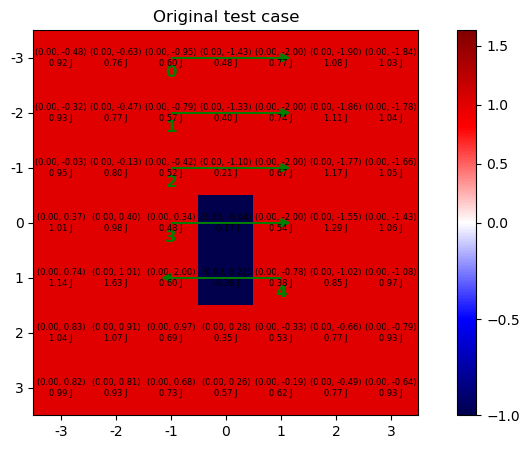

fdata.shape (1, 7, 7)
Time taken to create A:  0.031000614166259766
Error: X=0.04, Y=0.00, Z=0.00, Total=0.04


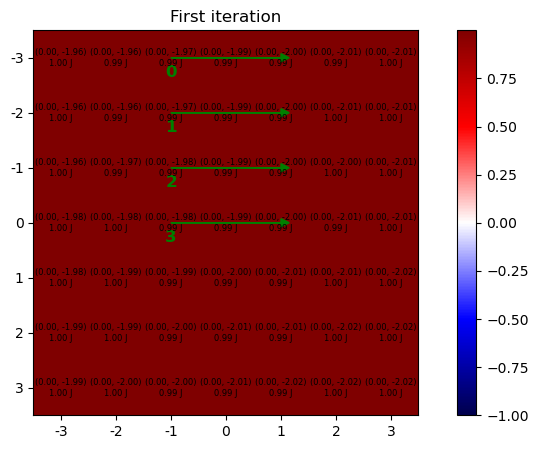

fdata.shape (1, 7, 7)
Time taken to create A:  0.03201127052307129
Error: X=3.99, Y=0.00, Z=0.00, Total=3.99


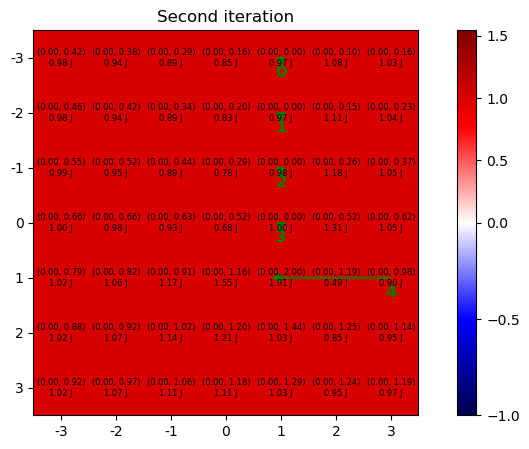

fdata.shape (1, 7, 7)
Time taken to create A:  0.043004512786865234
Error: X=5.92, Y=0.00, Z=0.00, Total=5.92


In [8]:
# Create original test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    [0, 3, 2], 
                    [0, 4, 4]
                    ])

fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 2]
                    ])

original_mpoints = mpoints.copy()
original_fpoints = fpoints.copy()

# Create data object and visualize it
d = Data(mpoints, fpoints, (7, 7))
d.show("Original test case")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")


# Create 1st binned test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    [0, 3, 2], 
                    #[0, 4, 5]
                    ])
fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    #[0, 4, 2]
                    ])

# Create data object and visualize it
d = Data(mpoints, fpoints, (7, 7))
d.show("First iteration")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")


# Create 2nd iterated binned test case
mpoints = np.array([
                    [0, 0, 4], 
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 6]
                    ])
fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 4]
                    ])

# Create data object and visualize it
d = Data(mpoints, fpoints, (7, 7))
d.show("Second iteration")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

### Check inversion

In [ ]:
resolution = (7, 7)

# Create original test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    #[0, 3, 2], 
                    #[0, 4, 4]
                    ])

fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 3], 
                    [0, 4, 4], 
                    #[0, 3, 4], 
                    #[0, 4, 2]
                    ])
original_mpoints = mpoints.copy()
original_fpoints = fpoints.copy()


###############################################################################

# Create data object and visualize it
d = Data(mpoints, fpoints, resolution)
d.show("Original test case")

# Example displacement vector field (DVF) in the fixed image space
# (2, Y, X) where the first array is dx and the second array is dy
deformation_fixed = np.random.rand(2, resolution[1], resolution[0])  # Replace with actual DVF (dx, dy)
deformation_fixed = d.deformation[1:, 0, :, :]
#print("Deformation:\n", deformation_fixed)

# Create a mesh grid of pixel coordinates in the moving image (integer coordinates)
y_coords, x_coords = np.meshgrid(np.arange(resolution[1]), np.arange(resolution[0]), indexing='ij')

# Calculate the corresponding moving image coordinates
m_x_coords = x_coords + deformation_fixed[1]  # Add dx
m_y_coords = y_coords + deformation_fixed[0]  # Add dy

# Now (f_x_coords, f_y_coords) give the coordinates in the fixed image
# where each pixel in the moving image originally came from
print("\nMoving image coordinates (m_y, m_x):\n", m_y_coords, "\n\n", m_x_coords)
print("\nFixed image coordinates (f_y, f_x):\n", y_coords, "\n\n", x_coords)

# List out these pairs
print()
# Flatten the coordinate grids and combine them into coordinate pairs
# Moving coordinates (A) - flatten y and x coordinates
A_y_flat = m_y_coords.flatten()
A_x_flat = m_x_coords.flatten()
A = np.column_stack((A_y_flat, A_x_flat))  # Set A (moving coordinates)

# Fixed coordinates (B) - flatten y and x coordinates  
B_y_flat = y_coords.flatten()
B_x_flat = x_coords.flatten()
B = np.column_stack((B_y_flat, B_x_flat))  # Set B (fixed coordinates)

print("A:\n", A)
print("B:\n", B)

"""
for i in range(resolution[0]):
    for j in range(resolution[1]):
        print(f"({m_y_coords[i, j]}, {m_x_coords[i, j]}) -> ({y_coords[i, j]}, {x_coords[i, j]})")
        if j % 6 == 0 and j != 0:
            print("\n")
"""

In [ ]:
d = Data(mpoints, fpoints, resolution)
d.show("Original fixed test case")

d = Data(fpoints, mpoints, resolution)
d.show("Inverted moving case")

A_prime = B
method = 'linear'
B_prime = interpolate_coordinates_2d(A, B, A_prime, method=method)

print(f"{method} interpolation results:")
for i in range(len(A_prime)):
    curr_A = A_prime[i]
    curr_B = B_prime[i]
    print(f"Query point ({curr_A[0]:.2f}, {curr_A[1]:.2f}) -> Interpolated point ({curr_B[0]:.2f}, {curr_B[1]:.2f})")
#print(f"  {method:8} -> {B_prime}")

### Bigger case

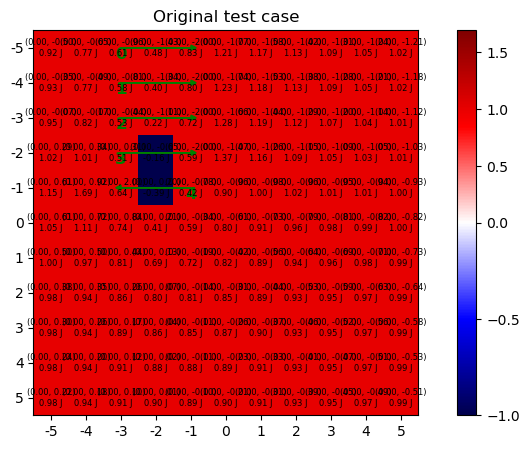

fdata.shape (1, 11, 11)
Time taken to create A:  0.046506643295288086
Error: X=0.04, Y=0.00, Z=0.00, Total=0.04


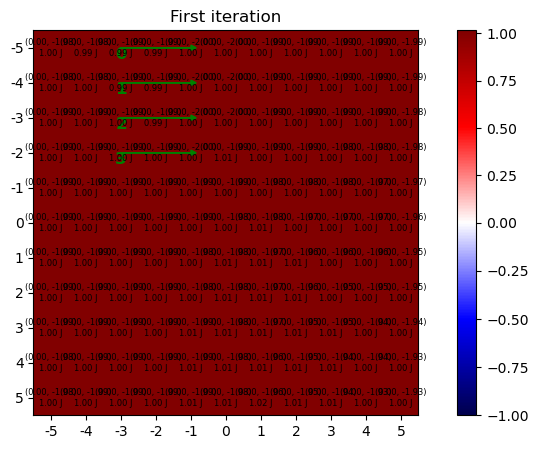

fdata.shape (1, 11, 11)
Time taken to create A:  0.03351020812988281
Error: X=3.99, Y=0.00, Z=0.00, Total=3.99


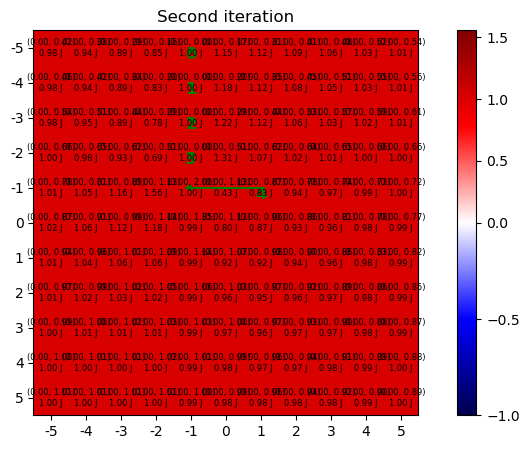

fdata.shape (1, 11, 11)
Time taken to create A:  0.037000417709350586
Error: X=6.04, Y=0.00, Z=0.00, Total=6.04


In [9]:
resolution = (11, 11)

# Create original test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    [0, 3, 2], 
                    [0, 4, 4]
                    ])

fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 2]
                    ])
original_mpoints = mpoints.copy()
original_fpoints = fpoints.copy()

# Create data object and visualize it
d = Data(mpoints, fpoints, resolution)
d.show("Original test case")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Create 1st binned test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    [0, 3, 2], 
                    #[0, 4, 5]
                    ])
fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    #[0, 4, 2]
                    ])

# Create data object and visualize it
d = Data(mpoints, fpoints, resolution)
d.show("First iteration")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Create 2nd iterated binned test case
mpoints = np.array([
                    [0, 0, 4], 
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 6]
                    ])
fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 4], 
                    [0, 2, 4], 
                    [0, 3, 4], 
                    [0, 4, 4]
                    ])

# Create data object and visualize it
d = Data(mpoints, fpoints, resolution)
d.show("Second iteration")
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

## Real test

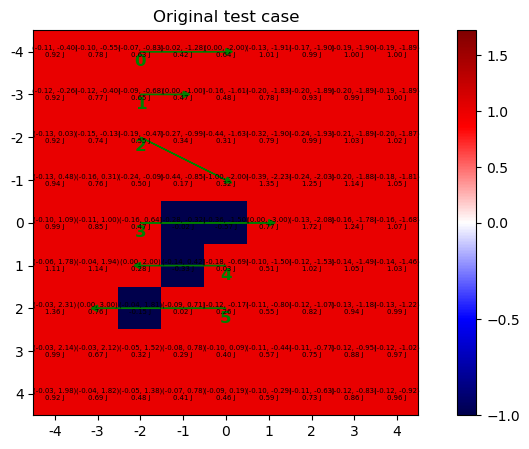

fdata.shape (1, 9, 9)
Time taken to create A:  0.03250932693481445
Error: X=0.05, Y=0.01, Z=0.00, Total=0.05


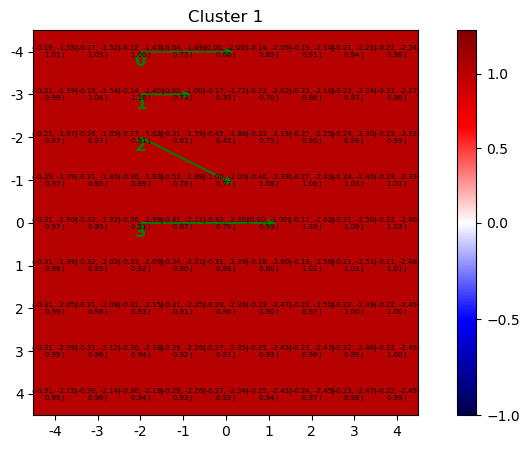

fdata.shape (1, 9, 9)
Time taken to create A:  0.035500526428222656
Error: X=6.53, Y=0.46, Z=0.00, Total=6.98


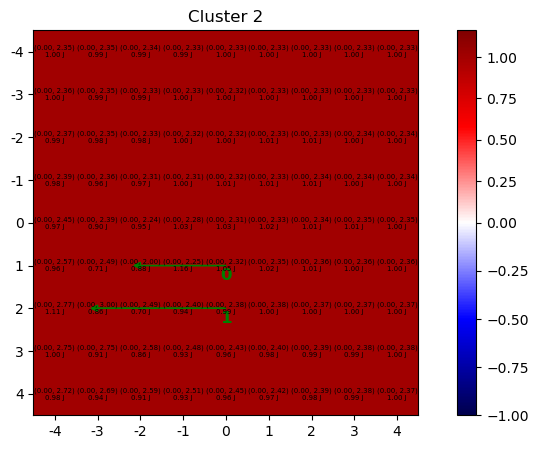

fdata.shape (1, 9, 9)
Time taken to create A:  0.033498287200927734
Error: X=8.77, Y=1.00, Z=0.00, Total=9.30


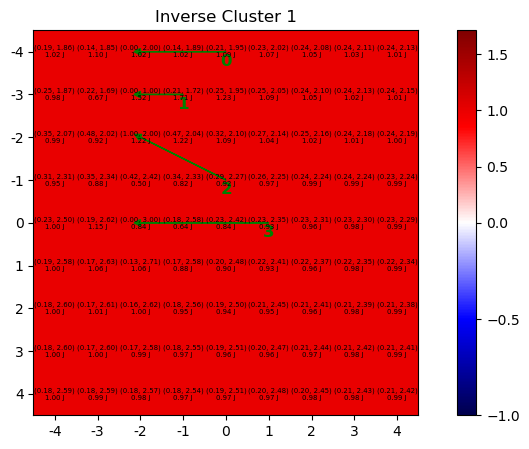

4
[[0 0 4]
 [0 1 3]
 [0 3 4]
 [0 4 5]
 [0 5 4]
 [0 6 4]]
New coordinate for point 4:
	moving:	[0 5 4] -> [0 5 6]
	fixed:	[0 5 2] -> [0 5 5]
5
[[0 0 4]
 [0 1 3]
 [0 3 4]
 [0 4 5]
 [0 5 6]
 [0 6 4]]
New coordinate for point 5:
	moving:	[0 6 4] -> [0 6 7]
	fixed:	[0 6 1] -> [0 6 4]


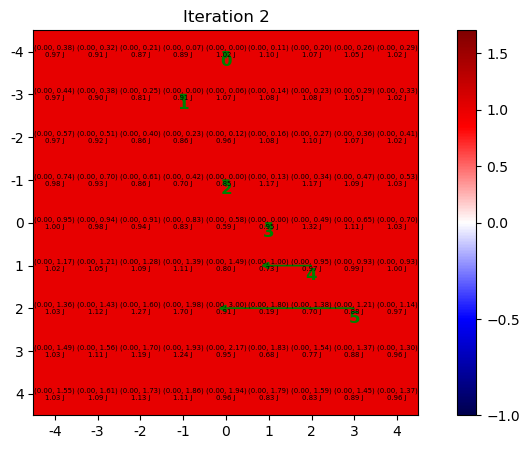

fdata.shape (1, 9, 9)
Time taken to create A:  0.03401994705200195
Error: X=6.46, Y=1.00, Z=0.00, Total=6.84


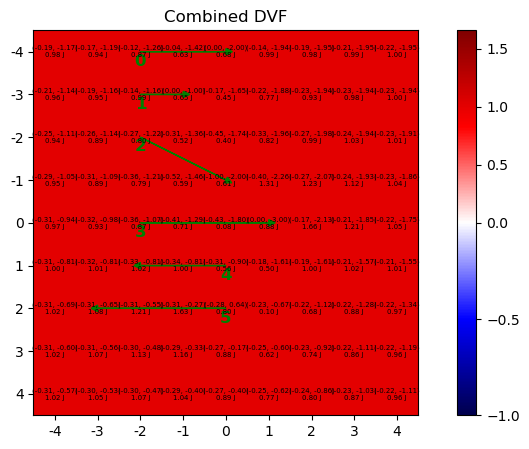

fdata.shape (1, 9, 9)
Time taken to create A:  0.03500843048095703
Error: X=6.48, Y=0.46, Z=0.00, Total=6.81


In [10]:
resolution = (9, 9)
fontsize = 5

# Create original test case
mpoints = np.array([
                    [0, 0, 2], 
                    [0, 1, 2], 
                    [0, 2, 2], 
                    [0, 4, 2], 
                    # Cluster 2
                    [0, 5, 4],
                    [0, 6, 4],
                    ])

fpoints = np.array([
                    [0, 0, 4],
                    [0, 1, 3], 
                    [0, 3, 4], 
                    [0, 4, 5], 
                    # Cluster 2
                    [0, 5, 2],
                    [0, 6, 1],
                    ])
original_mpoints = mpoints.copy()
original_fpoints = fpoints.copy()

cluster1 = [0, 1, 2, 3]
cluster2 = [4, 5]

###############################################################################
# Create original test case
###############################################################################

# Create data object and visualize it
d = Data(mpoints, fpoints, resolution)
d.show("Original test case", fontsize=fontsize)
err_x, err_y, err_z, total_err = compute_error(d.resolution, original_mpoints, original_fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

d1c1 = Data(mpoints[cluster1], fpoints[cluster1], resolution)
d1c1.show("Cluster 1", fontsize=fontsize)
err_x, err_y, err_z, total_err = compute_error(d1c1.resolution, original_mpoints, original_fpoints, d1c1.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

d1c2 = Data(mpoints[cluster2], fpoints[cluster2], resolution)
d1c2.show("Cluster 2", fontsize=fontsize)
err_x, err_y, err_z, total_err = compute_error(d1c2.resolution, original_mpoints, original_fpoints, d1c2.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
###############################################################################
# Iteration 1
###############################################################################

# Get inverse of first iteration
d1c1_inv = Data(fpoints[cluster1], mpoints[cluster1], resolution)
d1c1_inv.show("Inverse Cluster 1", fontsize=fontsize)

# Fix the moving points to the fixed points in the current cluster
d1_mpoints = mpoints.copy()
d1_mpoints[cluster1] = fpoints[cluster1]
d1_fpoints = fpoints.copy()

# Compute the new positions of the moving points for the other points
for i in range(len(cluster2)):
    curr_idx = cluster2[i]
    print(curr_idx)
    print(d1_mpoints)
    
    curr_mcoord = d1_mpoints[curr_idx]
    curr_fcoord = d1_fpoints[curr_idx]
    
    new_mdisplacement = d1c1_inv.deformation[:, 0, curr_mcoord[1], curr_mcoord[2]]
    new_fdisplacement = d1c1_inv.deformation[:, 0, curr_fcoord[1], curr_fcoord[2]]
    
    new_mcoord = curr_mcoord + new_mdisplacement
    new_mcoord = np.round(new_mcoord).astype(int)  # Round to nearest integer coordinates
    
    new_fcoord = curr_fcoord + new_fdisplacement
    new_fcoord = np.round(new_fcoord).astype(int)  # Round to nearest integer coordinates
    
    print(f"New coordinate for point {curr_idx}:\n\tmoving:\t{curr_mcoord} -> {new_mcoord}\n\tfixed:\t{curr_fcoord} -> {new_fcoord}")
    d1_mpoints[curr_idx] = new_mcoord
    d1_fpoints[curr_idx] = new_fcoord

d2 = Data(d1_mpoints, d1_fpoints, resolution)
d2.show("Iteration 2", fontsize=fontsize)
err_x, err_y, err_z, total_err = compute_error(d2.resolution, original_mpoints, original_fpoints, d2.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

###############################################################################
# Combined DVF
###############################################################################
combined_dvf = d1c1.deformation.copy() + d2.deformation.copy()
jdet_field = jacobian.sitk_jacobian_determinant(combined_dvf)[0]
d2.mpoints = mpoints.copy()
d2.fpoints = fpoints.copy()
d2.deformation = combined_dvf
d2.jdet_field = jdet_field
d2.show("Combined DVF", fontsize=fontsize)
err_x, err_y, err_z, total_err = compute_error(d2.resolution, original_mpoints, original_fpoints, d2.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

## Cluster iteration

In [38]:
###############################################################################
# Reusable Cluster Iteration Function
###############################################################################

def cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=5, verbose=True):
    """
    Iteratively update clusters of points, fixing each cluster in turn and updating the rest, except the last cluster.
    Coordinates fixed in previous clusters are not modified in subsequent iterations.
    At the end, shows a combined DVF as in the manual code.
    Args:
        mpoints: np.ndarray, shape (N, 3)
        fpoints: np.ndarray, shape (N, 3)
        clusters: list of lists, each sublist contains indices for a cluster
        resolution: tuple, image resolution
        fontsize: int, for plotting
        verbose: bool, print debug info
    Returns:
        Data object after all iterations
    """
    mpoints_original = mpoints.copy()
    fpoints_original = fpoints.copy()
    mpoints = mpoints.copy()
    fpoints = fpoints.copy()
    d = Data(mpoints, fpoints, resolution)
    original_dvf = d.deformation.copy()
    if verbose:
        d.show("Original test case", fontsize=fontsize)
    # Store per-cluster Data objects for DVF combination
    cluster_datas = []
    fixed_indices = set()
    for i, cluster in enumerate(clusters[:]):
        #if i == len(clusters) - 1:
        #    # Last cluster, do not fix it, just show the original Data object
        #    if verbose:
        #        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        #        d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        #        break
        if verbose:
            print(f"\n--- Iteration {i+1}: Fixing cluster {cluster} ---")
        # Show current cluster
        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        if verbose:
            d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        cluster_datas.append(d_cluster)  # Add the original Data object to the list
        # Inverse mapping for current cluster
        d_cluster_inv = Data(fpoints[cluster], mpoints[cluster], resolution)
        # Fix the moving points to the fixed points in the current cluster
        mpoints[cluster] = fpoints[cluster]
        # Mark these indices as fixed
        fixed_indices.update(cluster)
        # Update the rest (only those not fixed in any previous cluster)
        other_indices = [idx for idx in range(len(mpoints)) if idx not in fixed_indices]
        for idx in other_indices:
            curr_mcoord = mpoints[idx]
            curr_fcoord = fpoints[idx]
            new_mdisplacement = d_cluster_inv.deformation[:, 0, curr_mcoord[1], curr_mcoord[2]]
            new_fdisplacement = d_cluster_inv.deformation[:, 0, curr_fcoord[1], curr_fcoord[2]]
            new_mcoord = curr_mcoord + new_mdisplacement
            new_mcoord = np.round(new_mcoord).astype(int)
            new_fcoord = curr_fcoord + new_fdisplacement
            new_fcoord = np.round(new_fcoord).astype(int)
            if verbose:
                print(f"New coordinate for point {idx}:\n\tmoving:\t{curr_mcoord} -> {new_mcoord}\n\tfixed:\t{curr_fcoord} -> {new_fcoord}")
            mpoints[idx] = new_mcoord
            fpoints[idx] = new_fcoord
        d = Data(mpoints, fpoints, resolution)
        cluster_datas.append(d)
        if verbose:
            d.show(f"Iteration {i+1}", fontsize=fontsize)
    # Show combined DVF if at least two clusters were processed
    if len(cluster_datas) >= 2:
        combined_dvf = cluster_datas[0].deformation.copy()
        for d_next in cluster_datas[1:]:
            combined_dvf += d_next.deformation.copy()
        jdet_field = jacobian.sitk_jacobian_determinant(combined_dvf)[0]
        d_combined = cluster_datas[-1]
        d_combined.mpoints = mpoints_original.copy()
        d_combined.fpoints = fpoints_original.copy()
        d_combined.deformation = combined_dvf
        d_combined.jdet_field = jdet_field
        l2_error = np.linalg.norm(d_combined.deformation - original_dvf)
        print(f"\nL2 error of combined DVF: {l2_error:.4f}")
        if verbose:
            d_combined.show("Combined DVF (original correspondences shown)", fontsize=fontsize)
    return d_combined

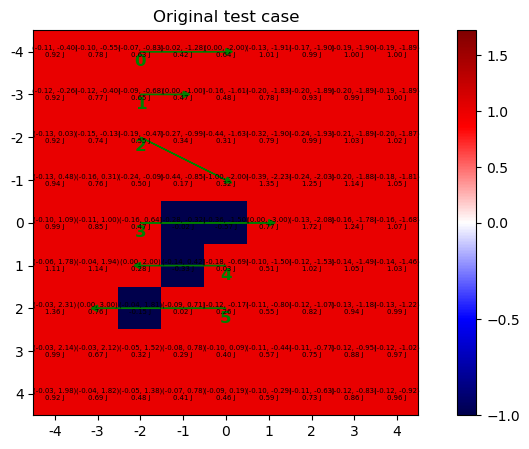


--- Iteration 1: Fixing cluster [0, 1, 2, 3] ---


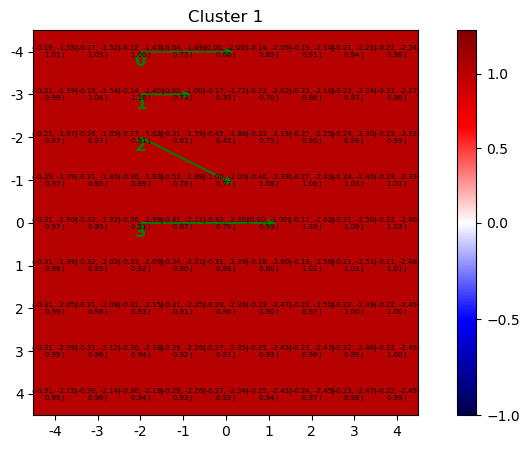

New coordinate for point 4:
	moving:	[0 5 4] -> [0 5 6]
	fixed:	[0 5 2] -> [0 5 5]
New coordinate for point 5:
	moving:	[0 6 4] -> [0 6 7]
	fixed:	[0 6 1] -> [0 6 4]


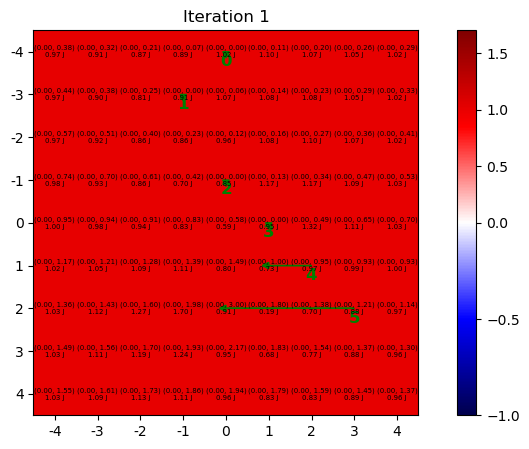


--- Iteration 2: Fixing cluster [4, 5] ---


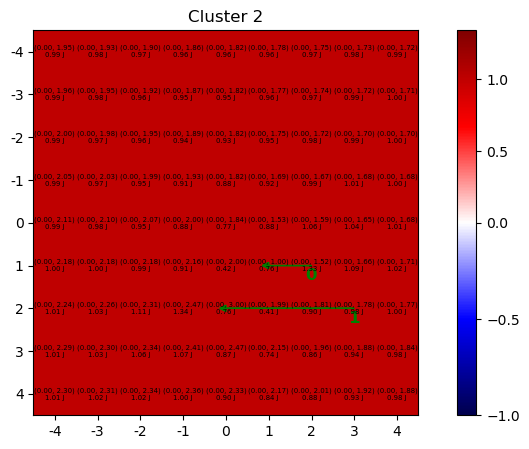

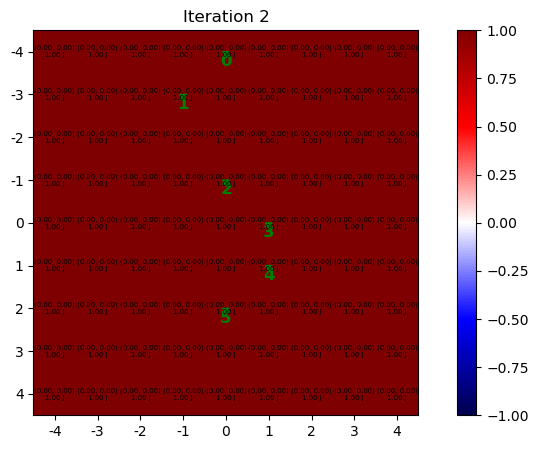


L2 error of combined DVF: 13.4120


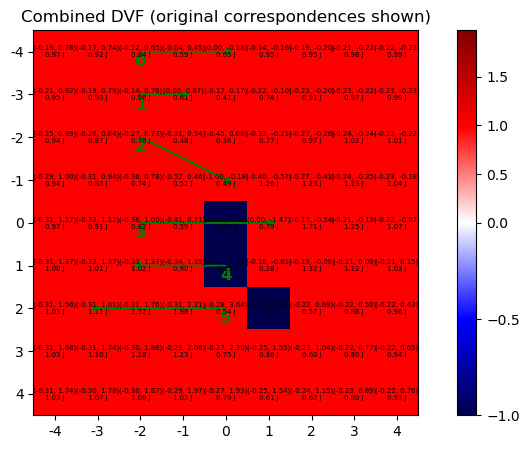

fdata.shape (1, 9, 9)
Time taken to create A:  0.04151582717895508
Error: X=9.14, Y=0.46, Z=0.00, Total=9.22


In [16]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    [0, 0, 2],
    [0, 1, 2],
    [0, 2, 2],
    [0, 4, 2],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    [0, 0, 4],
    [0, 1, 3],
    [0, 3, 4],
    [0, 4, 5],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[0, 1, 2, 3], [4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

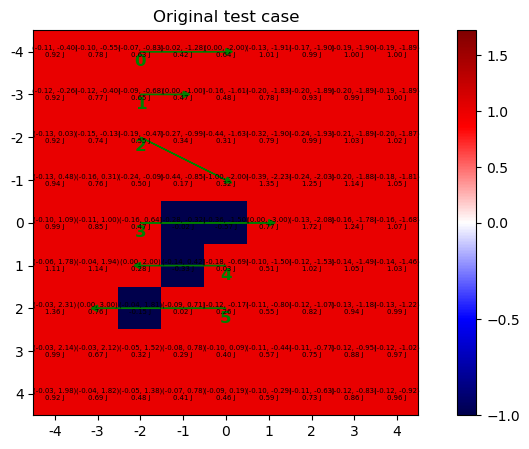


--- Iteration 1: Fixing cluster [4, 5] ---


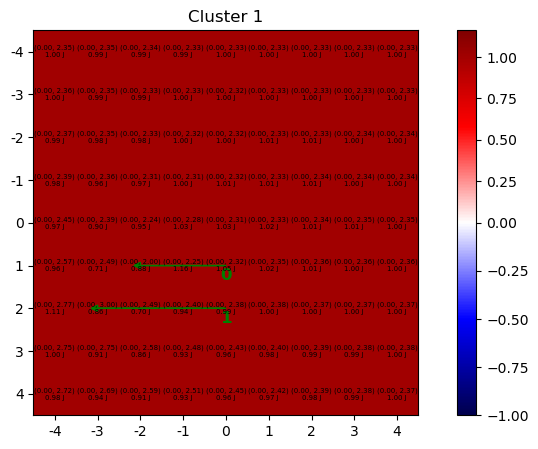

New coordinate for point 0:
	moving:	[0 0 2] -> [0 0 0]
	fixed:	[0 0 4] -> [0 0 2]
New coordinate for point 1:
	moving:	[0 1 2] -> [0 1 0]
	fixed:	[0 1 3] -> [0 1 1]
New coordinate for point 2:
	moving:	[0 2 2] -> [0 2 0]
	fixed:	[0 3 4] -> [0 3 2]
New coordinate for point 3:
	moving:	[0 4 2] -> [0 4 0]
	fixed:	[0 4 5] -> [0 4 3]


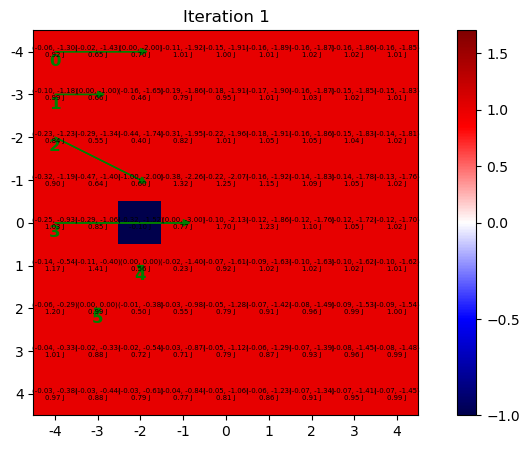


--- Iteration 2: Fixing cluster [0, 1, 2, 3] ---


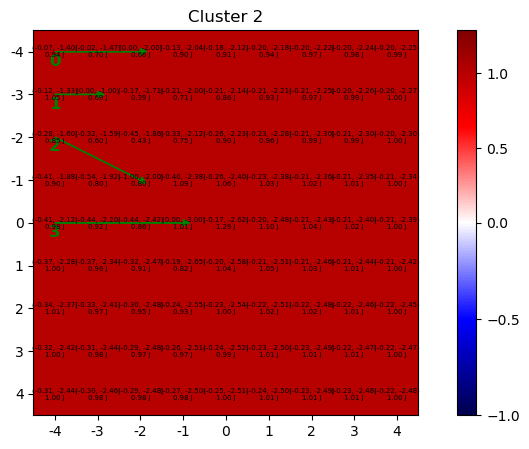

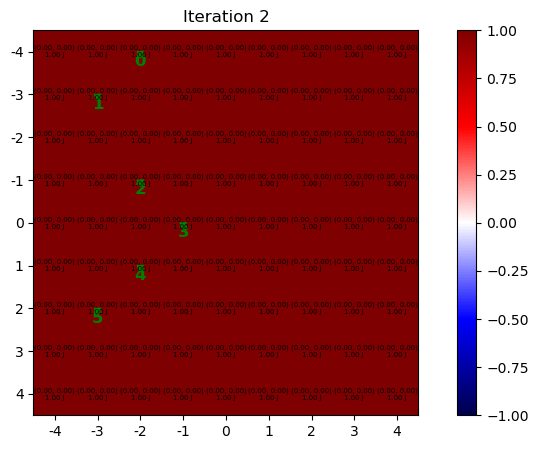


L2 error of combined DVF: 11.3210


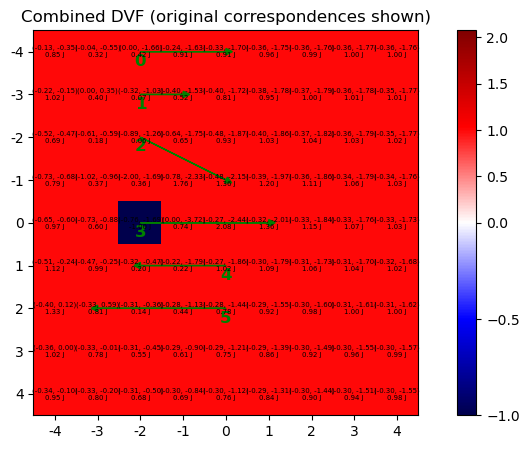

fdata.shape (1, 9, 9)
Time taken to create A:  0.04700875282287598
Error: X=8.63, Y=5.24, Z=0.00, Total=9.43


In [17]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    [0, 0, 2],
    [0, 1, 2],
    [0, 2, 2],
    [0, 4, 2],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    [0, 0, 4],
    [0, 1, 3],
    [0, 3, 4],
    [0, 4, 5],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[4, 5], [0, 1, 2, 3]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

### Test

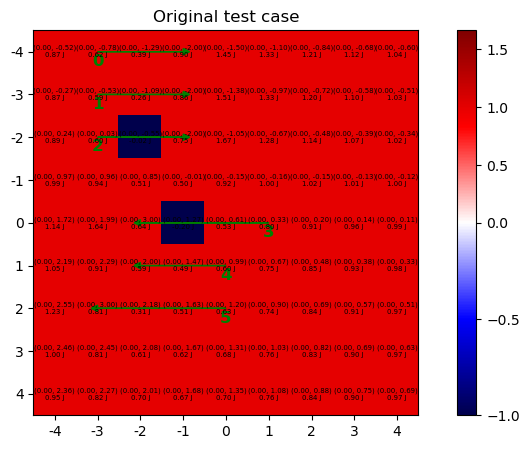


--- Iteration 1: Fixing cluster [0, 1, 2] ---


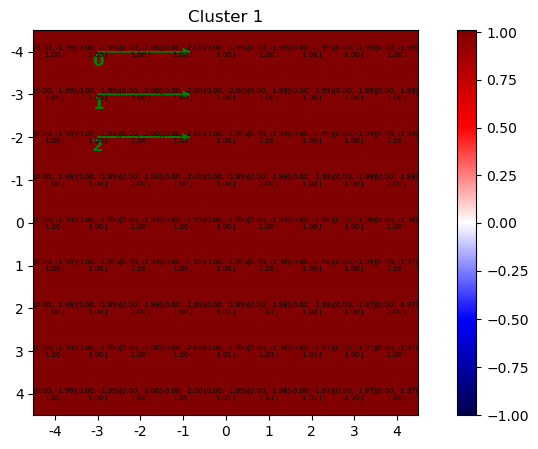

New coordinate for point 3:
	moving:	[0 4 5] -> [0 4 7]
	fixed:	[0 4 2] -> [0 4 4]
New coordinate for point 4:
	moving:	[0 5 4] -> [0 5 6]
	fixed:	[0 5 2] -> [0 5 4]
New coordinate for point 5:
	moving:	[0 6 4] -> [0 6 6]
	fixed:	[0 6 1] -> [0 6 3]


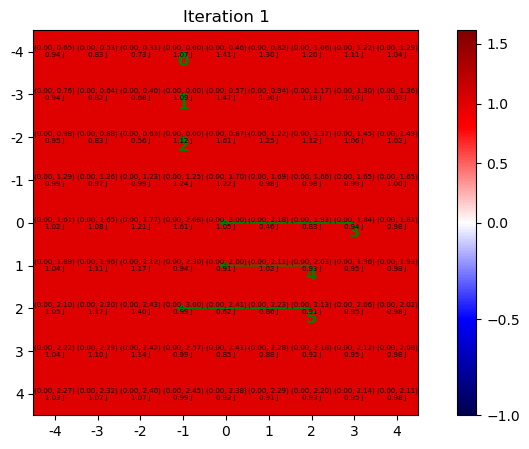


--- Iteration 2: Fixing cluster [3, 4, 5] ---


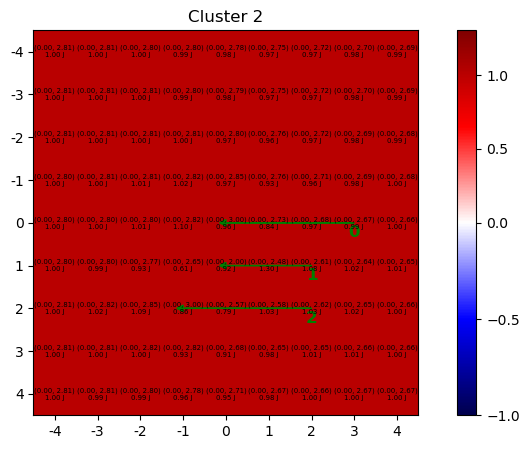

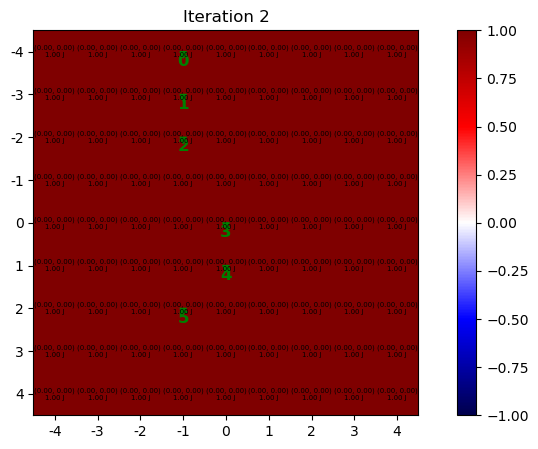


L2 error of combined DVF: 18.5600


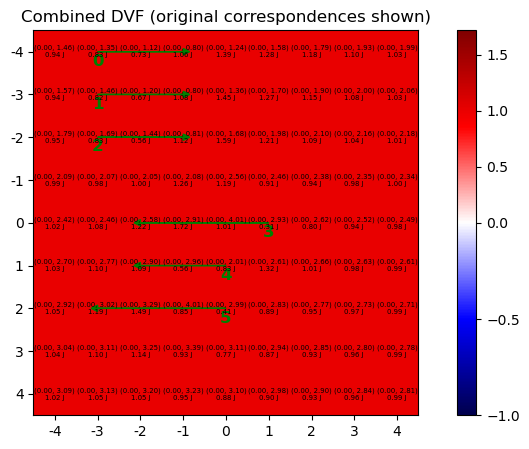

fdata.shape (1, 9, 9)
Time taken to create A:  0.03950762748718262
Error: X=9.40, Y=0.00, Z=0.00, Total=9.40


In [18]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 1],
    [0, 1, 1],
    [0, 2, 1],
    # Second cluster
    [0, 4, 5],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    # First cluster
    [0, 0, 3],
    [0, 1, 3],
    [0, 2, 3],
    # Second cluster
    [0, 4, 2],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[0, 1, 2], [3, 4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

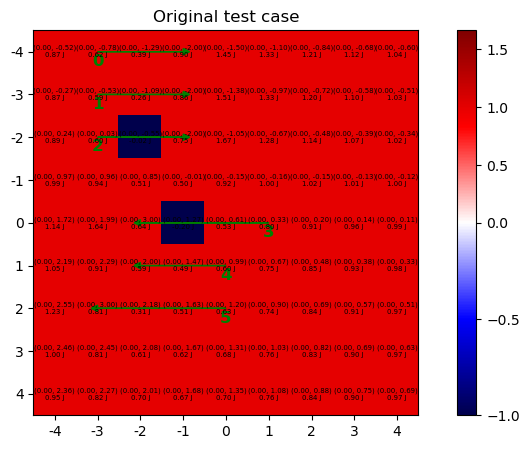


--- Iteration 1: Fixing cluster [3, 4, 5] ---


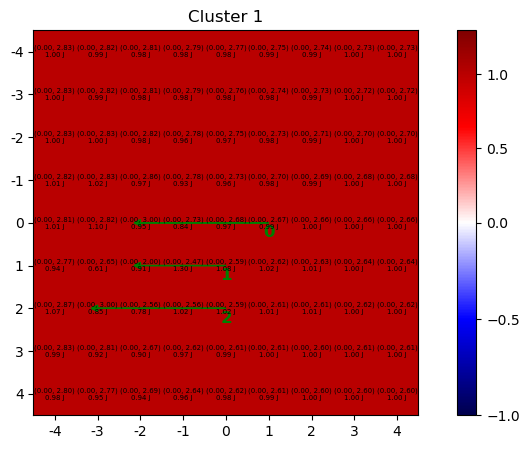

New coordinate for point 0:
	moving:	[0 0 1] -> [ 0  0 -2]
	fixed:	[0 0 3] -> [0 0 0]
New coordinate for point 1:
	moving:	[0 1 1] -> [ 0  1 -2]
	fixed:	[0 1 3] -> [0 1 0]
New coordinate for point 2:
	moving:	[0 2 1] -> [ 0  2 -2]
	fixed:	[0 2 3] -> [0 2 0]


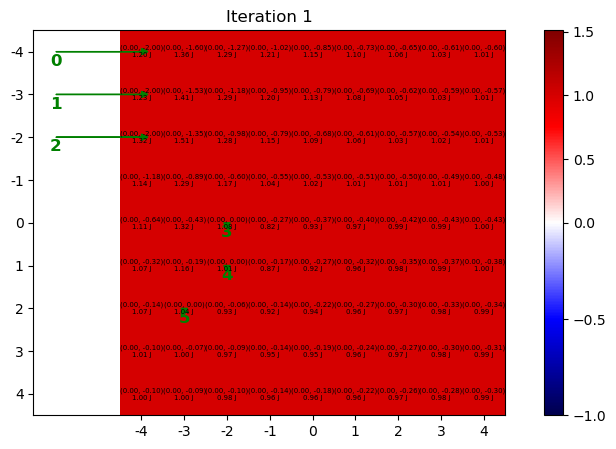


--- Iteration 2: Fixing cluster [0, 1, 2] ---


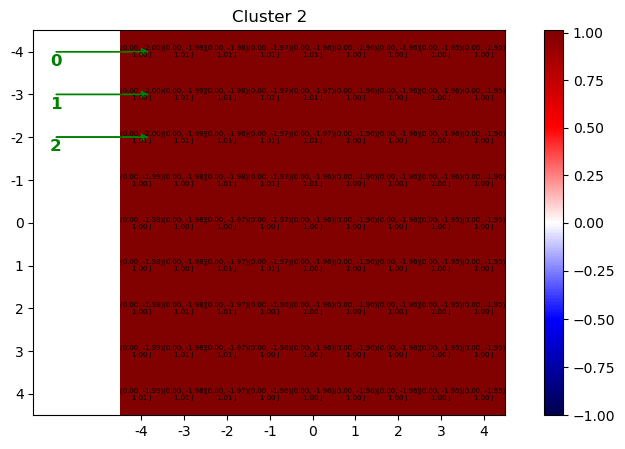

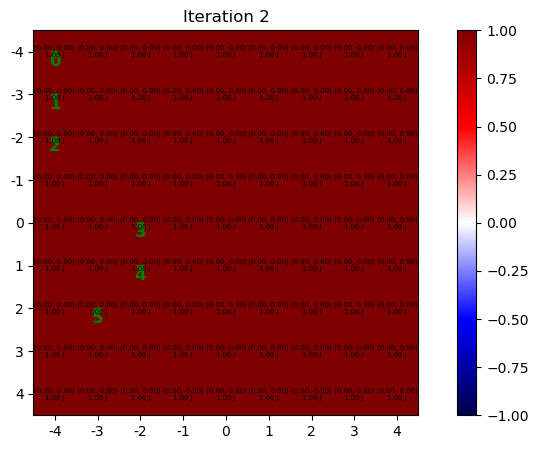


L2 error of combined DVF: 9.3775


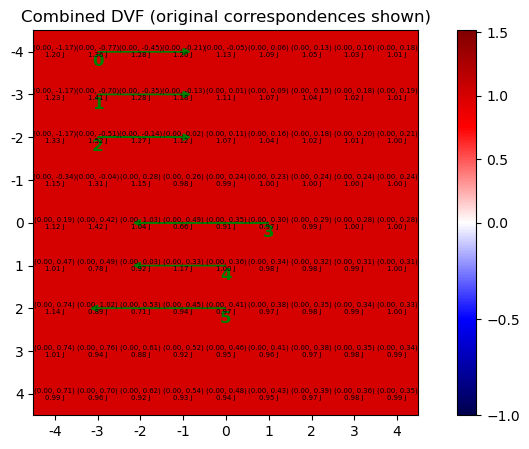

fdata.shape (1, 9, 9)
Time taken to create A:  0.04149937629699707
Error: X=5.01, Y=0.00, Z=0.00, Total=5.01


In [19]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 1],
    [0, 1, 1],
    [0, 2, 1],
    # Second cluster
    [0, 4, 5],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    # First cluster
    [0, 0, 3],
    [0, 1, 3],
    [0, 2, 3],
    # Second cluster
    [0, 4, 2],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[3, 4, 5], [0, 1, 2]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

### Test 2

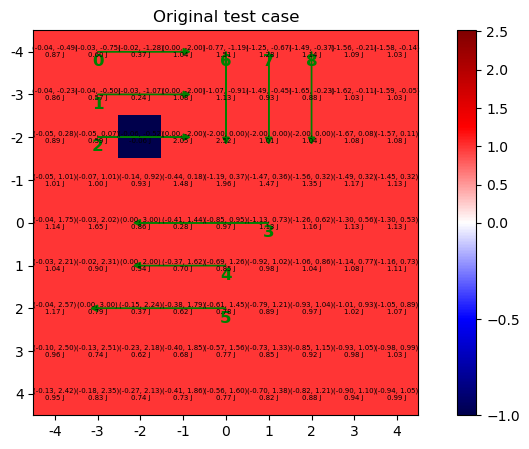


--- Iteration 1: Fixing cluster [0, 1, 2] ---


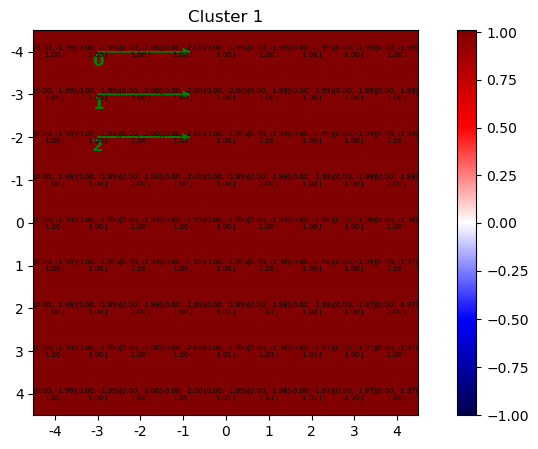

New coordinate for point 3:
	moving:	[0 4 5] -> [0 4 7]
	fixed:	[0 4 2] -> [0 4 4]
New coordinate for point 4:
	moving:	[0 5 4] -> [0 5 6]
	fixed:	[0 5 2] -> [0 5 4]
New coordinate for point 5:
	moving:	[0 6 4] -> [0 6 6]
	fixed:	[0 6 1] -> [0 6 3]
New coordinate for point 6:
	moving:	[0 0 4] -> [0 0 6]
	fixed:	[0 2 4] -> [0 2 6]
New coordinate for point 7:
	moving:	[0 0 5] -> [0 0 7]
	fixed:	[0 2 5] -> [0 2 7]
New coordinate for point 8:
	moving:	[0 0 6] -> [0 0 8]
	fixed:	[0 2 6] -> [0 2 8]


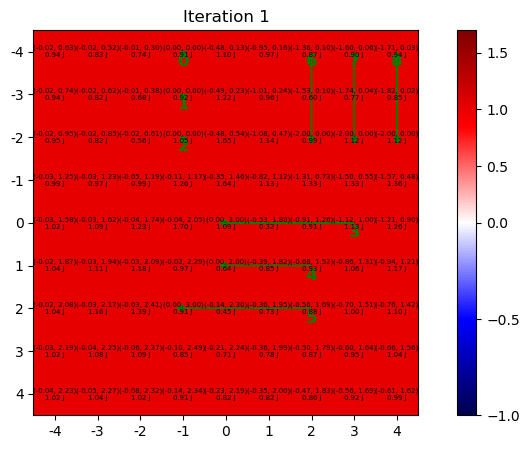


--- Iteration 2: Fixing cluster [3, 4, 5] ---


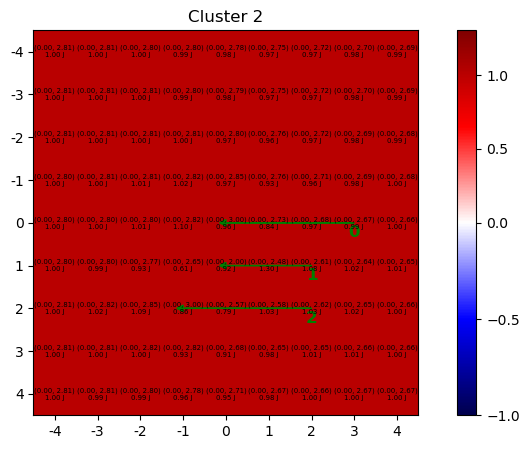

New coordinate for point 6:
	moving:	[0 0 6] -> [0 0 3]
	fixed:	[0 2 6] -> [0 2 3]
New coordinate for point 7:
	moving:	[0 0 7] -> [0 0 4]
	fixed:	[0 2 7] -> [0 2 4]
New coordinate for point 8:
	moving:	[0 0 8] -> [0 0 5]
	fixed:	[0 2 8] -> [0 2 5]


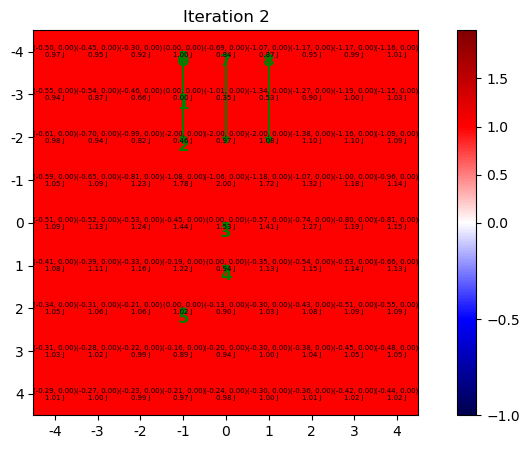


--- Iteration 3: Fixing cluster [6, 7, 8] ---


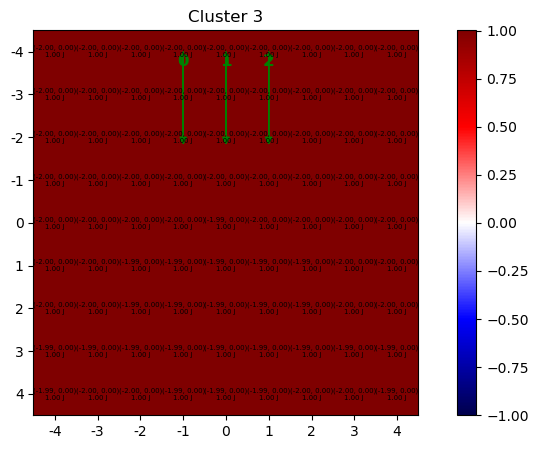

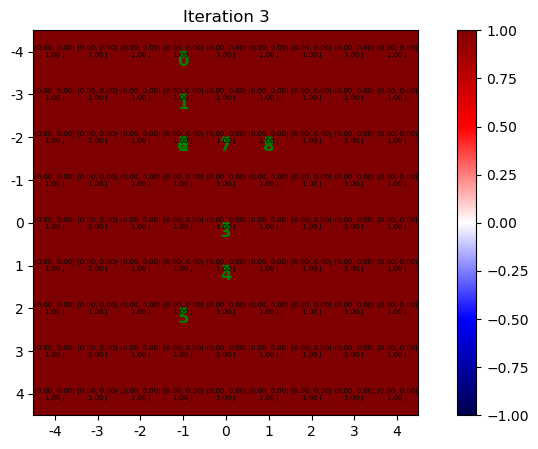


L2 error of combined DVF: 25.6654


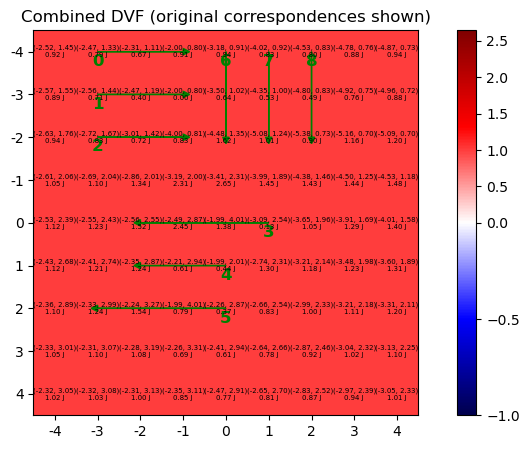

fdata.shape (1, 9, 9)
Time taken to create A:  0.04101419448852539
Error: X=9.94, Y=9.00, Z=0.00, Total=12.27


In [20]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 1],
    [0, 1, 1],
    [0, 2, 1],
    # Second cluster
    [0, 4, 5],
    [0, 5, 4],
    [0, 6, 4],
    # Third cluster
    [0, 0, 4],
    [0, 0, 5],
    [0, 0, 6],
    
])
fpoints = np.array([
    # First cluster
    [0, 0, 3],
    [0, 1, 3],
    [0, 2, 3],
    # Second cluster
    [0, 4, 2],
    [0, 5, 2],
    [0, 6, 1],
    # Third cluster
    [0, 2, 4],
    [0, 2, 5],
    [0, 2, 6],
])
clusters = [[0, 1, 2], [3, 4, 5], [6, 7, 8]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

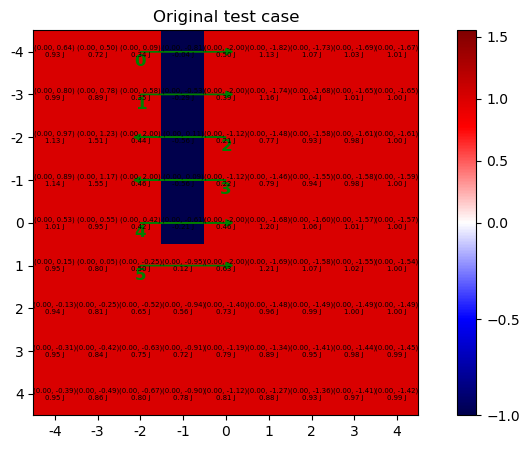


--- Iteration 1: Fixing cluster [0, 1] ---


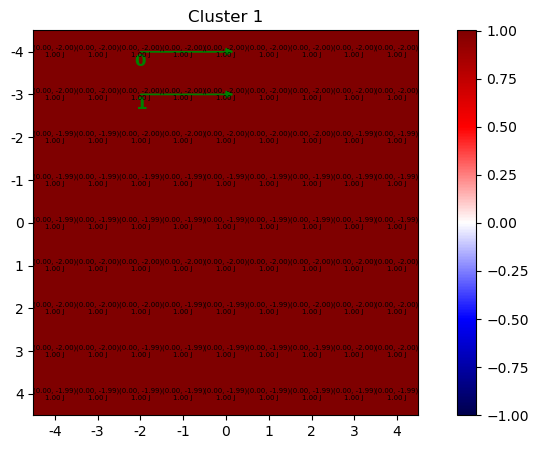

New coordinate for point 2:
	moving:	[0 2 4] -> [0 2 6]
	fixed:	[0 2 2] -> [0 2 4]
New coordinate for point 3:
	moving:	[0 3 4] -> [0 3 6]
	fixed:	[0 3 2] -> [0 3 4]
New coordinate for point 4:
	moving:	[0 4 2] -> [0 4 4]
	fixed:	[0 4 4] -> [0 4 6]
New coordinate for point 5:
	moving:	[0 5 2] -> [0 5 4]
	fixed:	[0 5 4] -> [0 5 6]


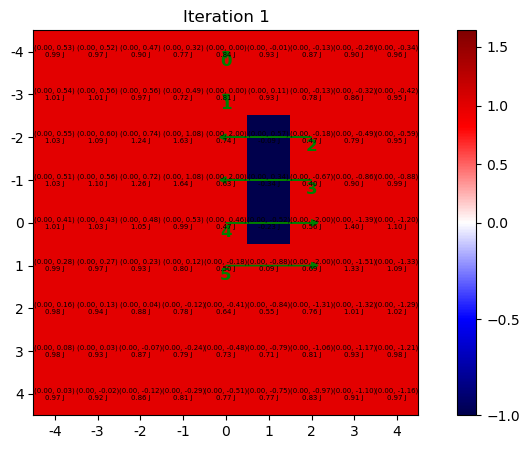


--- Iteration 2: Fixing cluster [2, 3] ---


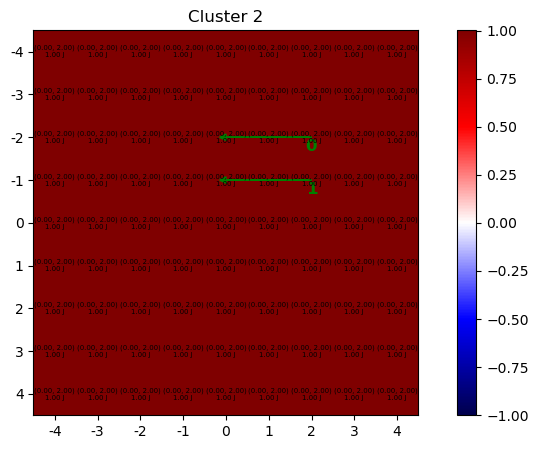

New coordinate for point 4:
	moving:	[0 4 4] -> [0 4 2]
	fixed:	[0 4 6] -> [0 4 4]
New coordinate for point 5:
	moving:	[0 5 4] -> [0 5 2]
	fixed:	[0 5 6] -> [0 5 4]


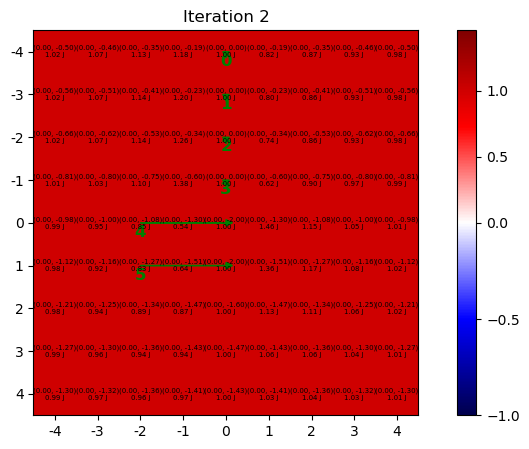


--- Iteration 3: Fixing cluster [4, 5] ---


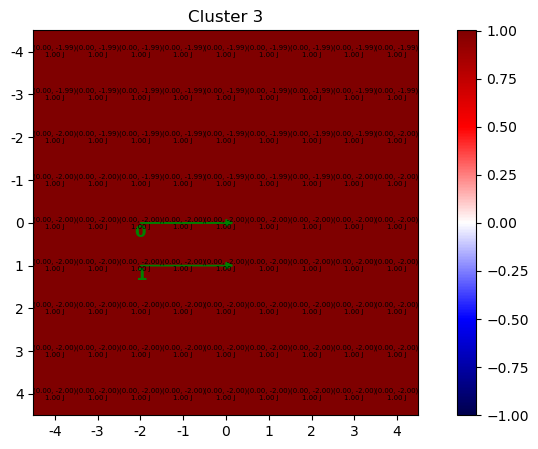

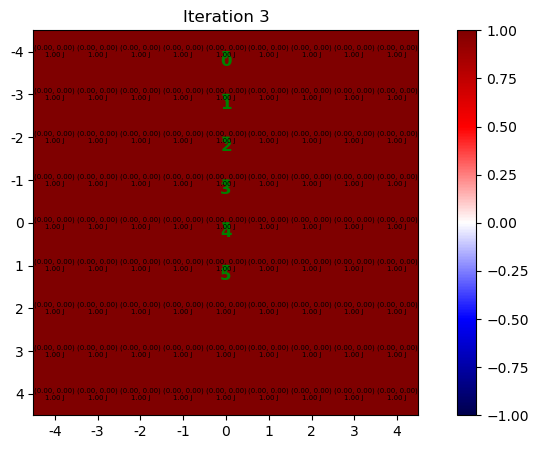


L2 error of combined DVF: 22.6191


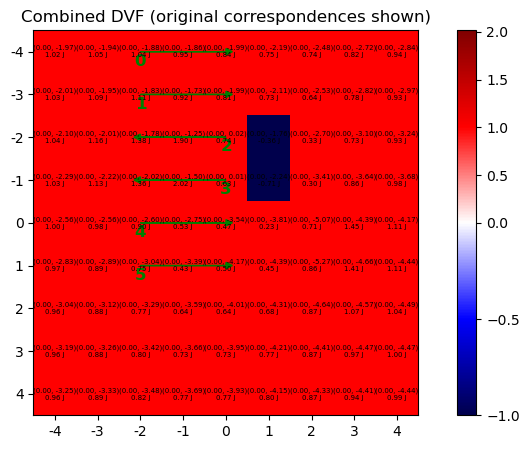

fdata.shape (1, 9, 9)
Time taken to create A:  0.045006752014160156
Error: X=11.54, Y=0.00, Z=0.00, Total=11.54


In [21]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 2],
    [0, 1, 2],
    # Second cluster
    [0, 2, 4],
    [0, 3, 4],
    # Third cluster
    [0, 4, 2],
    [0, 5, 2],
    
])
fpoints = np.array([
    # First cluster
    [0, 0, 4],
    [0, 1, 4],
    # Second cluster
    [0, 2, 2],
    [0, 3, 2],
    # Third cluster
    [0, 4, 4],
    [0, 5, 4],
])
clusters = [[0, 1], [2, 3], [4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

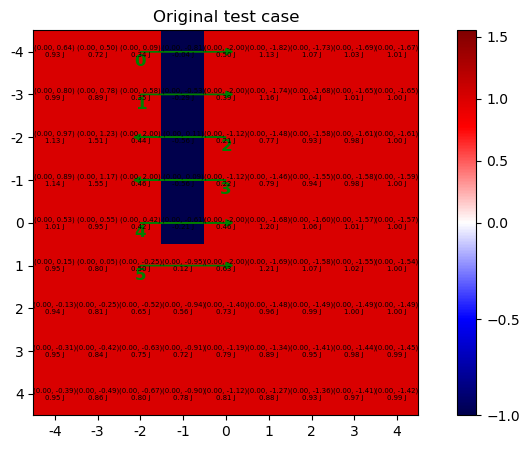


--- Iteration 1: Fixing cluster [2, 3] ---


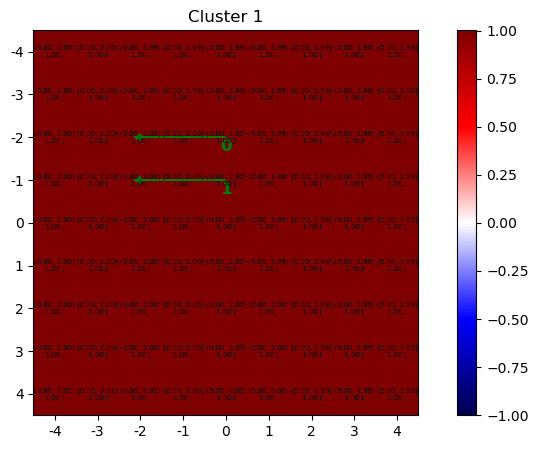

New coordinate for point 0:
	moving:	[0 0 2] -> [0 0 0]
	fixed:	[0 0 4] -> [0 0 2]
New coordinate for point 1:
	moving:	[0 1 2] -> [0 1 0]
	fixed:	[0 1 4] -> [0 1 2]
New coordinate for point 4:
	moving:	[0 4 2] -> [0 4 0]
	fixed:	[0 4 4] -> [0 4 2]
New coordinate for point 5:
	moving:	[0 5 2] -> [0 5 0]
	fixed:	[0 5 4] -> [0 5 2]


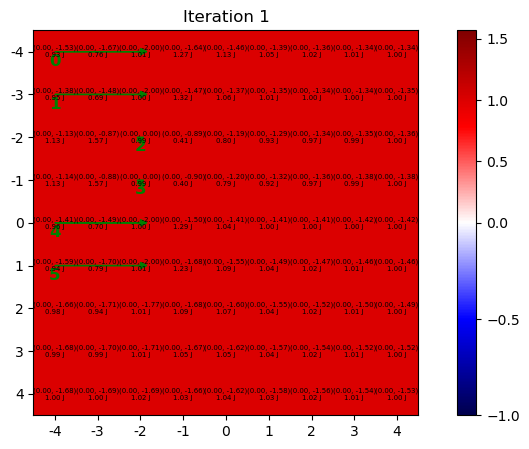


--- Iteration 2: Fixing cluster [4, 5] ---


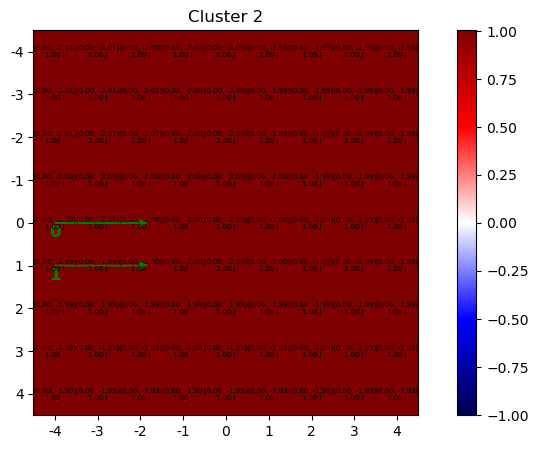

New coordinate for point 0:
	moving:	[0 0 0] -> [0 0 2]
	fixed:	[0 0 2] -> [0 0 4]
New coordinate for point 1:
	moving:	[0 1 0] -> [0 1 2]
	fixed:	[0 1 2] -> [0 1 4]


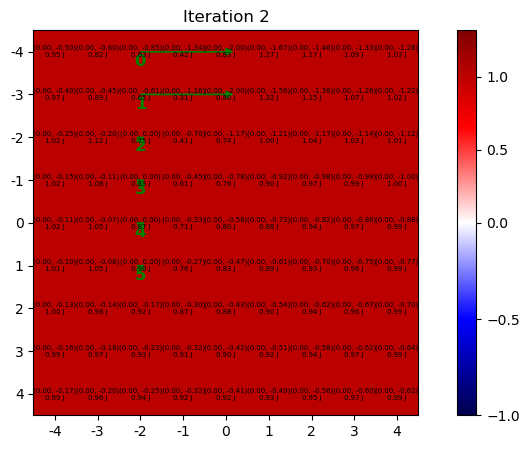


--- Iteration 3: Fixing cluster [0, 1] ---


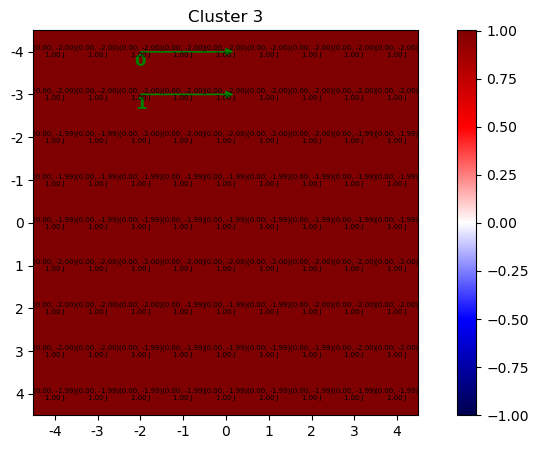

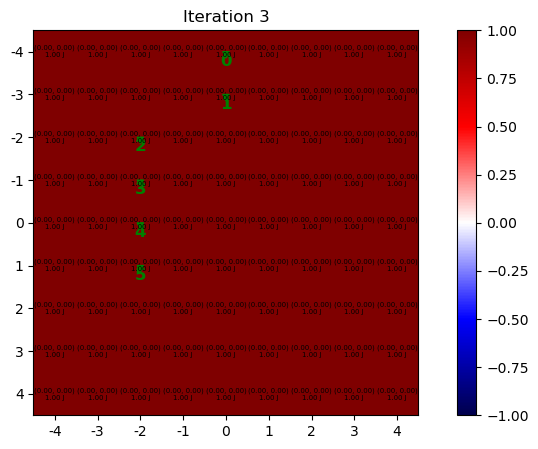


L2 error of combined DVF: 30.1351


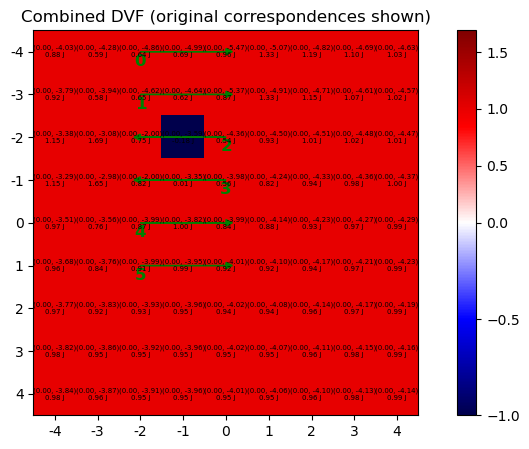

fdata.shape (1, 9, 9)
Time taken to create A:  0.041010379791259766
Error: X=8.95, Y=0.00, Z=0.00, Total=8.95


In [22]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 2],
    [0, 1, 2],
    # Second cluster
    [0, 2, 4],
    [0, 3, 4],
    # Third cluster
    [0, 4, 2],
    [0, 5, 2],
    
])
fpoints = np.array([
    # First cluster
    [0, 0, 4],
    [0, 1, 4],
    # Second cluster
    [0, 2, 2],
    [0, 3, 2],
    # Third cluster
    [0, 4, 4],
    [0, 5, 4],
])
clusters = [[2, 3], [4, 5], [0, 1]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

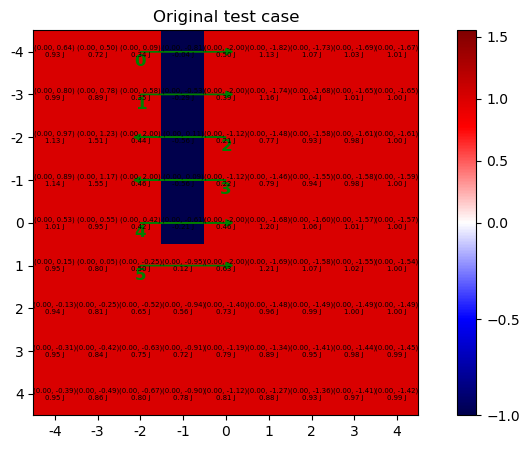


--- Iteration 1: Fixing cluster [0, 1, 4, 5] ---


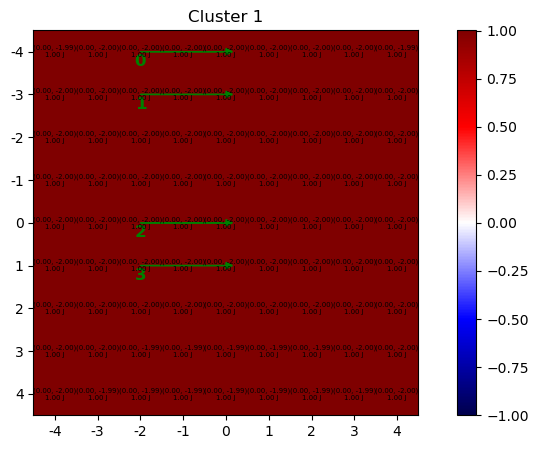

New coordinate for point 2:
	moving:	[0 2 4] -> [0 2 6]
	fixed:	[0 2 2] -> [0 2 4]
New coordinate for point 3:
	moving:	[0 3 4] -> [0 3 6]
	fixed:	[0 3 2] -> [0 3 4]


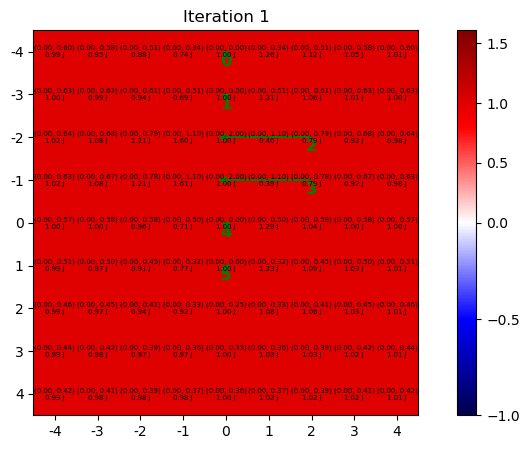


--- Iteration 2: Fixing cluster [2, 3] ---


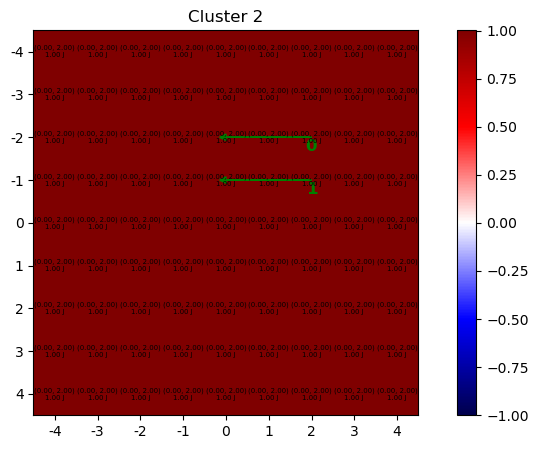

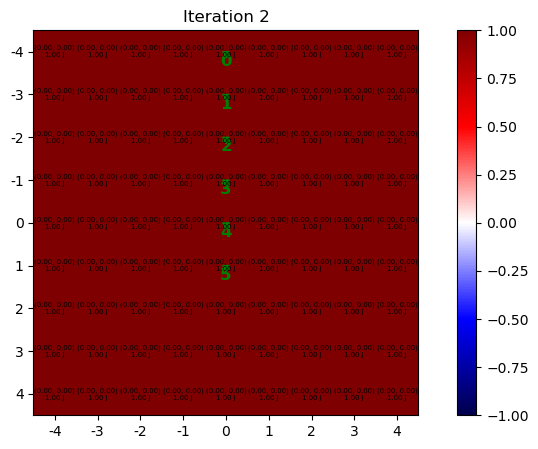


L2 error of combined DVF: 15.0632


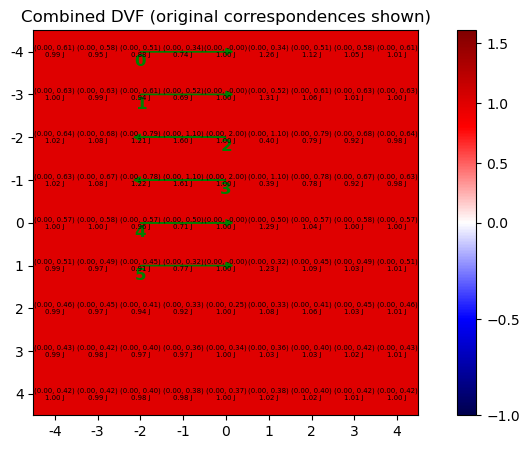

fdata.shape (1, 9, 9)
Time taken to create A:  0.04301333427429199
Error: X=6.92, Y=0.00, Z=0.00, Total=6.92


In [23]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 2],
    [0, 1, 2],
    # Second cluster
    [0, 2, 4],
    [0, 3, 4],
    # Third cluster
    [0, 4, 2],
    [0, 5, 2],
    
])
fpoints = np.array([
    # First cluster
    [0, 0, 4],
    [0, 1, 4],
    # Second cluster
    [0, 2, 2],
    [0, 3, 2],
    # Third cluster
    [0, 4, 4],
    [0, 5, 4],
])
clusters = [[0, 1, 4, 5], [2, 3] ]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

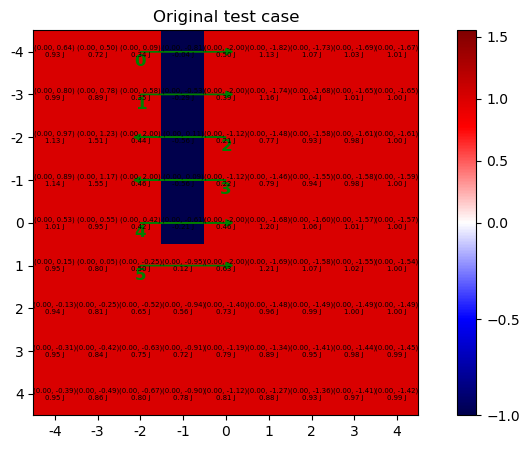


--- Iteration 1: Fixing cluster [0, 1] ---


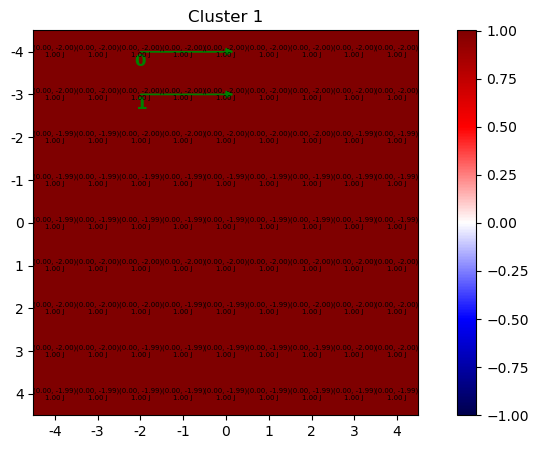

New coordinate for point 2:
	moving:	[0 2 4] -> [0 2 6]
	fixed:	[0 2 2] -> [0 2 4]
New coordinate for point 3:
	moving:	[0 3 4] -> [0 3 6]
	fixed:	[0 3 2] -> [0 3 4]
New coordinate for point 4:
	moving:	[0 4 2] -> [0 4 4]
	fixed:	[0 4 4] -> [0 4 6]
New coordinate for point 5:
	moving:	[0 5 2] -> [0 5 4]
	fixed:	[0 5 4] -> [0 5 6]


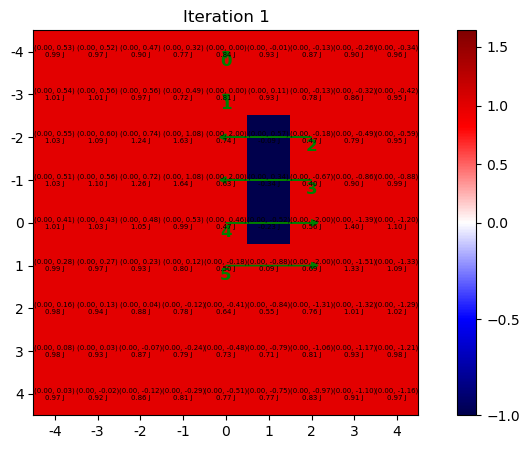


--- Iteration 2: Fixing cluster [2, 3] ---


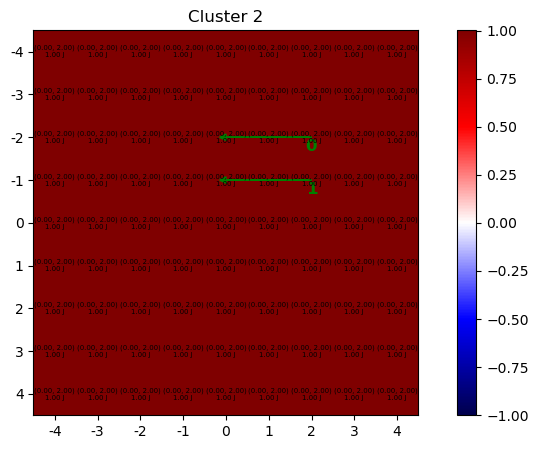

New coordinate for point 4:
	moving:	[0 4 4] -> [0 4 2]
	fixed:	[0 4 6] -> [0 4 4]
New coordinate for point 5:
	moving:	[0 5 4] -> [0 5 2]
	fixed:	[0 5 6] -> [0 5 4]


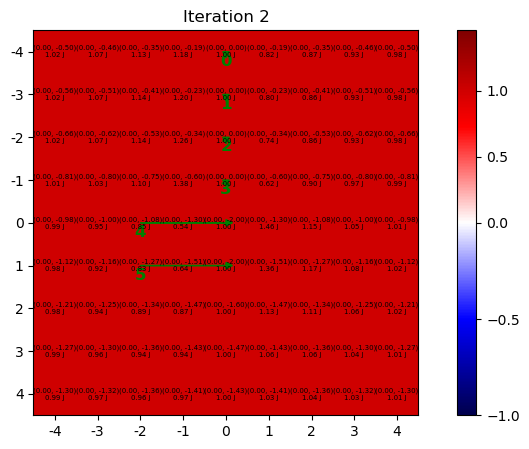


--- Iteration 3: Fixing cluster [4, 5] ---


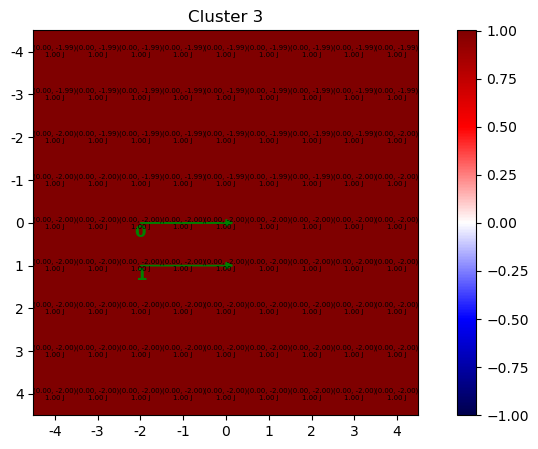

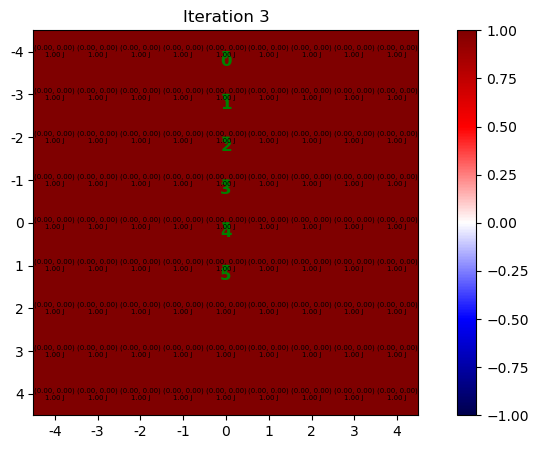


L2 error of combined DVF: 22.6191


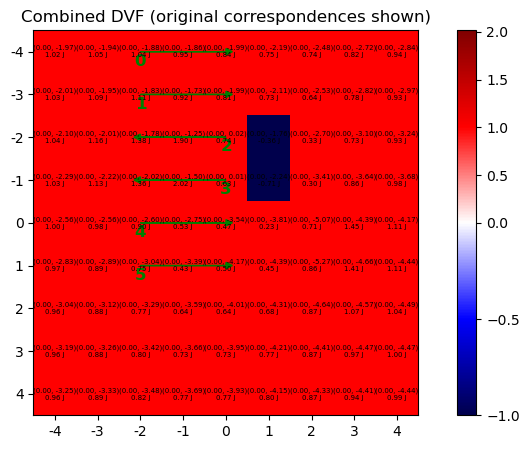

fdata.shape (1, 9, 9)
Time taken to create A:  0.04449892044067383
Error: X=11.54, Y=0.00, Z=0.00, Total=11.54


In [24]:
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    # First cluster
    [0, 0, 2],
    [0, 1, 2],
    # Second cluster
    [0, 2, 4],
    [0, 3, 4],
    # Third cluster
    [0, 4, 2],
    [0, 5, 2],
    
])
fpoints = np.array([
    # First cluster
    [0, 0, 4],
    [0, 1, 4],
    # Second cluster
    [0, 2, 2],
    [0, 3, 2],
    # Third cluster
    [0, 4, 4],
    [0, 5, 4],
])
clusters = [[0, 1], [2, 3], [4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

## Morph shape test

In [8]:
import matplotlib.image as mpimg
import pandas as pd
from scipy.ndimage import zoom

In [9]:
def show(d, title: str = None, figsize: tuple = (10, 5), fontsize: int = 6, 
         show_text=True, show_axis=True, show_correspondence=True, show_orientation=False):
    """Show the deformation field and the Jacobian determinant field.
    
    Args:
        title (str, optional): Title of the plot. Defaults to None.
        figsize (tuple, optional): Size of the plot. Defaults to (10, 5).
        fontsize (int, optional): Font size of the text. Defaults to 6.
        show_text (bool, optional): Whether to show text on the plot. Defaults to True.
        show_axis (bool, optional): Whether to show the normalized axis text or use the default. Defaults to True.
    """
    
    # Example overlay image (replace with your own PNG path)
    moving_img = 'moving_case.png'
    fixed_img = 'fixed_case.png'
    moving_overlay = mpimg.imread(moving_img)  # shape: (H, W, 3) or (H, W, 4)
    fixed_overlay = mpimg.imread(fixed_img)  # shape: (H, W, 3) or (H, W, 4)

    # If overlay is not RGBA, convert to RGBA
    if moving_overlay.shape[-1] == 3:
        # Add an alpha channel (fully opaque)
        alpha = np.ones(moving_overlay.shape[:2], dtype=moving_overlay.dtype)
        overlay_m = np.dstack((moving_overlay, alpha))
        overlay_f = np.dstack((fixed_overlay, alpha))
        

    # Set desired transparency (e.g., 0.3)
    desired_alpha = 0.3
    overlay_m[..., 3] = desired_alpha
    overlay_f[..., 3] = desired_alpha
    
    
    norm = mcolors.TwoSlopeNorm(vmin=min(d.jdet_field.min(), -1), vcenter=0, vmax=d.jdet_field.max())
    jdet_field = d.jdet_field.copy()
    #jdet_field[jdet_field < 0] = -1
    #jdet_field[jdet_field > 0] = 1  # Clip values to [-1, 1] for better visualization

    f = plt.figure(figsize=figsize)
    plt.imshow(jdet_field, cmap="seismic", norm=norm)
    plt.colorbar()
    
    #plt.imshow(overlay_m)
    #plt.imshow(overlay_f)
    
    # Draw correspondence arrows
    if show_correspondence:
        for i in range(d.mpoints.shape[0]):
            plt.arrow(d.mpoints[i, 2], d.mpoints[i, 1], d.fpoints[i, 2] - d.mpoints[i, 2], d.fpoints[i, 1] - d.mpoints[i, 1],
                    head_width=0.15, head_length=0.15, fc='g', ec='g')
        
        # Draw index at each moving point
        #if fontsize != 0:
        for i in range(d.mpoints.shape[0]):
            plt.text(d.mpoints[i, 2], d.mpoints[i, 1] + 0.4, str(i), color='green', ha='center', va='bottom', fontsize=8, weight='bold')
        
    # Plot the coordinate text
    if show_text:
        for y in range(d.jdet_field.shape[0]):
            for x in range(d.jdet_field.shape[1]):
                # Get the pixel information                
                curr_displacement = d.deformation[:, 0, y, x]  # Get first slice (only slice)
                displacement_y = curr_displacement[1]
                displacement_x = curr_displacement[2]

                # Get the angle information
                curr_theta_rad = np.arctan2(displacement_y, displacement_x)
                if curr_theta_rad < 0:  # Ensure the angle is in the range [0, 2pi)
                    curr_theta_rad += 2 * np.pi
                curr_theta = np.abs(np.degrees(curr_theta_rad))
                
                # Get the magnitude information
                curr_magnitude = np.linalg.norm(curr_displacement)
                jdet = d.jdet_field[y, x]
                
                # Setup text to display
                coord_text = f"({displacement_y:.2f}, {displacement_x:.2f})\n"
                jdet_text = f"{jdet:.2f} J"
                vector_text = f"\n{curr_theta:.2f}°\n" + f"∥{curr_magnitude:.2f}∥"
                #pixel_text = coord_text + jdet_text + vector_text
                pixel_text = coord_text + jdet_text
                if fontsize != 0:
                    plt.text(x, y, pixel_text, color='black', ha='center', va='center', fontsize=fontsize, weight='normal')
                                
                # Draw the vector direction
                if show_orientation:
                    magnitude_scale = 0.33  # To scale the vector magnitude for visualization purposes
                    plt.arrow(x, y, np.cos(curr_theta_rad) * magnitude_scale, np.sin(curr_theta_rad) * magnitude_scale, head_width=0.15, head_length=0.15, fc='black', ec='black')            

    if title is None:
        title = f"{d.resolution} Jacobian determinants"
    plt.title(title)
    
    if show_axis and fontsize != 0:
        offset_y = 0 if d.jdet_field.shape[0] % 2 == 0 else 1
        offset_x = 0 if d.jdet_field.shape[1] % 2 == 0 else 1
        plt.yticks(np.arange(d.jdet_field.shape[0]), labels=np.arange(-(d.jdet_field.shape[0] // 2) - offset_y, d.jdet_field.shape[0] // 2) + offset_y)
        plt.xticks(np.arange(d.jdet_field.shape[1]), labels=np.arange(-(d.jdet_field.shape[1] // 2) - offset_x, d.jdet_field.shape[1] // 2) + offset_x)
    plt.show()
    f.clear()
    plt.close(f)
    
    
def plot_dxdy(d):
    """Plot the dx and dy components of the deformation field with colorbars centered at 0 (black)."""
    import matplotlib.colors as mcolors
    f, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    # Get min/max for symmetric normalization
    dy = d.deformation[1, 0]
    dx = d.deformation[2, 0]
    vmin = min(np.min(dy), np.min(dx))
    vmax = max(np.max(dy), np.max(dx))
    absmax = max(abs(vmin), abs(vmax))
    norm = mcolors.TwoSlopeNorm(vmin=-absmax, vcenter=0, vmax=absmax)
    
    # Plot dy
    im0 = ax[0].imshow(dy, cmap='seismic', norm=norm)
    ax[0].set_title('dy component')
    ax[0].axis('off')
    plt.colorbar(im0, ax=ax[0], orientation='vertical')
    
    # Plot dx
    im1 = ax[1].imshow(dx, cmap='seismic', norm=norm)
    ax[1].set_title('dx component')
    ax[1].axis('off')
    plt.colorbar(im1, ax=ax[1], orientation='vertical')
    
    plt.tight_layout()
    plt.show()

In [76]:
# Load a csv file with moving and fixed points
def load_csv_data(file_path: str, scale: float = 1.0):
    """Load moving and fixed points from a CSV file."""
    columns = ['moving_z', 'moving_y', 'moving_x', 'fixed_z', 'fixed_y', 'fixed_x']
    df = pd.read_csv(file_path)
    if not all(col in df.columns for col in columns):
        raise ValueError(f"CSV file must contain columns: {columns}")
    
    mpoints = df[columns[:3]].values
    fpoints = df[columns[3:]].values
    
    # Scale the coordinates if needed
    if scale != 1.0:
        mpoints = mpoints.copy().astype(float)  # Ensure mpoints is float for scaling
        fpoints = fpoints.copy().astype(float)  # Ensure fpoints is float for scaling
        mpoints[:, 1:] *= scale
        fpoints[:, 1:] *= scale
        # Make sure they're all integers
        mpoints = np.round(mpoints).astype(int)
        fpoints = np.round(fpoints).astype(int)
    
    return mpoints, fpoints


# Load png function
def load_png(file_path: str, scale: float = 1.0, alpha: float = 1.0):
    """Load a color PNG image and return it as a numpy array, with scaling and alpha."""
    img_array = mpimg.imread(file_path)  # shape: (H, W, 3) or (H, W, 4)
    if img_array.ndim == 2:  # Grayscale image
        img_array = np.stack((img_array,) * 3, axis=-1)  # Convert to RGB
    # Only scale height and width, not channels
    if scale != 1.0:
        img_array = zoom(img_array, (scale, scale, 1), order=1)
    # If overlay is not RGBA, convert to RGBA
    if img_array.shape[-1] == 3:
        alpha_channel = np.ones(img_array.shape[:2], dtype=img_array.dtype) * alpha
        img_array = np.dstack((img_array, alpha_channel))
    else:
        img_array[..., 3] = alpha  # Set alpha for all pixels
    return img_array


# Show color png
def show_png(image_array, title=None):
    """Display a color image using matplotlib, compositing transparent pixels over white."""
    if image_array.shape[-1] == 4:  # RGBA
        rgb = image_array[..., :3]
        alpha = image_array[..., 3:4]
        white = np.ones_like(rgb)
        # Composite over white: out = alpha*rgb + (1-alpha)*white
        img = alpha * rgb + (1 - alpha) * white
    else:
        img = image_array
    plt.imshow(img)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()
    
    
def shift3Dfunc(point, dx, dy, dz):
    try:
        px = point[0] + dx[point[0], point[1],  point[2]]
        py = point[1] + dy[point[0], point[1],  point[2]]
        pz = point[2] + dz[point[0], point[1],  point[2]]
        if(px<0 or px> dx.shape[0]):
            return (point[0], point[1], point[2])
        if(py<0 or py> dx.shape[1]):
            return (point[0], point[1], point[2])
        if(pz<0 or pz> dx.shape[2]):
            return (point[0], point[1], point[2])
        return (px, py, pz)
    except:
        return (0, 0, 0)


from scipy.ndimage import geometric_transform
from functools import partial

def apply_transformation(d, moving_image, fixed_image, 
                         mpoints=None, fpoints=None, title="Transformed image"):
    #print(moving_image.shape)
    ch0 = moving_image[:, :, 0]
    ch0 = ch0[np.newaxis, :, :]  # Add a new axis for the channel dimension
    ch1 = moving_image[:, :, 1]
    ch1 = ch1[np.newaxis, :, :]  # Add a new axis for the channel dimension
    ch2 = moving_image[:, :, 2]
    ch2 = ch2[np.newaxis, :, :]  # Add a new axis for the channel dimension
    ch3 = moving_image[:, :, 3]
    ch3 = ch3[np.newaxis, :, :]  # Add a new axis for the channel dimension
    
    deformation_field = d.deformation  # Get the deformation field (dx, dy, dz)
    transformed_ch0 = geometric_transform(ch0, 
                                          partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    transformed_ch1 = geometric_transform(ch1, 
                                          partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    transformed_ch2 = geometric_transform(ch2, 
                                          partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    #transformed_ch3 = geometric_transform(ch3, 
    #                                      partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    transformedData = np.concatenate((transformed_ch0, transformed_ch1, transformed_ch2, ch3), axis=0)
    
    # After concatenation, shape is (4, H, W)
    transformedData = np.transpose(transformedData, (1, 2, 0))  # Now (H, W, 4)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(transformedData)
    if mpoints is not None and fpoints is not None:
        for i in range(mpoints.shape[0]):
            plt.arrow(mpoints[i, 2], mpoints[i, 1], fpoints[i, 2] - mpoints[i, 2], fpoints[i, 1] - mpoints[i, 1],
                      head_width=0.15, head_length=0.15, fc='b', ec='b', alpha=0.5)
            plt.text(mpoints[i, 2], mpoints[i, 1] + 0.4, str(i), color='green', ha='center', va='bottom', fontsize=8, weight='bold')
    plt.imshow(fixed_image, alpha=0.45)  # Overlay the moving image
    plt.title(title)
    plt.show()

In [77]:
import matplotlib.pyplot as plt
import numpy as np

def plot_2d_deformation_grid_v2(d, moving_points=None, fixed_points=None, title=None, show_arrows=True, show_points=True, figsize=(20, 20), grid_spacing=1, show_grid=True, xy_window=None):
    """
    Visualize a 2D deformation grid (deformation shape: 3,1,H,W, order Z,y,x), overlaying moving, fixed, and deformed fixed points.
    Also draws a box grid showing how each point is deformed, with adjustable spacing.
    Optionally restricts plotting to a window: (ymin, ymax, xmin, xmax)
    
    Args:
        deformation: np.ndarray, shape (3, 1, H, W), order (Z, y, x)
        moving_points: np.ndarray, shape (N, 2) or (N, 3)
        fixed_points: np.ndarray, shape (N, 2) or (N, 3)
        title: str
        show_arrows: bool
        show_points: bool
        figsize: tuple
        grid_spacing: int, spacing between grid points for box grid
        show_grid: bool, whether to show the deformation grid
        xy_window: tuple or None, (ymin, ymax, xmin, xmax) to restrict plotting window
    """
    deformation = d.deformation  # Get the deformation field (shape: 3, 1, H, W)
    #deformation_inv = Data(fixed_points, moving_points, d.resolution).deformation  # Inverse deformation field (shape: 3, 1, H, W)
    #deformation = deformation_inv
    # Extract y and x displacements
    dy = deformation[1, 0, :, :]
    dx = deformation[2, 0, :, :]
    #dy_inv = deformation_inv[1, 0, :, :]
    #dx_inv = deformation_inv[2, 0, :, :]
    H, W = dy.shape
    if xy_window is not None:
        ymin, ymax, xmin, xmax = xy_window
        ymin = max(0, ymin)
        ymax = min(H, ymax)
        xmin = max(0, xmin)
        xmax = min(W, xmax)
    else:
        ymin, ymax, xmin, xmax = 0, H, 0, W
    Y, X = np.mgrid[ymin:ymax, xmin:xmax]
    plt.figure(figsize=figsize)
    plt.imshow(np.hypot(dx, dy)[ymin:ymax, xmin:xmax], cmap='Reds', alpha=1, extent=[xmin, xmax, ymax, ymin])
    plt.colorbar(label='Deformation magnitude')
    # Draw deformation grid (box grid)
    if show_grid and grid_spacing > 0:
        for y in range(ymin, ymax-1, grid_spacing):
            for x in range(xmin, xmax-1, grid_spacing):
                # Four corners of the box
                corners = np.array([[y, x], [y, x+grid_spacing], [y+grid_spacing, x+grid_spacing], [y+grid_spacing, x], [y, x]])
                # Clip to image bounds
                corners[:,0] = np.clip(corners[:,0], 0, H-1)
                corners[:,1] = np.clip(corners[:,1], 0, W-1)
                # Deform corners
                y_c = corners[:,0]
                x_c = corners[:,1]
                y_c_def = y_c + dy[y_c, x_c]
                x_c_def = x_c + dx[y_c, x_c]
                #y_c_def = y_c + dy_inv[y_c, x_c]
                #x_c_def = x_c + dx_inv[y_c, x_c]
                plt.plot(x_c_def, y_c_def, color='blue', alpha=0.25, linewidth=1)
    # Overlay fixed points and their deformed positions
    if fixed_points is not None:
        fixed_points = np.asarray(fixed_points)
        if fixed_points.shape[1] == 3:
            y_fp, x_fp = fixed_points[:,1], fixed_points[:,2]
        else:
            y_fp, x_fp = fixed_points[:,0], fixed_points[:,1]
        # Only show points in window
        mask = (y_fp >= ymin) & (y_fp < ymax) & (x_fp >= xmin) & (x_fp < xmax)
        y_fp = y_fp[mask]
        x_fp = x_fp[mask]
        plt.scatter(x_fp, y_fp, c='red', marker='x', label='Fixed', s=60)
        # Compute new positions after deformation
        y_fp_int = np.round(y_fp).astype(int)
        x_fp_int = np.round(x_fp).astype(int)
        y_fp_int = np.clip(y_fp_int, 0, H-1)
        x_fp_int = np.clip(x_fp_int, 0, W-1)
        new_y = y_fp + dy[y_fp_int, x_fp_int]
        new_x = x_fp + dx[y_fp_int, x_fp_int]
        #plt.scatter(new_x, new_y, c='magenta', marker='s', label='Deformed Fixed', edgecolor='k', s=60)
        # Optionally, draw arrows from original to deformed fixed points
        if show_arrows:
            for x0, y0, x1, y1 in zip(x_fp, y_fp, new_x, new_y):
                plt.arrow(x0, y0, x1-x0, y1-y0, color='green', head_width=0.3, head_length=0.3, alpha=0.7)
    # Optionally, overlay moving points as reference
    if moving_points is not None:
        moving_points = np.asarray(moving_points)
        if moving_points.shape[1] == 3:
            y_mp, x_mp = moving_points[:,1], moving_points[:,2]
        else:
            y_mp, x_mp = moving_points[:,0], moving_points[:,1]
        # Only show points in window
        mask = (y_mp >= ymin) & (y_mp < ymax) & (x_mp >= xmin) & (x_mp < xmax)
        y_mp = y_mp[mask]
        x_mp = x_mp[mask]
        plt.scatter(x_mp, y_mp, c='lime', marker='o', label='Moving', edgecolor='k', s=60)
    if title:
        plt.title(title)
    plt.legend()
    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.xlim(xmin, xmax)
    plt.ylim(ymax, ymin)
    plt.show()

#### Input parameters

In [61]:
resolution = (256, 256)  # Original resolution
scale = 1.0  # Scale factor for the image (try 0.11)
correspondences_path = 'correspondences.csv'  # Path to the CSV file with correspondences

# Indices
expansion_indices = [0, 2, 4, 6, 8, 12]  # Indices that expand the image outwards
contraction_indices = [1, 3, 5, 7, 9, 11, 13]  # Indices that shrink the image inwards

#### Run Laplacian tests

Moving and fixed images:


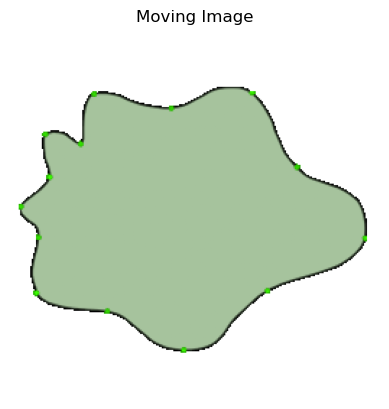

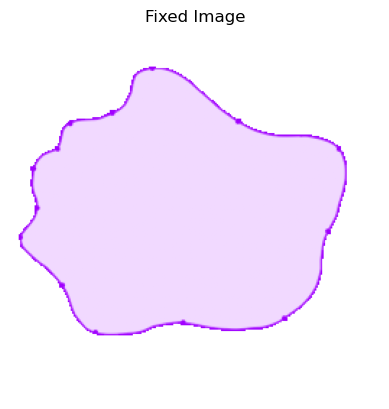

Laplacian tests:


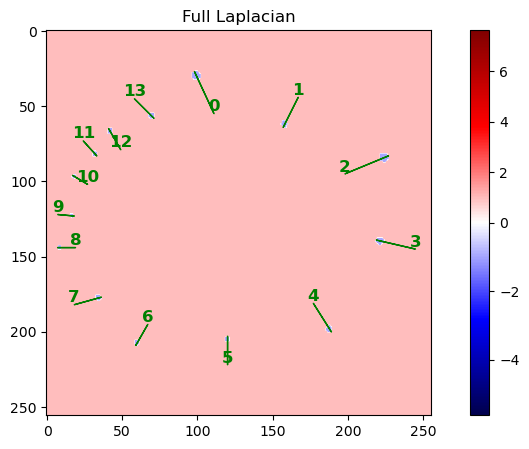

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2714554..1.2209729].


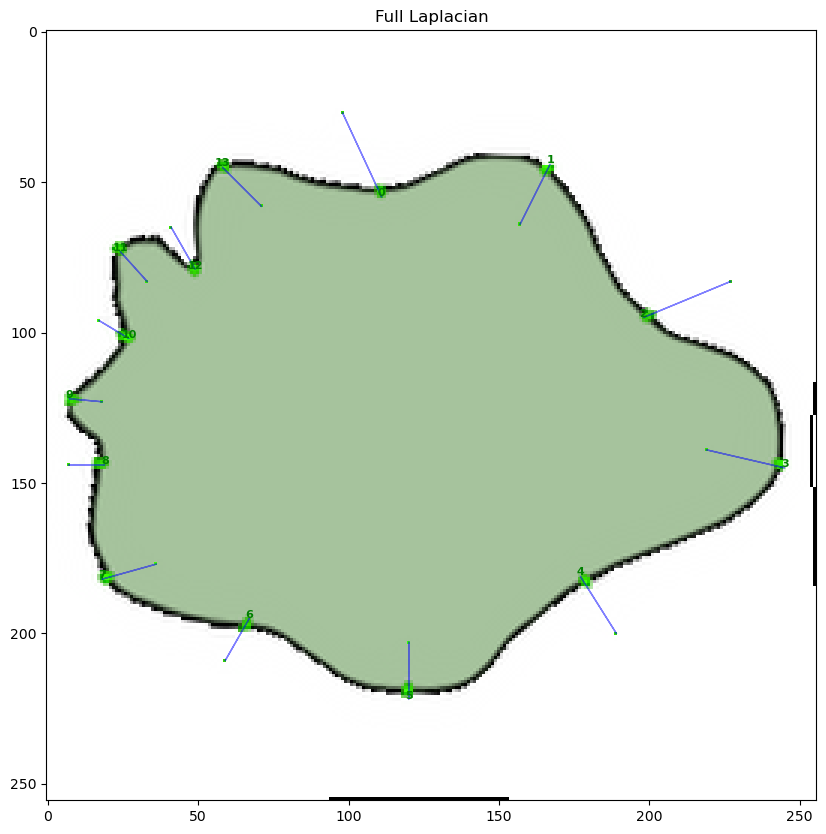

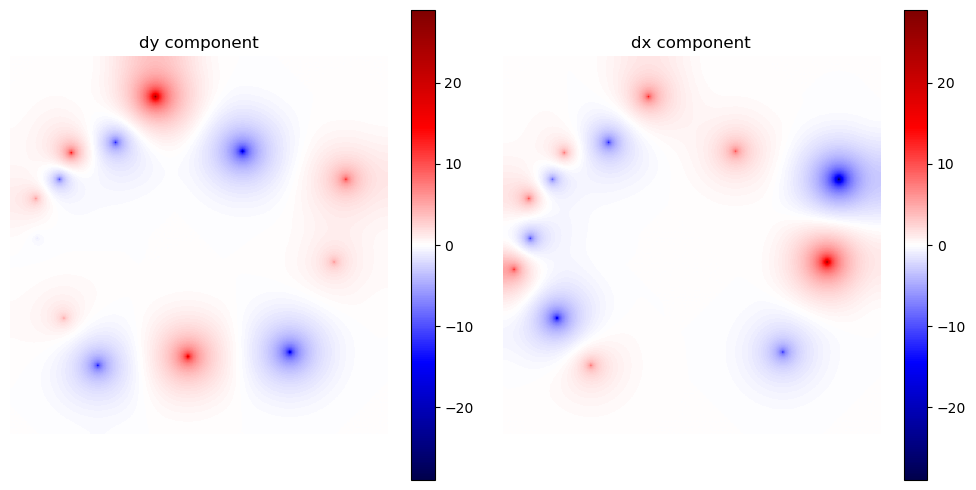

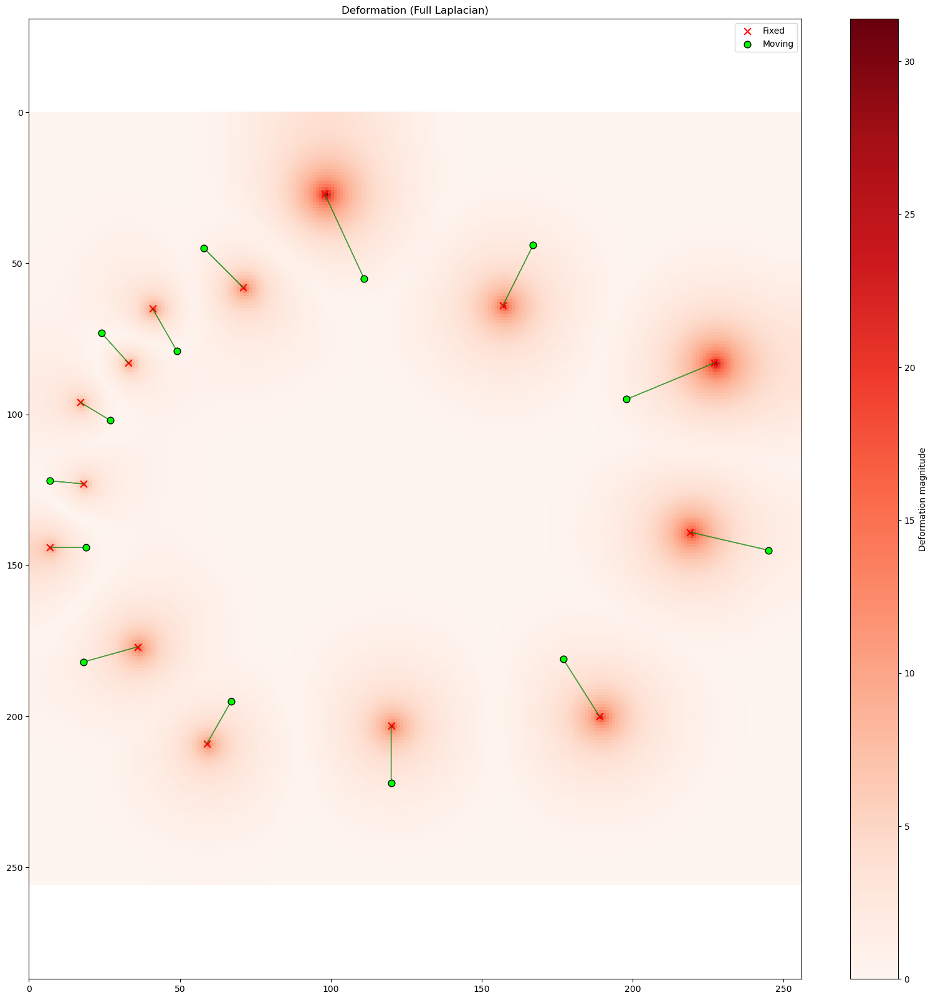

Min Jdet value: -5.6274, Max Jdet value: 7.6225
Number of negative Jdet values: 188
fdata.shape (1, 256, 256)
Time taken to create A:  0.06701421737670898
Error: X=0.54, Y=0.53, Z=0.00, Total=0.77


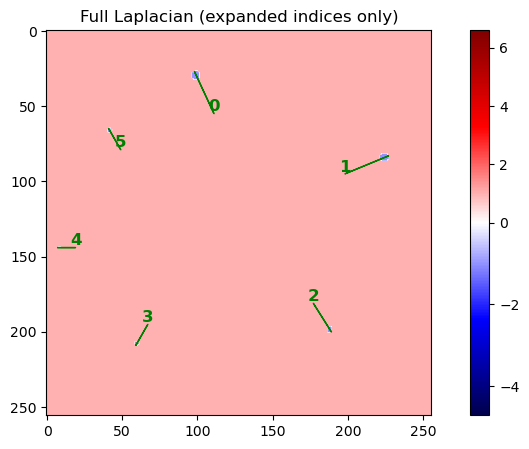

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18608896..1.1887251].


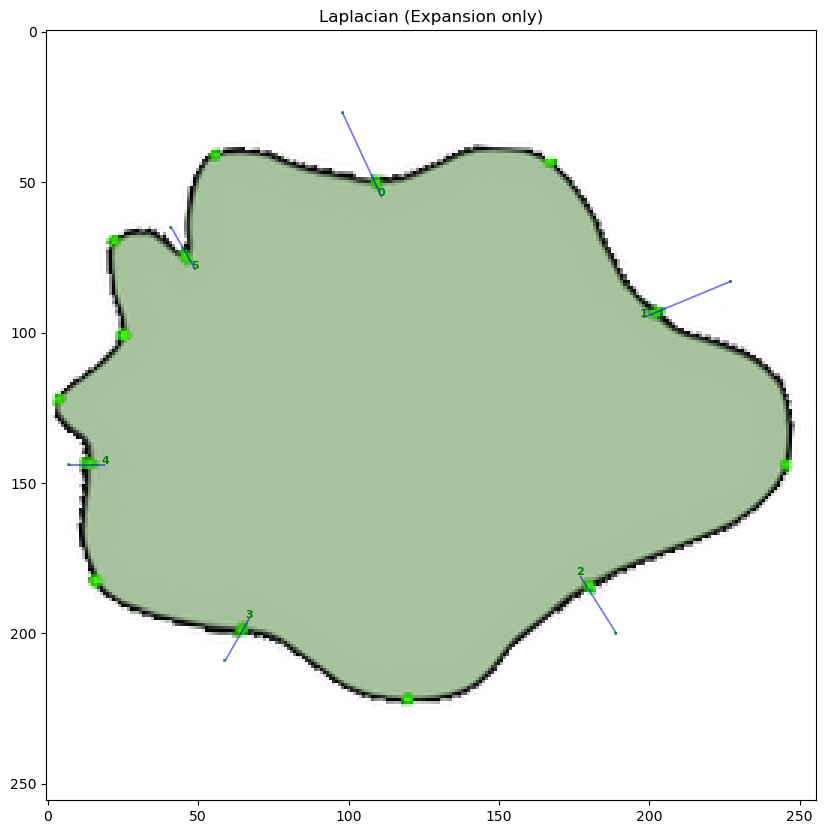

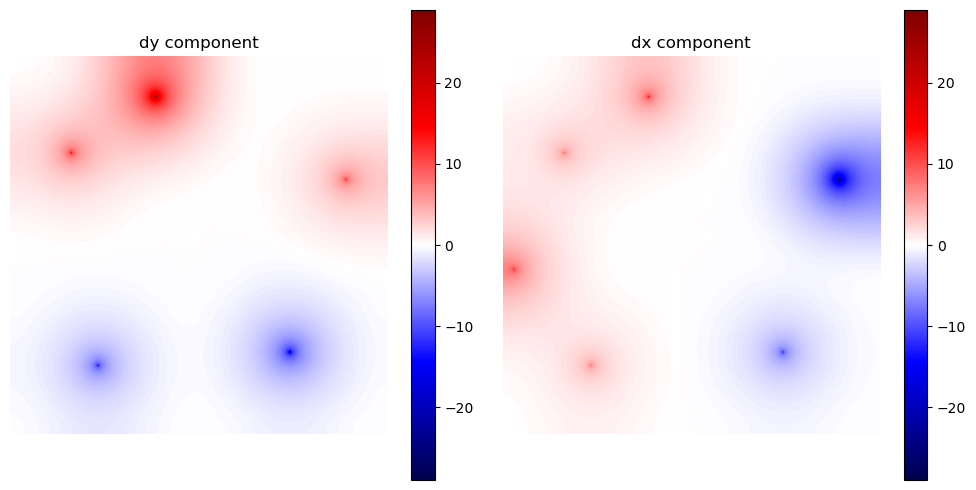

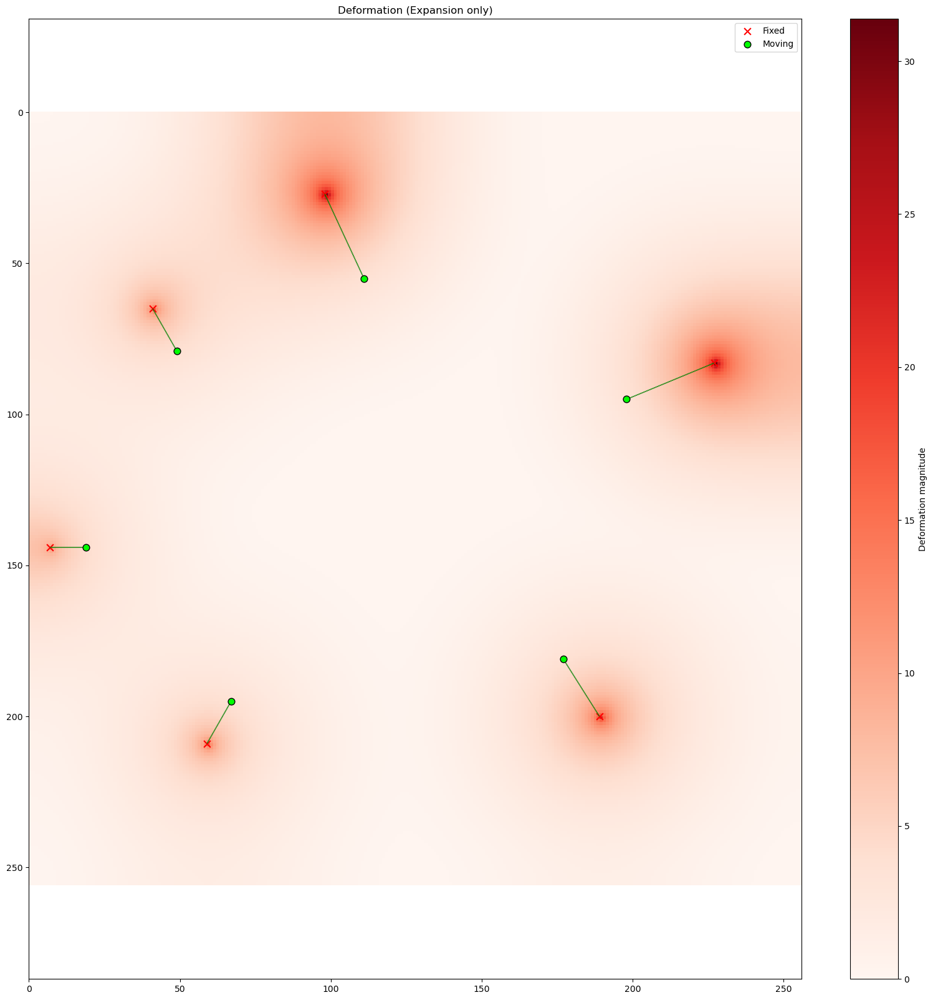

Min Jdet value: -4.7132, Max Jdet value: 6.5985
Number of negative Jdet values: 75
fdata.shape (1, 256, 256)
Time taken to create A:  0.060007572174072266
Error: X=42.38, Y=36.19, Z=0.00, Total=60.41


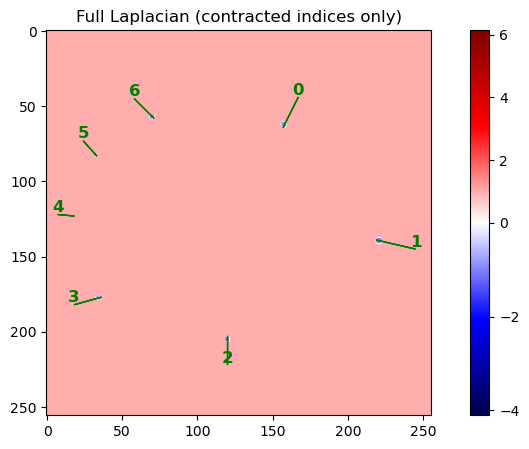

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20768765..1.1978861].


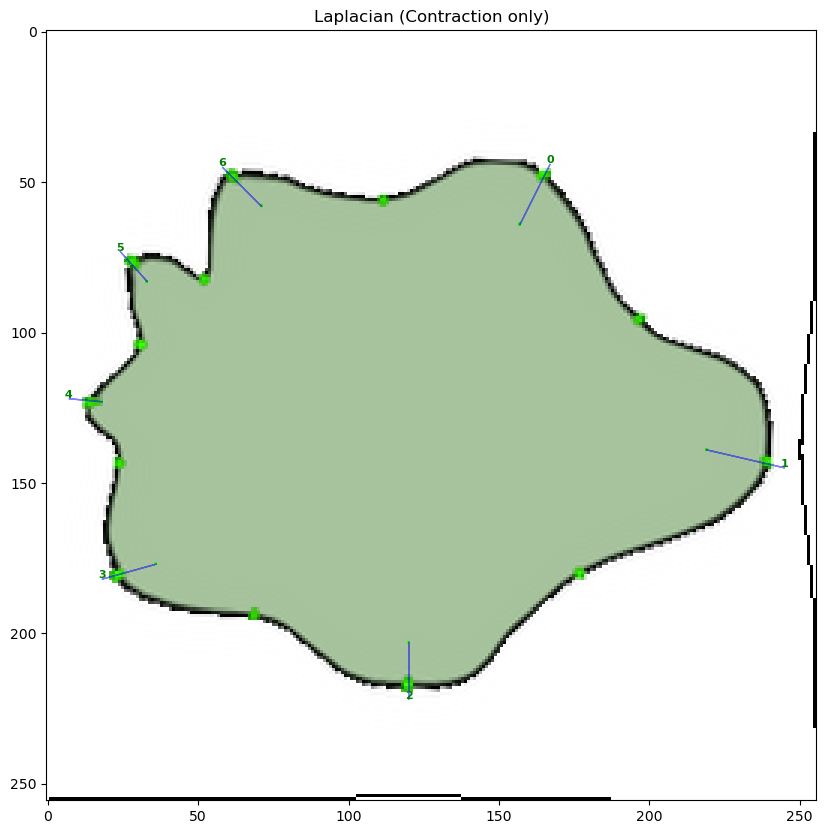

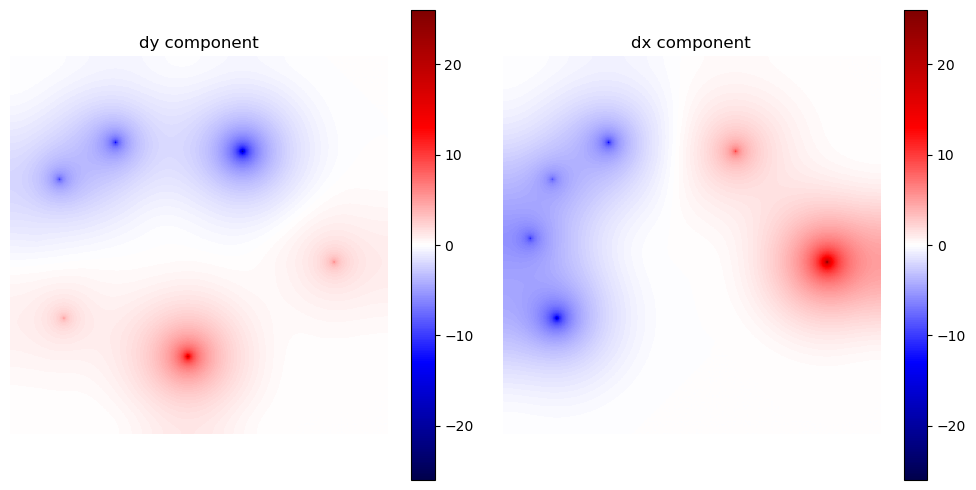

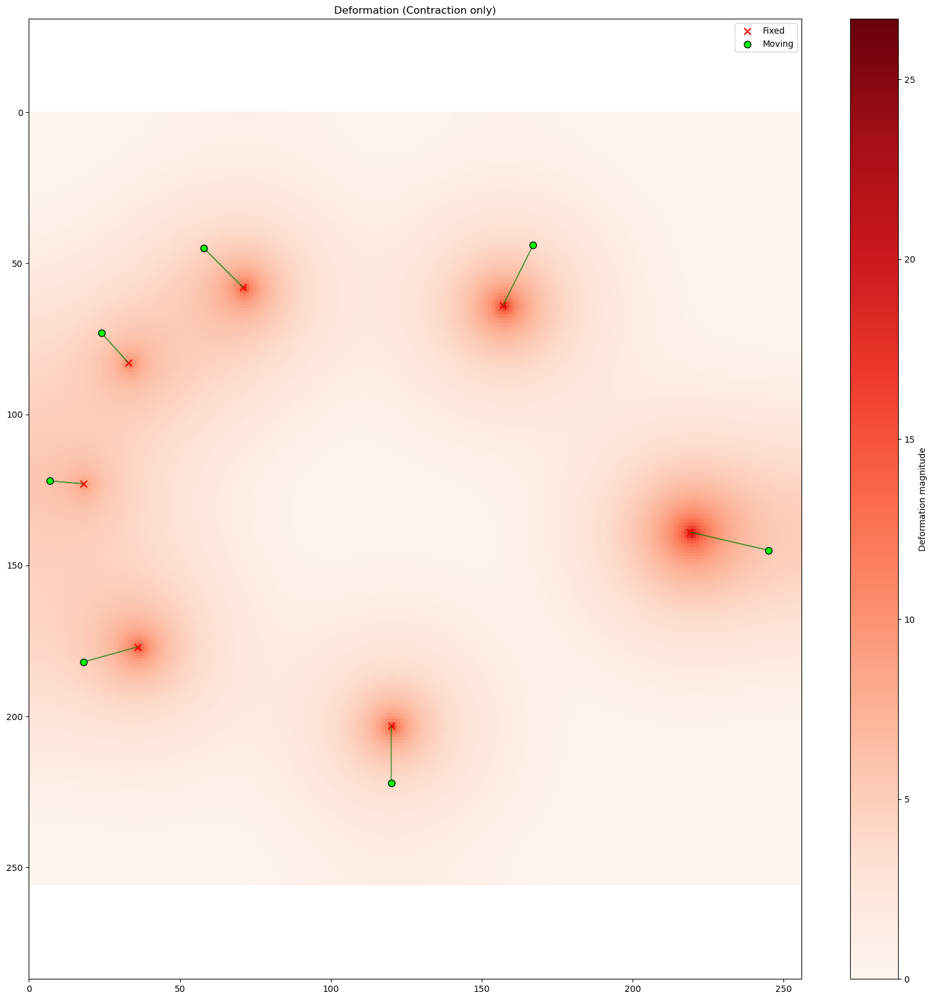

Min Jdet value: -4.1058, Max Jdet value: 6.1451
Number of negative Jdet values: 53
fdata.shape (1, 256, 256)
Time taken to create A:  0.06802606582641602
Error: X=44.14, Y=43.94, Z=0.00, Total=69.28


In [62]:
# Load the correspondences from the CSV file
mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)
scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))

# Load and show the images
moving_image = load_png('moving_case.png', scale=scale)
fixed_image = load_png('fixed_case.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Deformation (Full Laplacian)", show_grid=False)
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with expansion indices only
d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
plot_dxdy(d_expand)
plot_2d_deformation_grid_v2(d_expand, mpoints[expansion_indices], fpoints[expansion_indices], title="Deformation (Expansion only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_expand.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_expand.resolution, mpoints, fpoints, d_expand.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with contraction indices only
d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
plot_dxdy(d_contract)
plot_2d_deformation_grid_v2(d_contract, mpoints[contraction_indices], fpoints[contraction_indices], title="Deformation (Contraction only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_contract.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_contract.resolution, mpoints, fpoints, d_contract.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

##### Clusters

EXPANSION FIRST


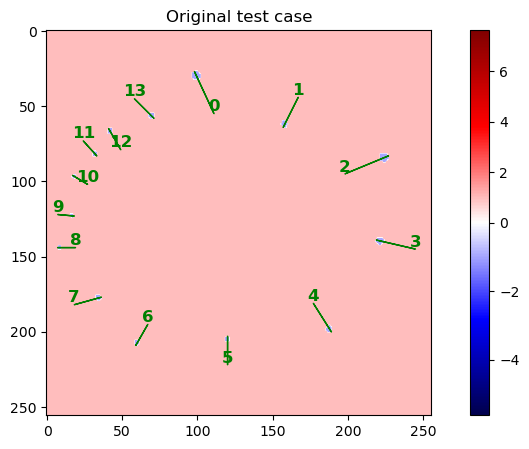


--- Iteration 1: Fixing cluster [0, 2, 4, 6, 8, 12] ---


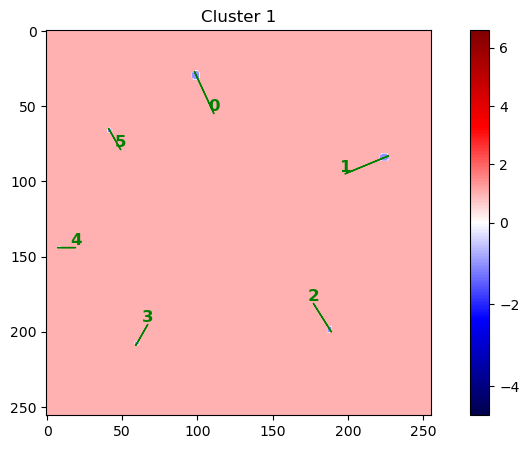

New coordinate for point 1:
	moving:	[  0  44 167] -> [  0  43 167]
	fixed:	[  0  64 157] -> [  0  63 157]
New coordinate for point 3:
	moving:	[  0 145 245] -> [  0 145 245]
	fixed:	[  0 139 219] -> [  0 139 220]
New coordinate for point 5:
	moving:	[  0 222 120] -> [  0 222 120]
	fixed:	[  0 203 120] -> [  0 203 120]
New coordinate for point 7:
	moving:	[  0 182  18] -> [  0 182  16]
	fixed:	[  0 177  36] -> [  0 178  34]
New coordinate for point 9:
	moving:	[  0 122   7] -> [  0 122   4]
	fixed:	[  0 123  18] -> [  0 123  15]
New coordinate for point 10:
	moving:	[  0 102  27] -> [  0 101  25]
	fixed:	[ 0 96 17] -> [ 0 95 16]
New coordinate for point 11:
	moving:	[ 0 73 24] -> [ 0 71 23]
	fixed:	[ 0 83 33] -> [ 0 80 31]
New coordinate for point 13:
	moving:	[ 0 45 58] -> [ 0 44 57]
	fixed:	[ 0 58 71] -> [ 0 55 69]


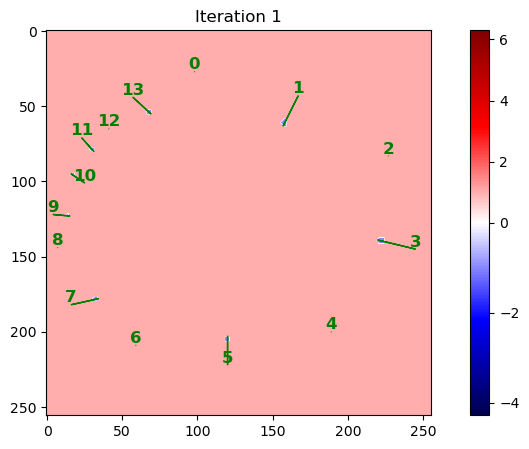


--- Iteration 2: Fixing cluster [1, 3, 5, 7, 9, 11, 13] ---


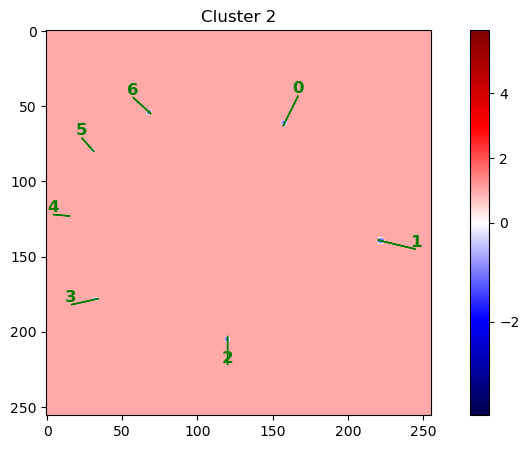

New coordinate for point 10:
	moving:	[  0 101  25] -> [  0 102  28]
	fixed:	[ 0 95 16] -> [ 0 97 20]


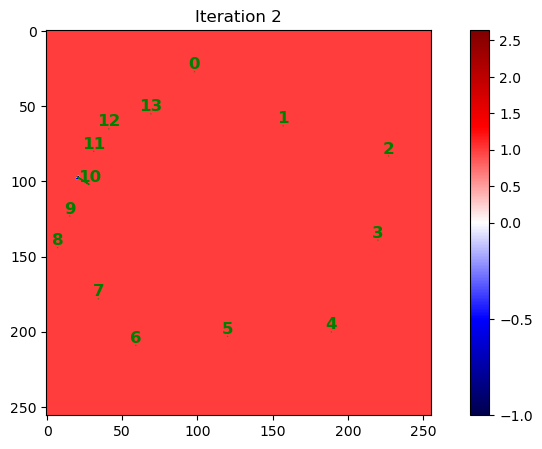


L2 error of combined DVF: 704.1588


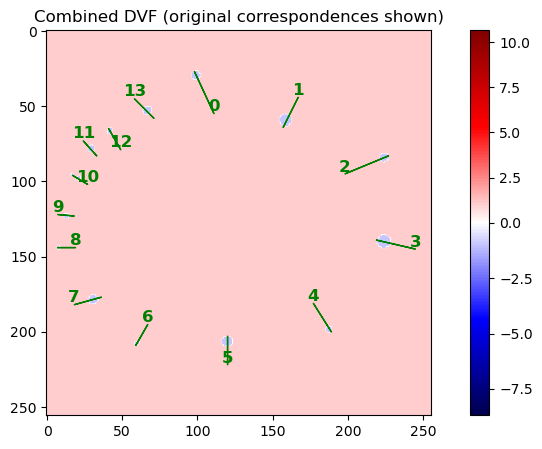

fdata.shape (1, 256, 256)
Time taken to create A:  0.055011749267578125
Error: X=85.22, Y=63.78, Z=0.00, Total=112.72
Number of negative Jdet values: 327


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22058178..1.2040921].


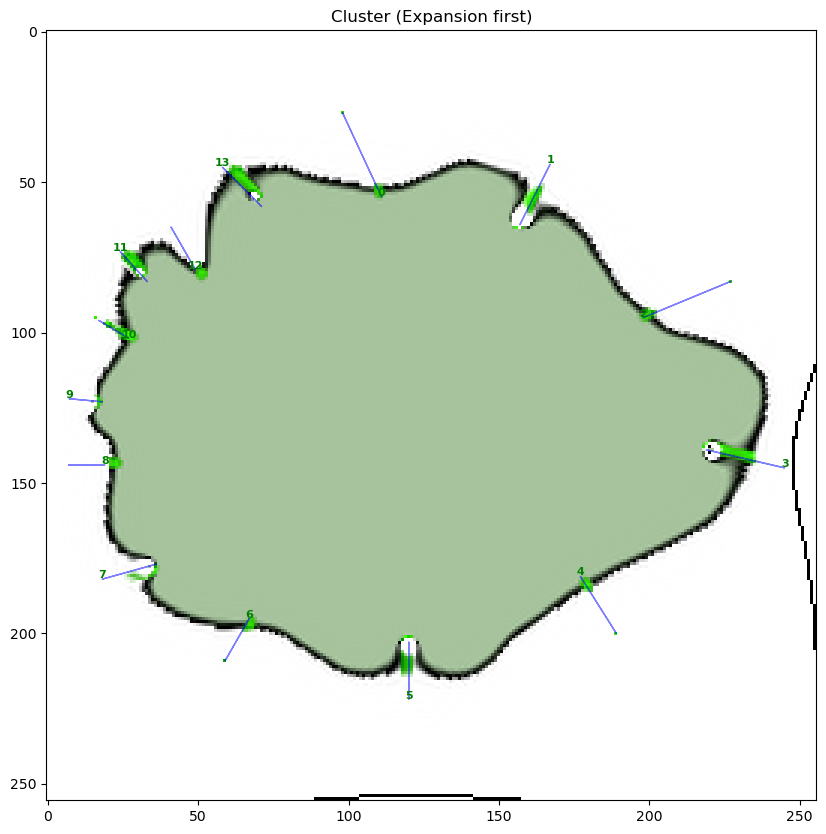

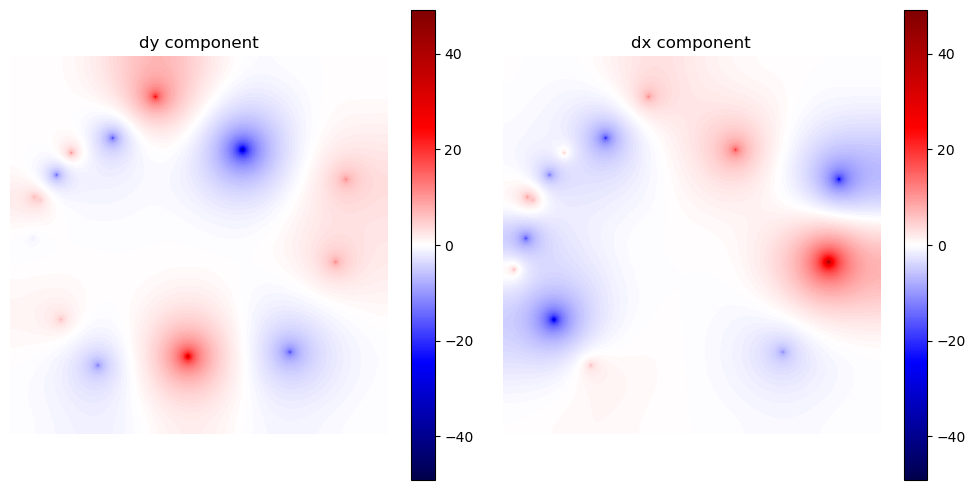

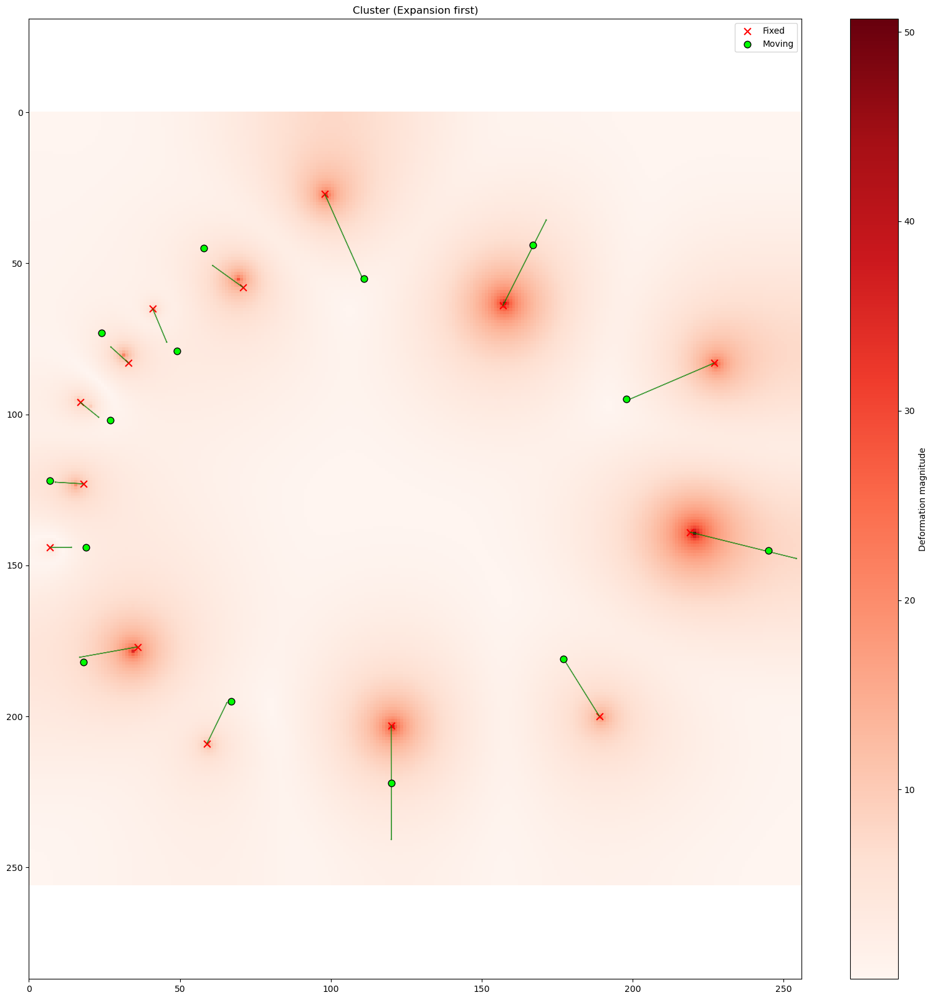






CONTRACTION FIRST


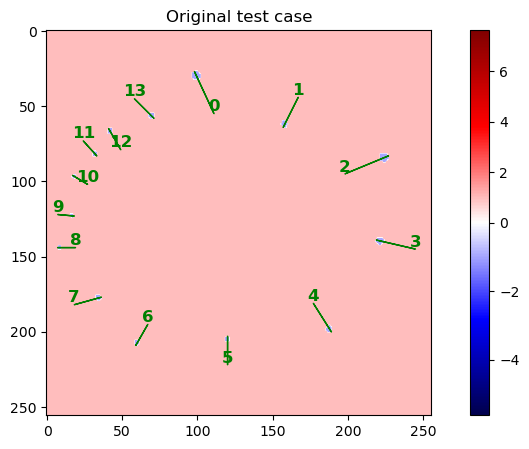


--- Iteration 1: Fixing cluster [1, 3, 5, 7, 9, 11, 13] ---


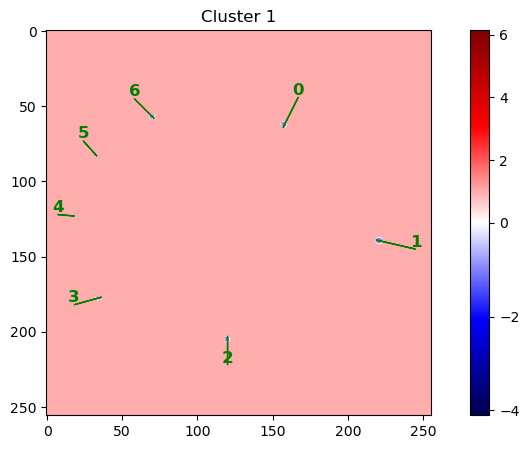

New coordinate for point 0:
	moving:	[  0  55 111] -> [  0  56 111]
	fixed:	[ 0 27 98] -> [ 0 28 99]
New coordinate for point 2:
	moving:	[  0  95 198] -> [  0  95 198]
	fixed:	[  0  83 227] -> [  0  83 226]
New coordinate for point 4:
	moving:	[  0 181 177] -> [  0 181 177]
	fixed:	[  0 200 189] -> [  0 200 189]
New coordinate for point 6:
	moving:	[  0 195  67] -> [  0 194  68]
	fixed:	[  0 209  59] -> [  0 209  60]
New coordinate for point 8:
	moving:	[  0 144  19] -> [  0 144  23]
	fixed:	[  0 144   7] -> [  0 144  12]
New coordinate for point 10:
	moving:	[  0 102  27] -> [  0 104  30]
	fixed:	[ 0 96 17] -> [ 0 98 21]
New coordinate for point 12:
	moving:	[ 0 79 49] -> [ 0 82 52]
	fixed:	[ 0 65 41] -> [ 0 69 45]


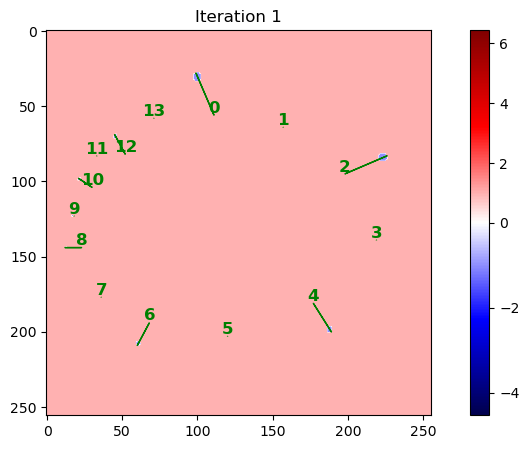


--- Iteration 2: Fixing cluster [0, 2, 4, 6, 8, 12] ---


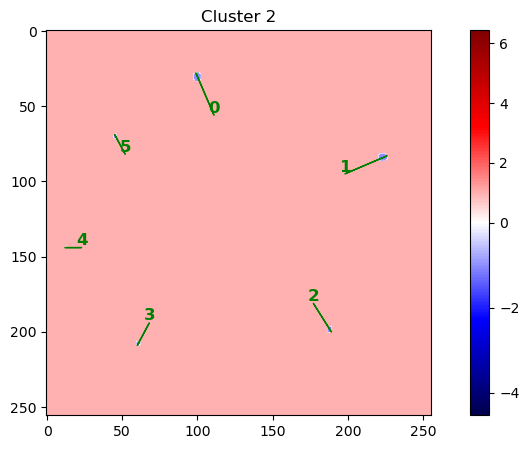

New coordinate for point 10:
	moving:	[  0 104  30] -> [  0 103  28]
	fixed:	[ 0 98 21] -> [ 0 97 20]


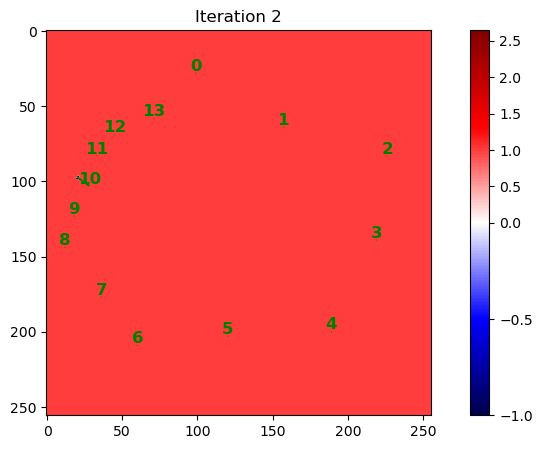


L2 error of combined DVF: 965.7139


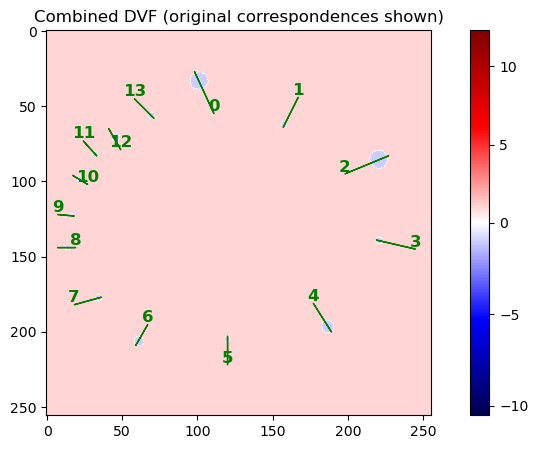

fdata.shape (1, 256, 256)
Time taken to create A:  0.057007551193237305
Error: X=75.79, Y=82.64, Z=0.00, Total=112.92
Number of negative Jdet values: 405


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20536575..1.1943864].


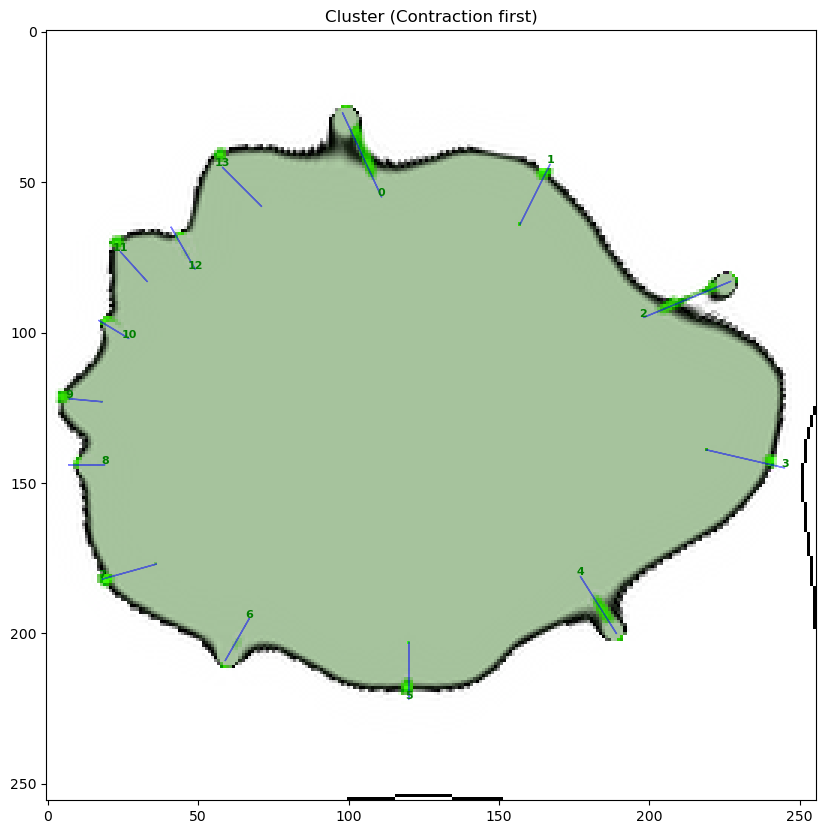

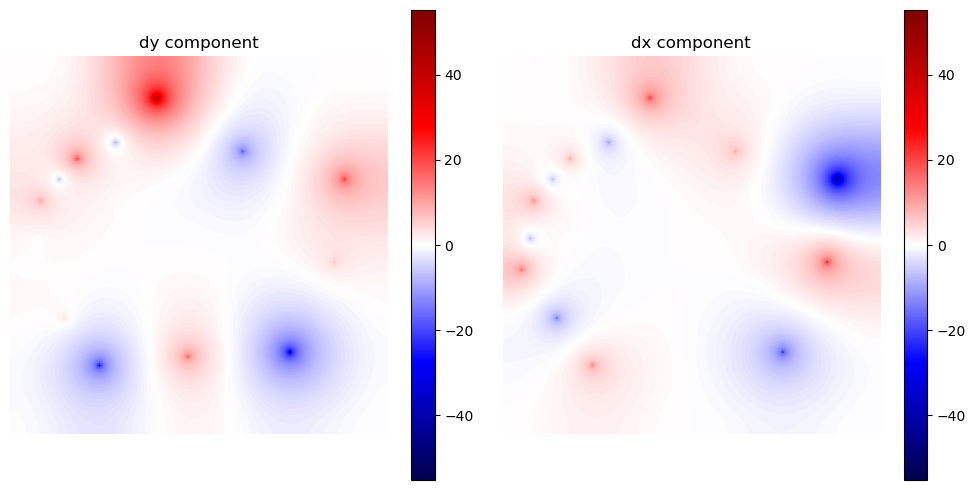

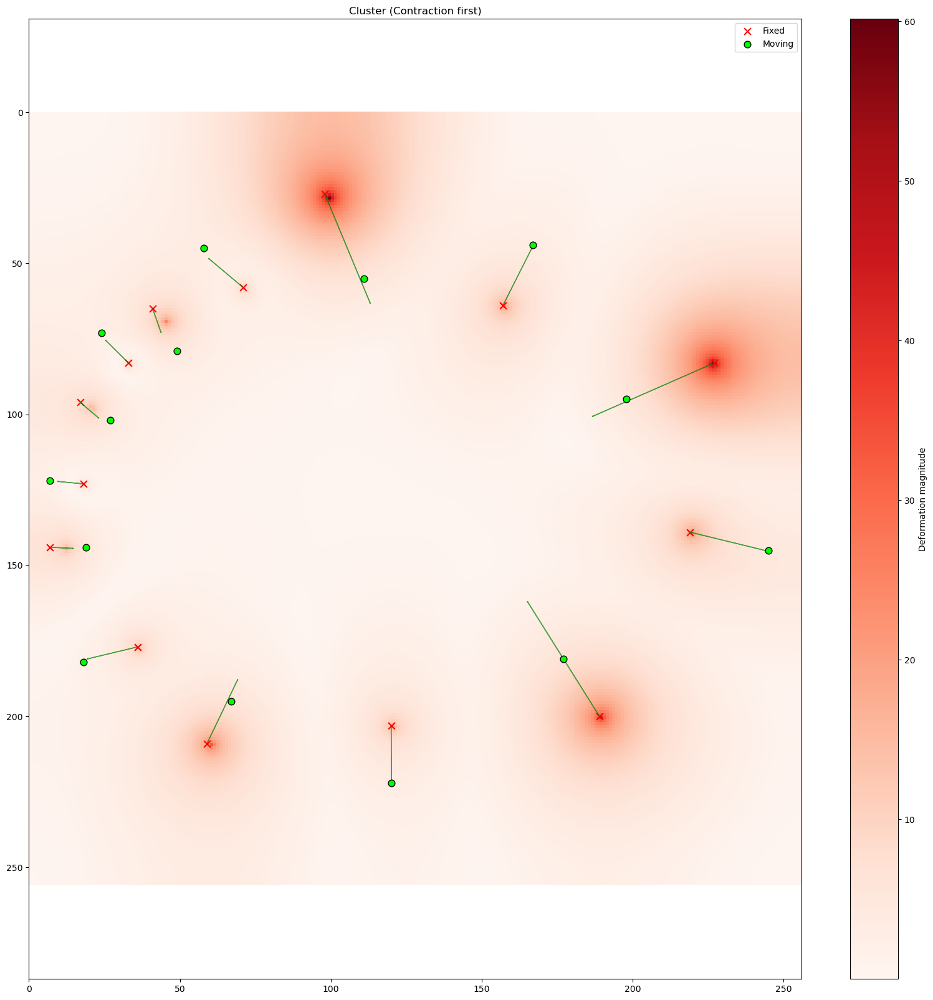

In [63]:
# Expansion first
print("EXPANSION FIRST")
d = cluster_iteration(mpoints, fpoints, [expansion_indices, contraction_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Expansion first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Expansion first)", show_grid=False)

print("\n\n\n\n")
print("CONTRACTION FIRST")

# Contraction first
d = cluster_iteration(mpoints, fpoints, [contraction_indices, expansion_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Contraction first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Contraction first)", show_grid=False)

#### Run with extra points

In [64]:
resolution = (256, 256)  # Original resolution
scale = 1  # Scale factor for the image (try 0.11)
correspondences_path = 'correspondences_extra.csv'  # Path to the CSV file with correspondences

# Indices
expansion_indices = [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47]  # Indices that expand the image outwards
contraction_indices = [idx for idx in range(0, 48) if idx not in expansion_indices]  # Indices that shrink the image inwards

Moving and fixed images:


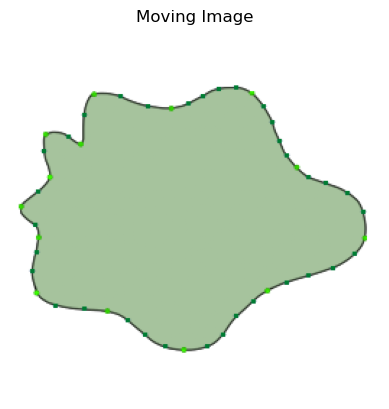

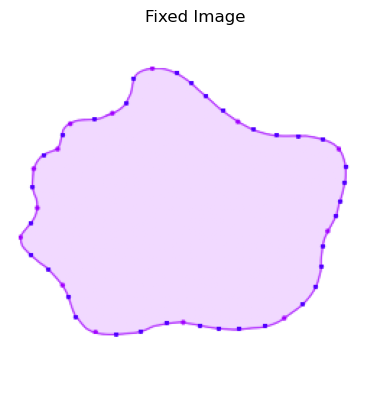

Laplacian tests:


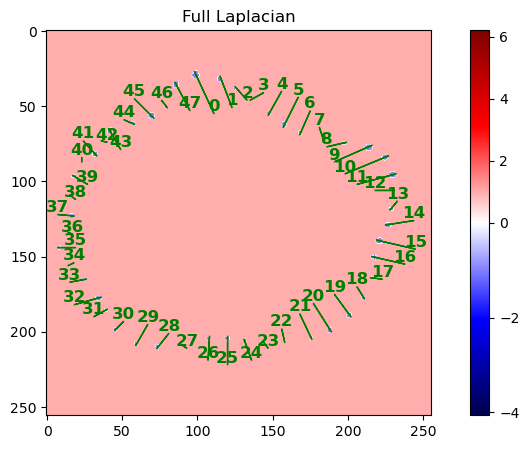

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18521544..1.1818006].


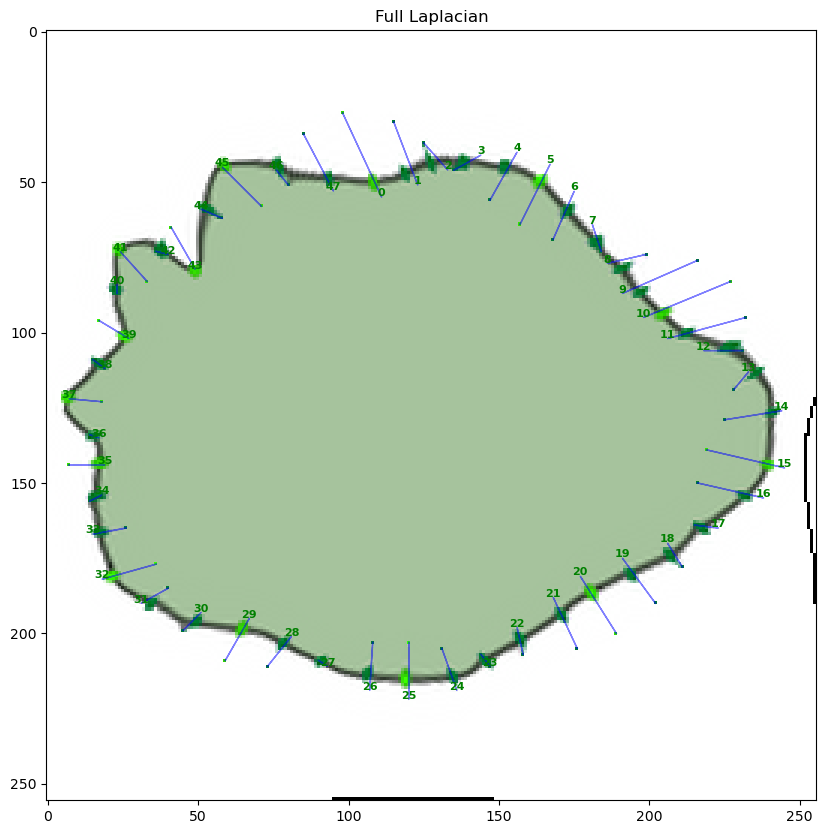

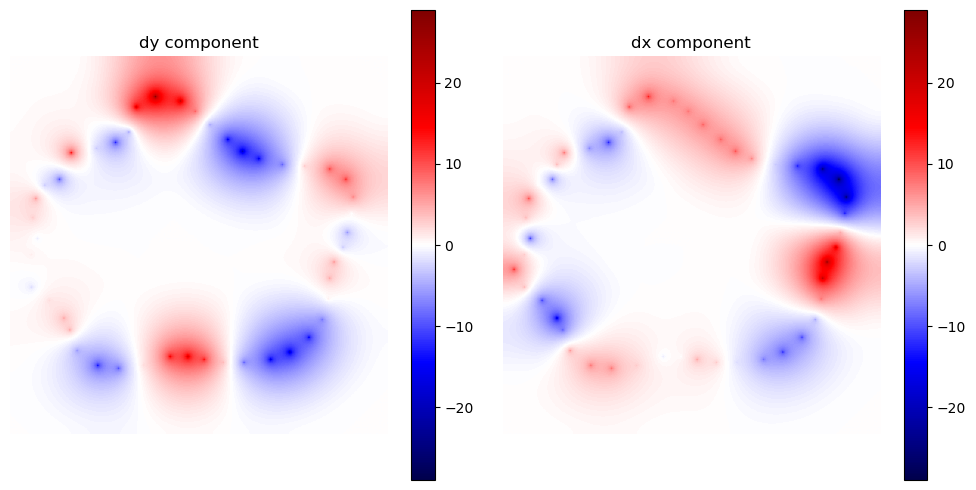

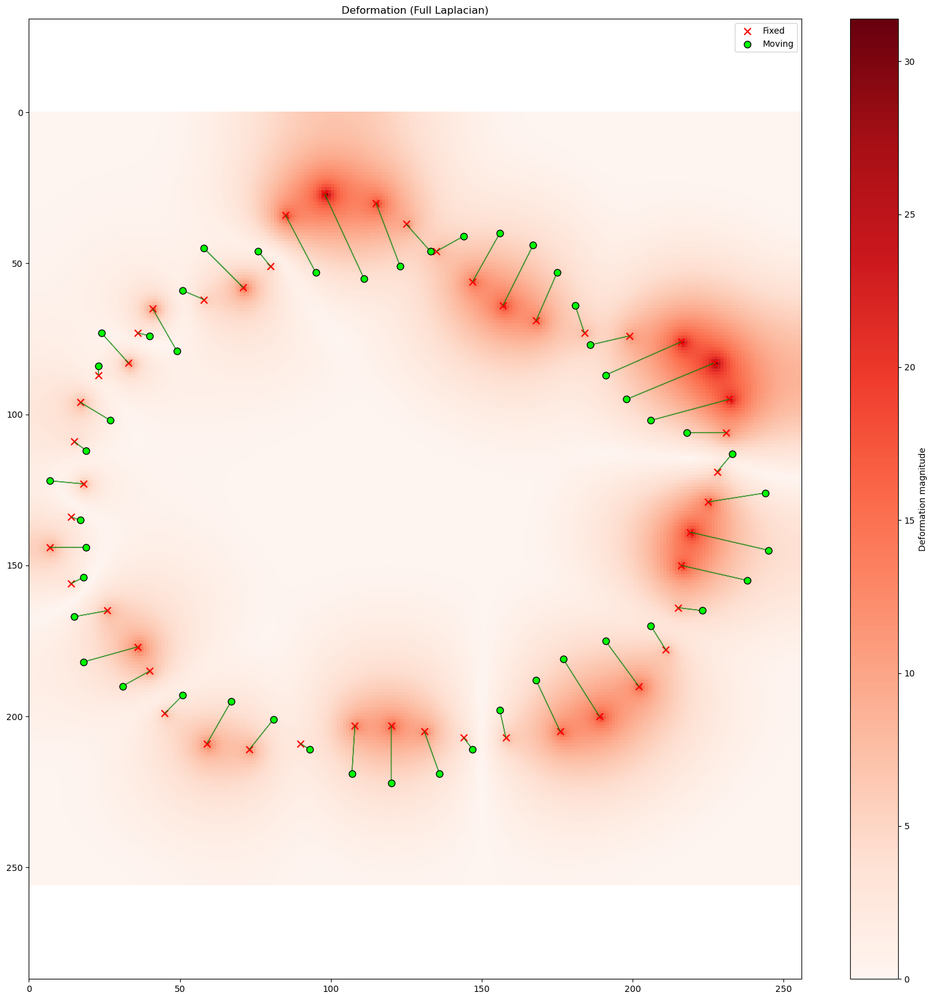

Min Jdet value: -4.0597, Max Jdet value: 6.2072
Number of negative Jdet values: 275
fdata.shape (1, 256, 256)
Time taken to create A:  0.06850719451904297
Error: X=0.81, Y=0.76, Z=0.00, Total=1.16


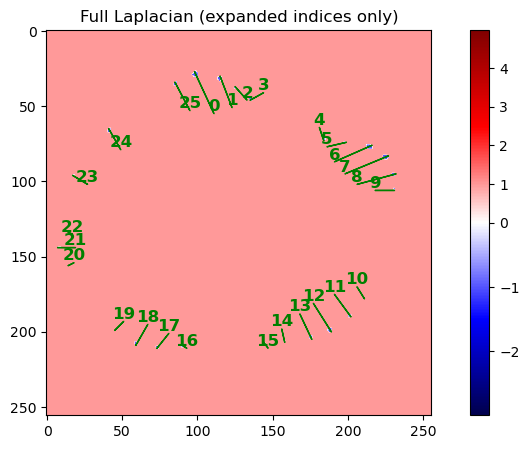

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16266479..1.1575387].


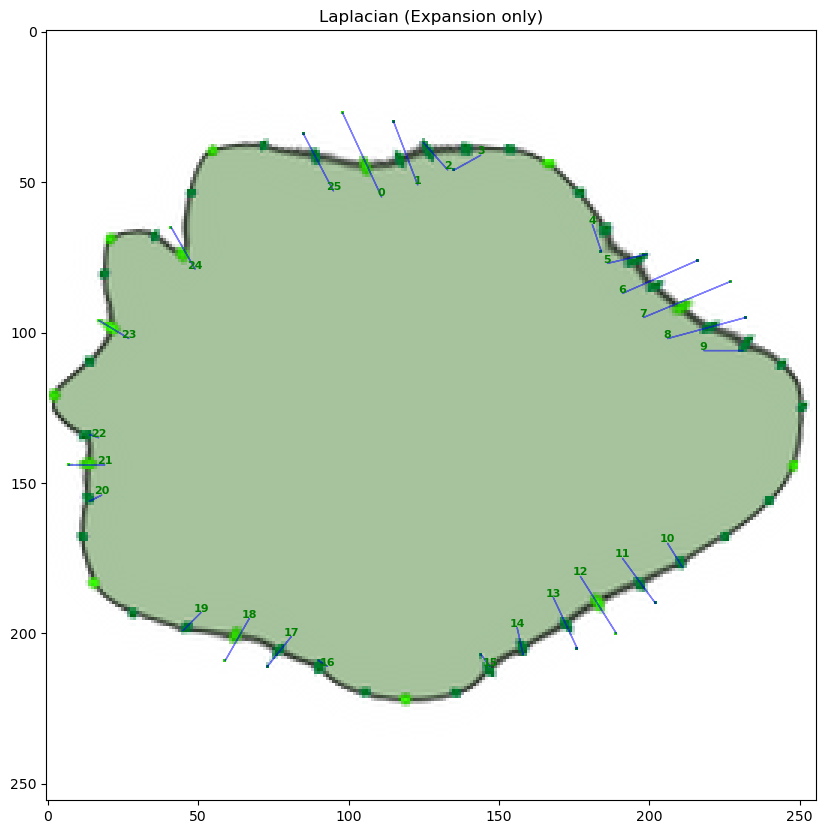

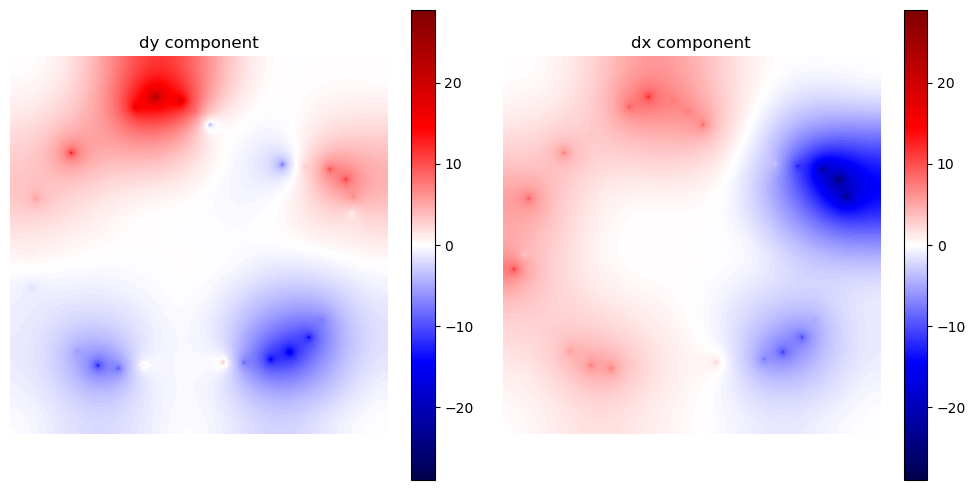

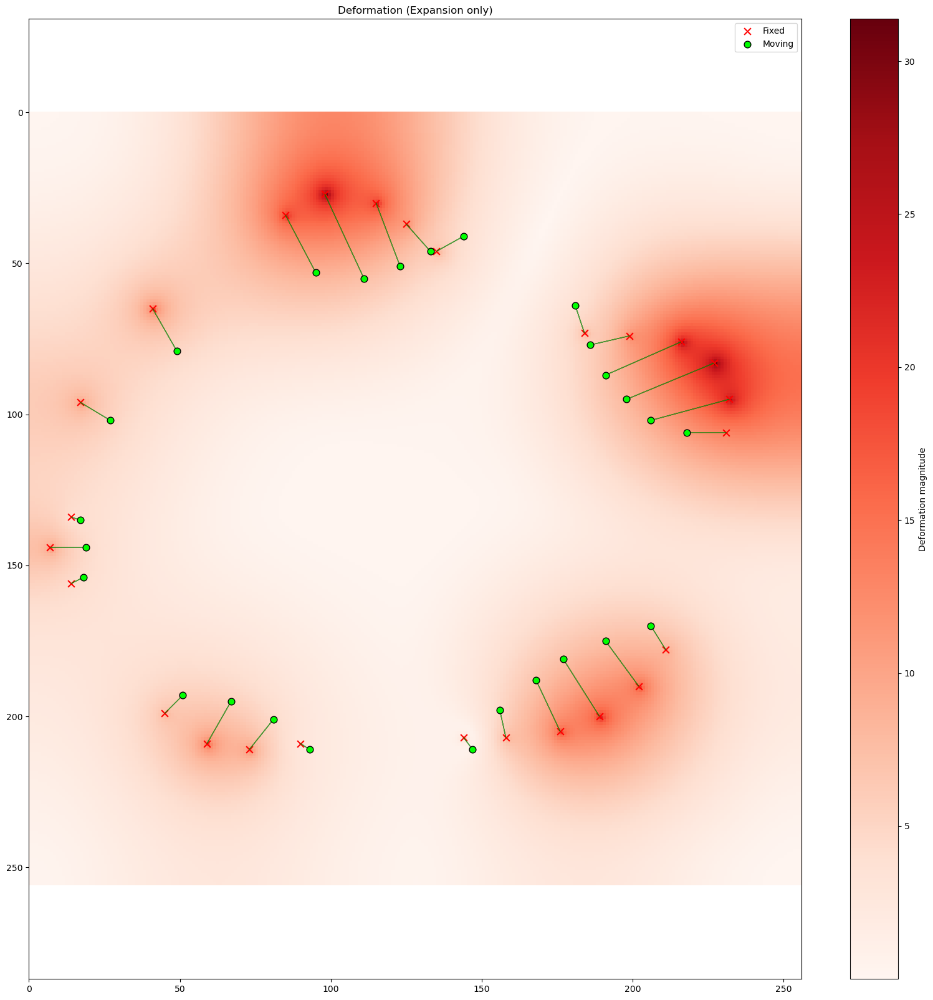

Min Jdet value: -2.9916, Max Jdet value: 4.9779
Number of negative Jdet values: 85
fdata.shape (1, 256, 256)
Time taken to create A:  0.07001209259033203
Error: X=64.65, Y=53.02, Z=0.00, Total=86.51


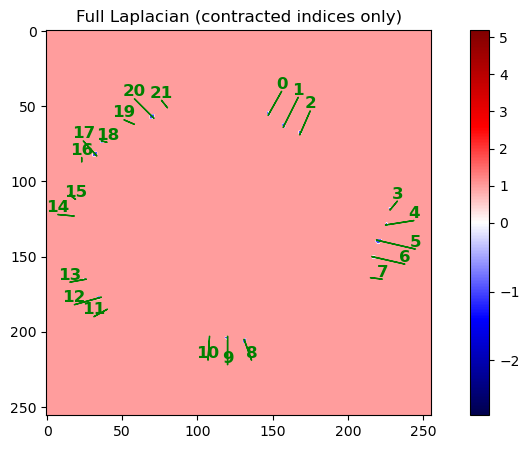

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17526962..1.1505109].


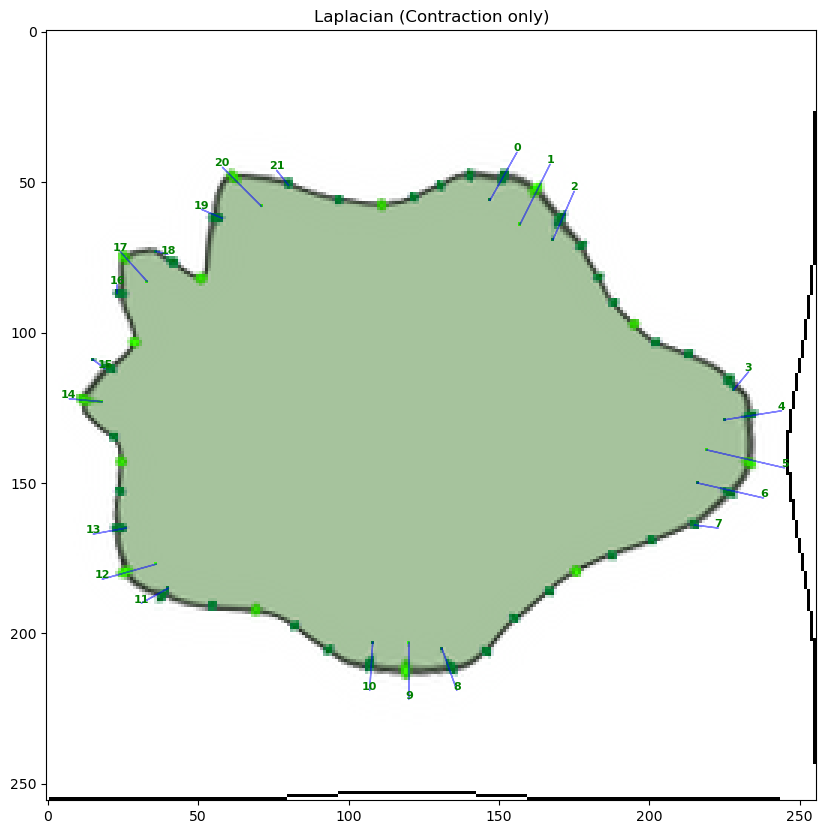

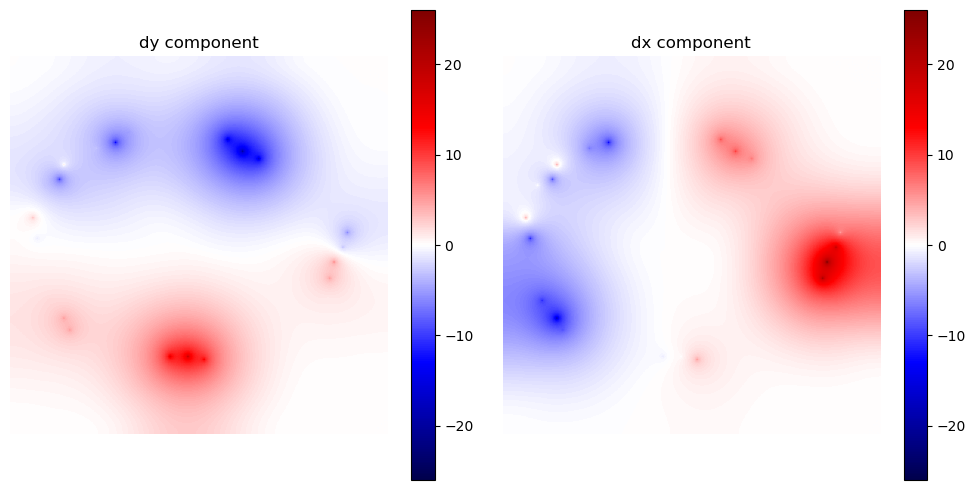

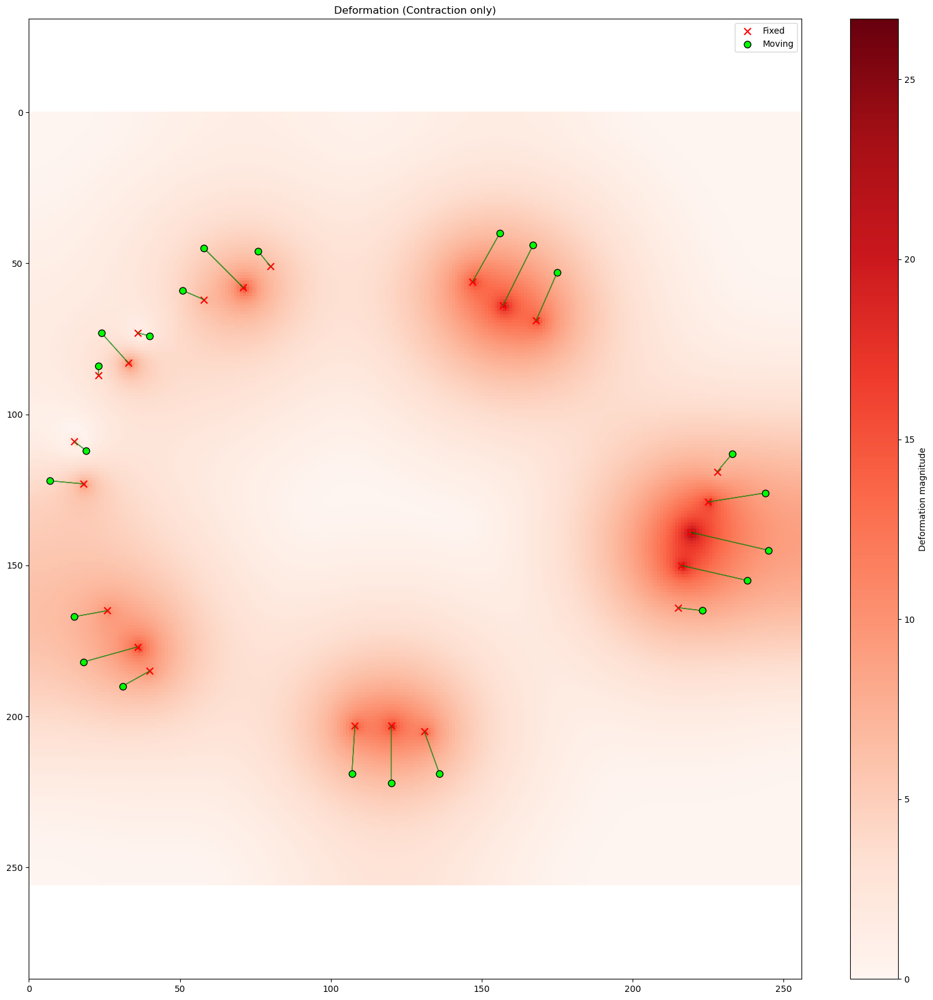

Min Jdet value: -2.7963, Max Jdet value: 5.1864
Number of negative Jdet values: 65
fdata.shape (1, 256, 256)
Time taken to create A:  0.07201457023620605
Error: X=70.94, Y=66.38, Z=0.00, Total=101.72


In [65]:
# Load the correspondences from the CSV file
mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)
scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))

# Load and show the images
moving_image = load_png('moving_image_extra.png', scale=scale)
fixed_image = load_png('fixed_image_extra.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Deformation (Full Laplacian)", show_grid=False)
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with expansion indices only
d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
plot_dxdy(d_expand)
plot_2d_deformation_grid_v2(d_expand, mpoints[expansion_indices], fpoints[expansion_indices], title="Deformation (Expansion only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_expand.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_expand.resolution, mpoints, fpoints, d_expand.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with contraction indices only
d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
plot_dxdy(d_contract)
plot_2d_deformation_grid_v2(d_contract, mpoints[contraction_indices], fpoints[contraction_indices], title="Deformation (Contraction only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_contract.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_contract.resolution, mpoints, fpoints, d_contract.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

##### Clusters

EXPANSION FIRST


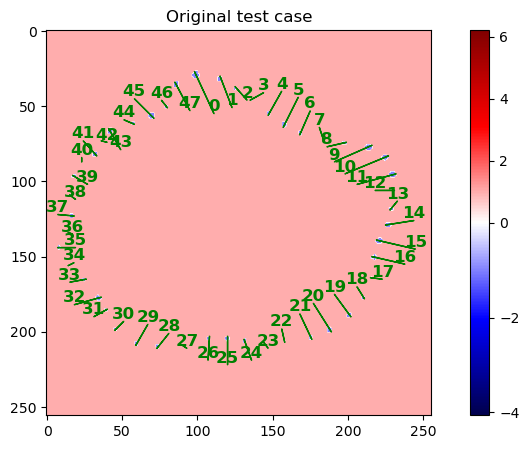


--- Iteration 1: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


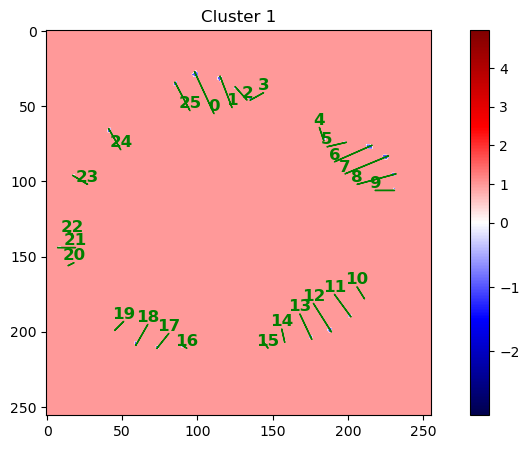

New coordinate for point 4:
	moving:	[  0  40 156] -> [  0  40 154]
	fixed:	[  0  56 147] -> [  0  54 144]
New coordinate for point 5:
	moving:	[  0  44 167] -> [  0  44 167]
	fixed:	[  0  64 157] -> [  0  63 157]
New coordinate for point 6:
	moving:	[  0  53 175] -> [  0  54 177]
	fixed:	[  0  69 168] -> [  0  69 171]
New coordinate for point 13:
	moving:	[  0 113 233] -> [  0 112 239]
	fixed:	[  0 119 228] -> [  0 118 234]
New coordinate for point 14:
	moving:	[  0 126 244] -> [  0 126 247]
	fixed:	[  0 129 225] -> [  0 129 230]
New coordinate for point 15:
	moving:	[  0 145 245] -> [  0 145 247]
	fixed:	[  0 139 219] -> [  0 139 223]
New coordinate for point 16:
	moving:	[  0 155 238] -> [  0 156 240]
	fixed:	[  0 150 216] -> [  0 152 220]
New coordinate for point 17:
	moving:	[  0 165 223] -> [  0 167 225]
	fixed:	[  0 164 215] -> [  0 167 218]
New coordinate for point 24:
	moving:	[  0 219 136] -> [  0 219 135]
	fixed:	[  0 205 131] -> [  0 206 131]
New coordinate for point 25:
	m

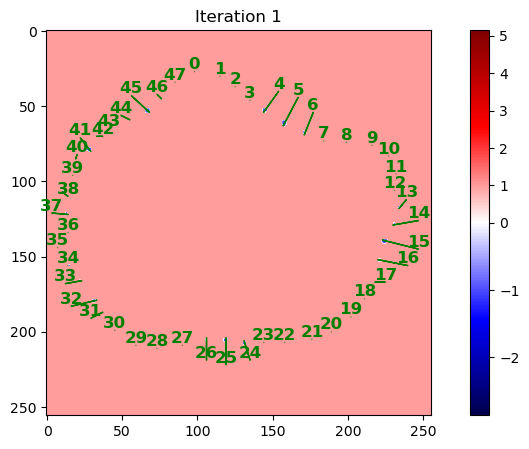


--- Iteration 2: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


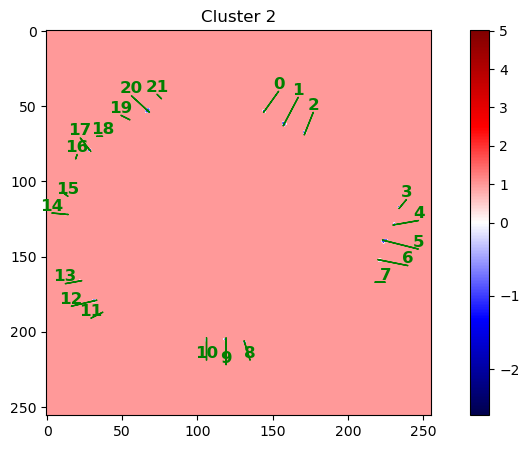

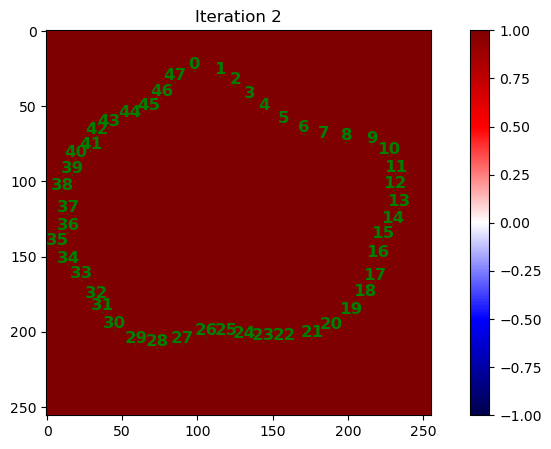


L2 error of combined DVF: 888.9764


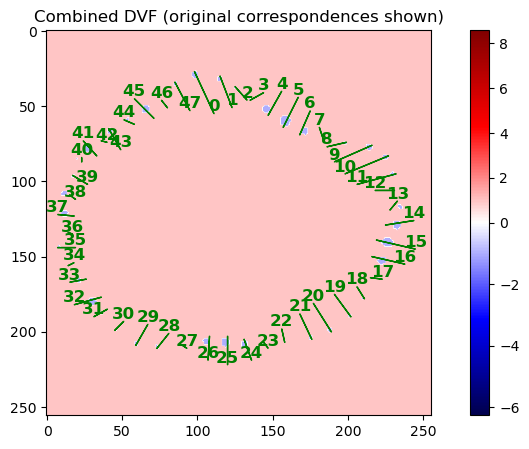

fdata.shape (1, 256, 256)
Time taken to create A:  0.058500051498413086
Error: X=90.28, Y=82.20, Z=0.00, Total=128.32
Number of negative Jdet values: 432


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19199811..1.1358516].


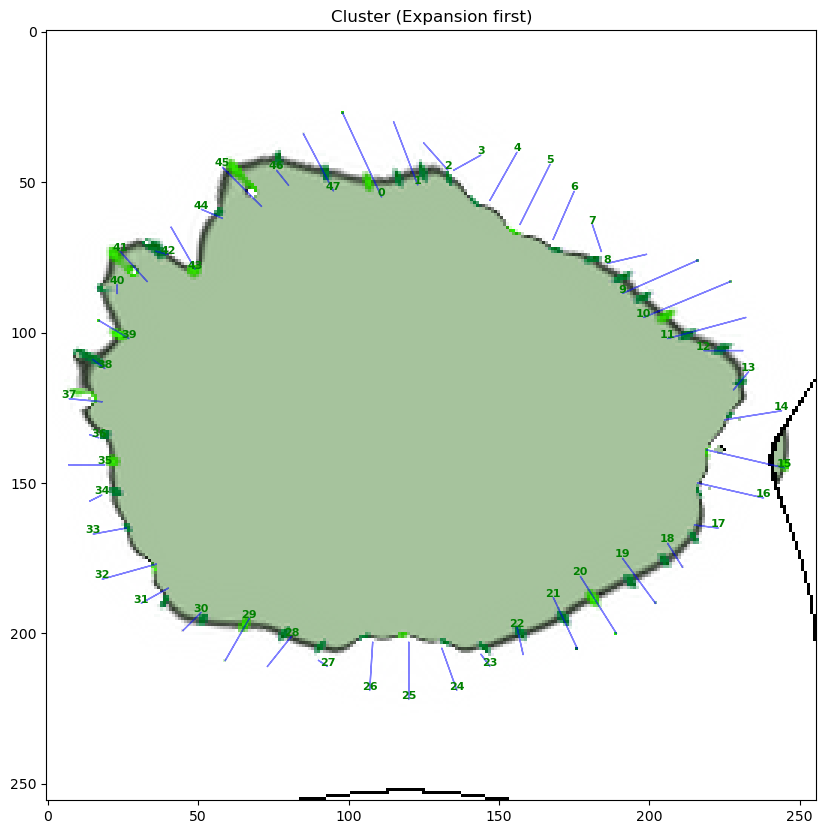

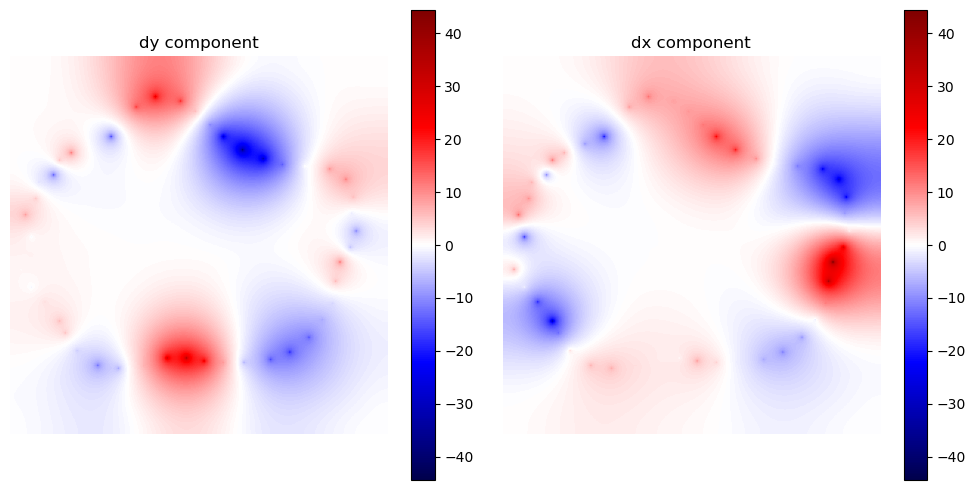

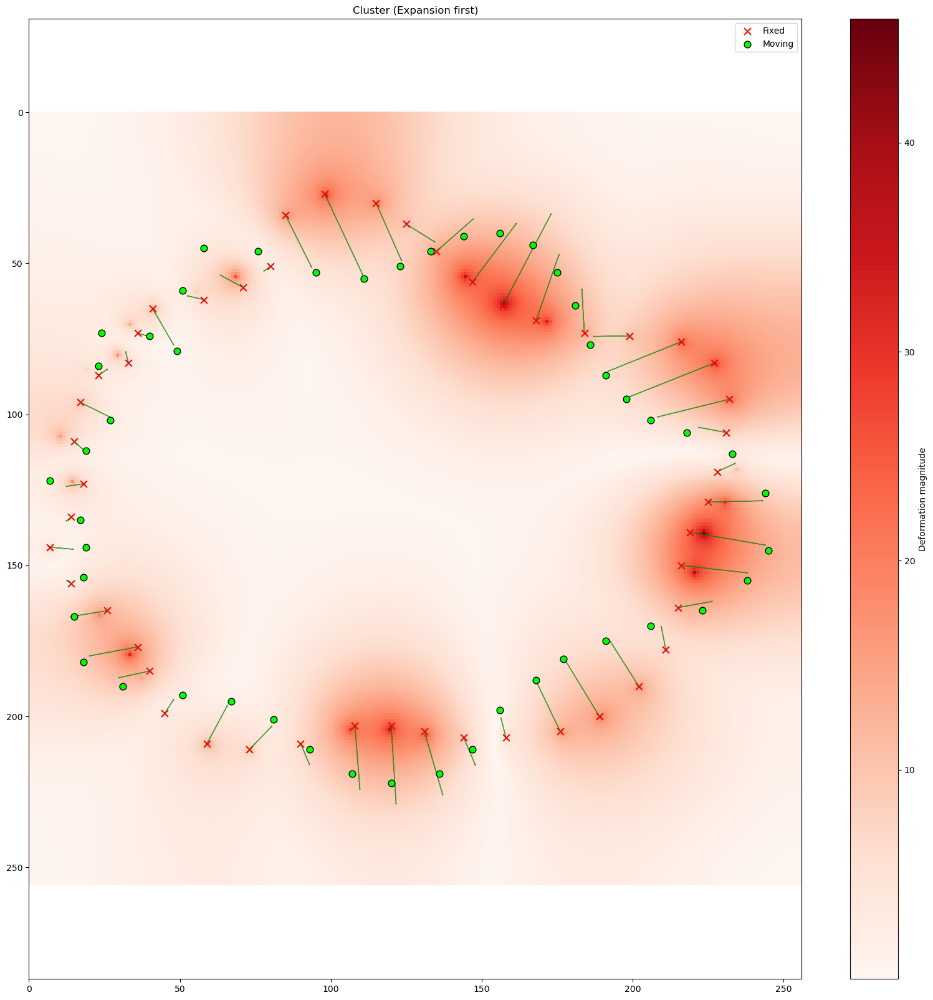






CONTRACTION FIRST


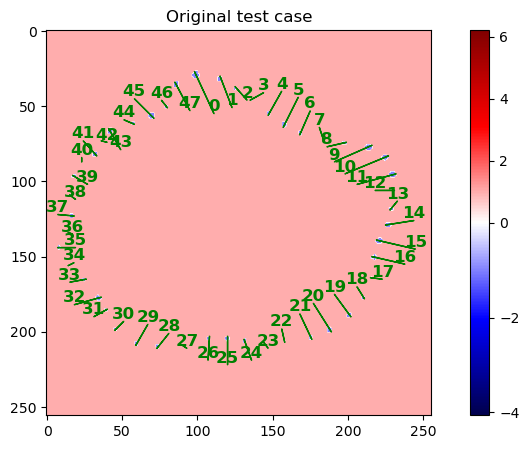


--- Iteration 1: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


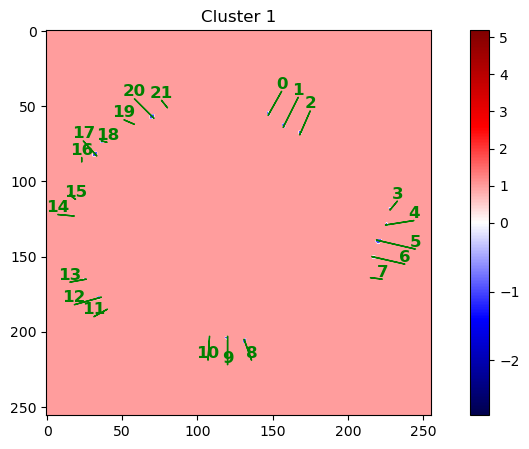

New coordinate for point 0:
	moving:	[  0  55 111] -> [  0  57 111]
	fixed:	[ 0 27 98] -> [ 0 29 99]
New coordinate for point 1:
	moving:	[  0  51 123] -> [  0  54 122]
	fixed:	[  0  30 115] -> [  0  32 115]
New coordinate for point 2:
	moving:	[  0  46 133] -> [  0  50 131]
	fixed:	[  0  37 125] -> [  0  40 124]
New coordinate for point 3:
	moving:	[  0  41 144] -> [  0  48 141]
	fixed:	[  0  46 135] -> [  0  51 133]
New coordinate for point 7:
	moving:	[  0  64 181] -> [  0  70 179]
	fixed:	[  0  73 184] -> [  0  77 183]
New coordinate for point 8:
	moving:	[  0  77 186] -> [  0  81 185]
	fixed:	[  0  74 199] -> [  0  77 198]
New coordinate for point 9:
	moving:	[  0  87 191] -> [  0  89 190]
	fixed:	[  0  76 216] -> [  0  78 215]
New coordinate for point 10:
	moving:	[  0  95 198] -> [  0  97 197]
	fixed:	[  0  83 227] -> [  0  84 226]
New coordinate for point 11:
	moving:	[  0 102 206] -> [  0 103 205]
	fixed:	[  0  95 232] -> [  0  97 229]
New coordinate for point 12:
	moving:	[  

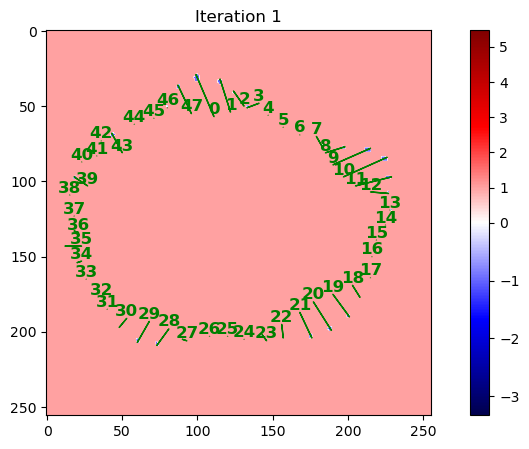


--- Iteration 2: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


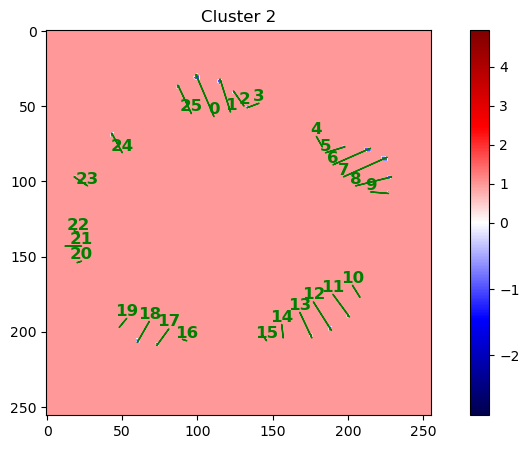

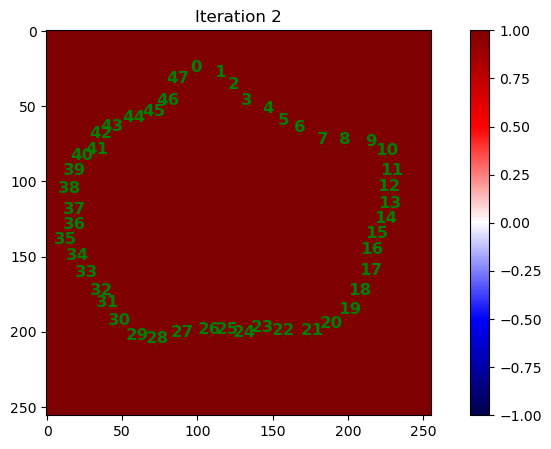


L2 error of combined DVF: 1347.4597


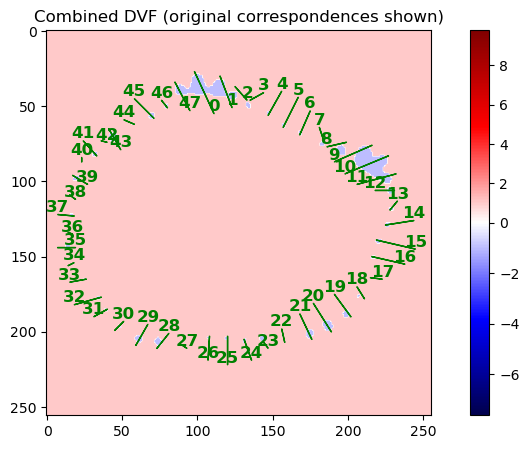

fdata.shape (1, 256, 256)
Time taken to create A:  0.06601357460021973
Error: X=89.09, Y=107.12, Z=0.00, Total=146.28
Number of negative Jdet values: 980


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18741186..1.1765534].


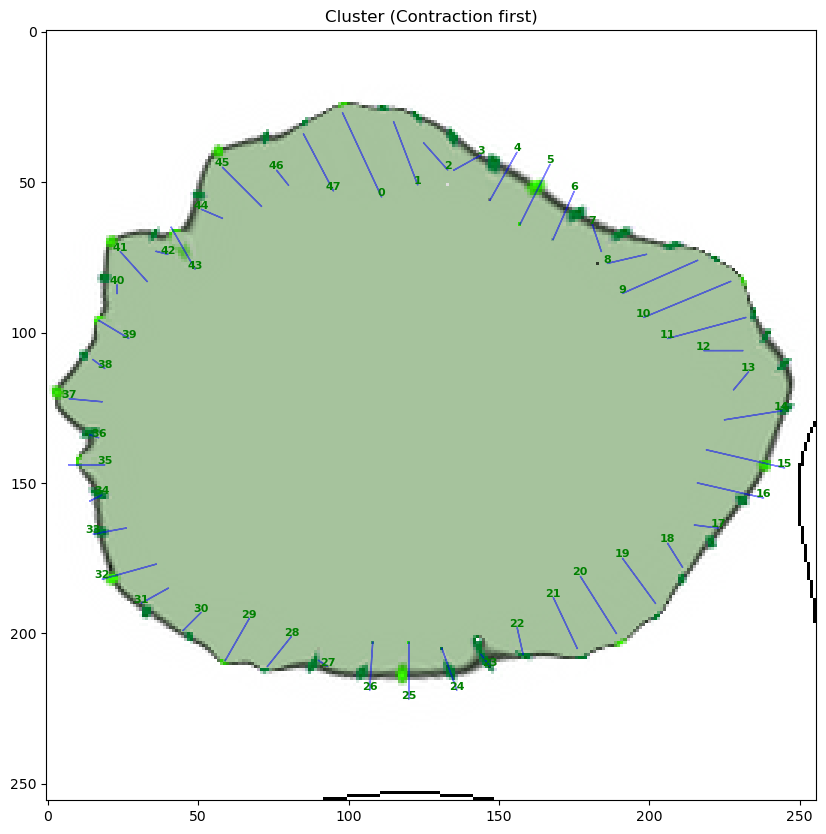

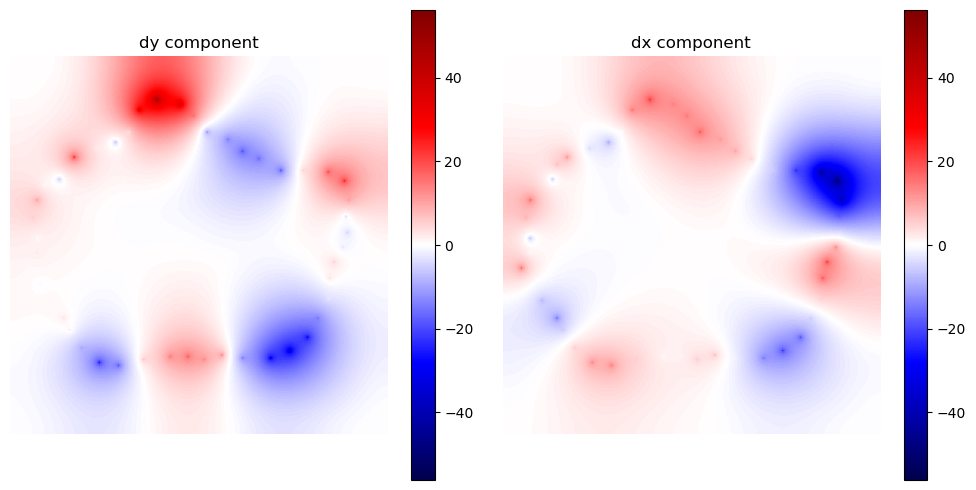

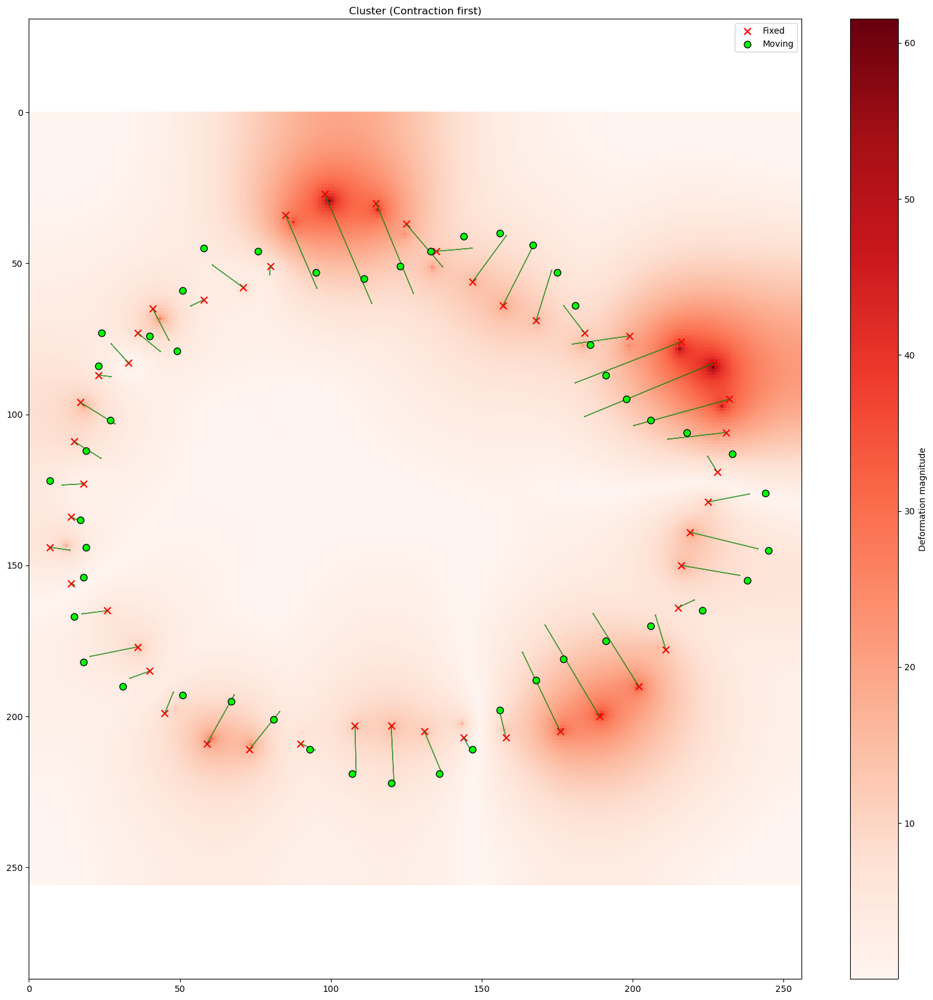

In [66]:
# Expansion first
print("EXPANSION FIRST")
d = cluster_iteration(mpoints, fpoints, [expansion_indices, contraction_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Expansion first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Expansion first)", show_grid=False)

print("\n\n\n\n")
print("CONTRACTION FIRST")

# Contraction first
d = cluster_iteration(mpoints, fpoints, [contraction_indices, expansion_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Contraction first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Contraction first)", show_grid=False)

#### Scale down 0.5 (extra points)

In [78]:
resolution = (256, 256)  # Original resolution
scale = 0.5  # Scale factor for the image (try 0.11)
correspondences_path = 'correspondences_extra.csv'  # Path to the CSV file with correspondences

# Indices
expansion_indices = [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47]  # Indices that expand the image outwards
contraction_indices = [idx for idx in range(0, 48) if idx not in expansion_indices]  # Indices that shrink the image inwards

Moving and fixed images:


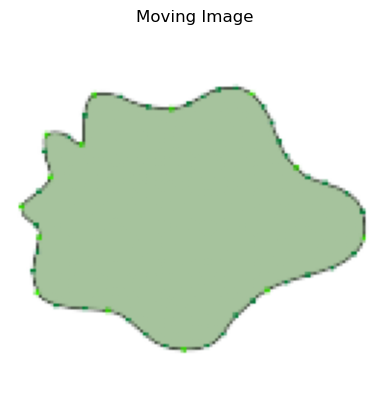

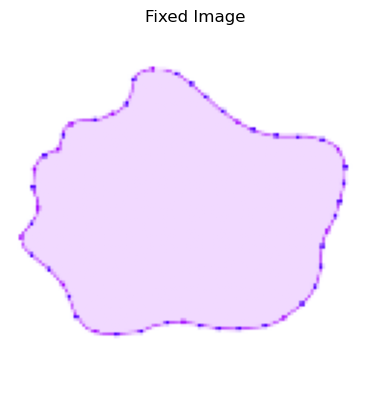

Laplacian tests:


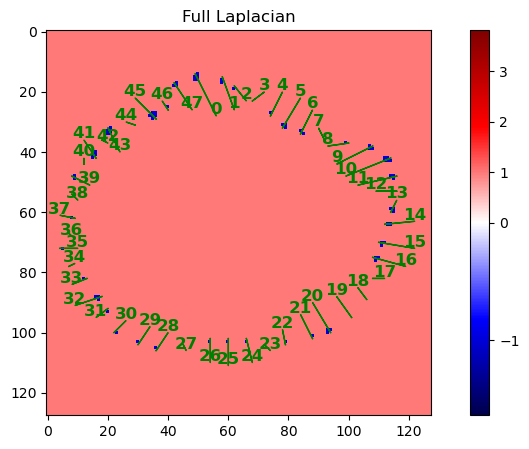

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16506213..1.129375].


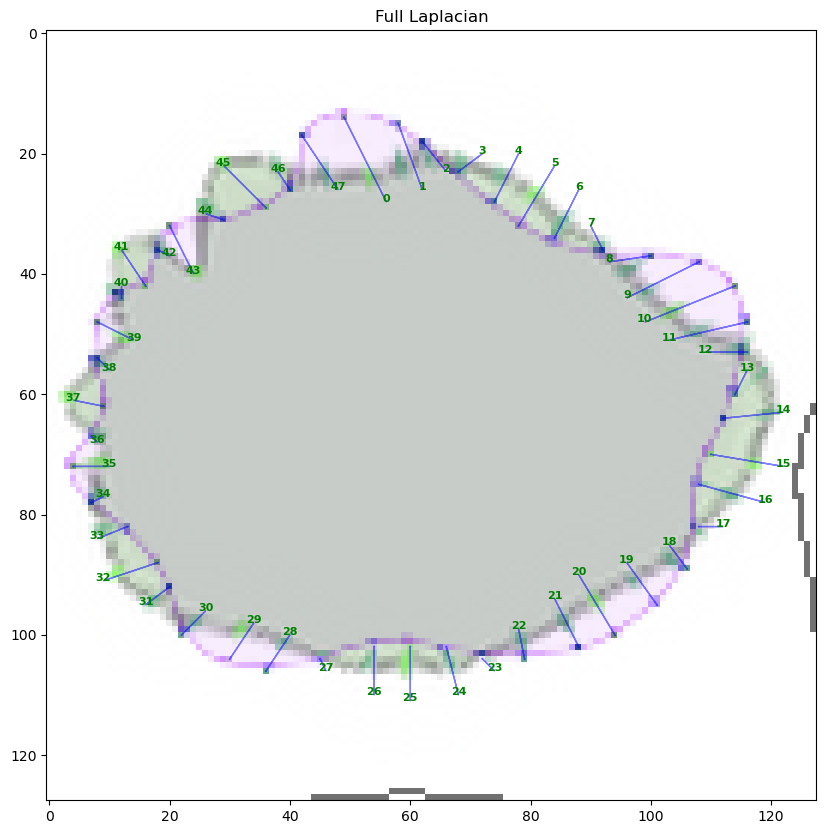

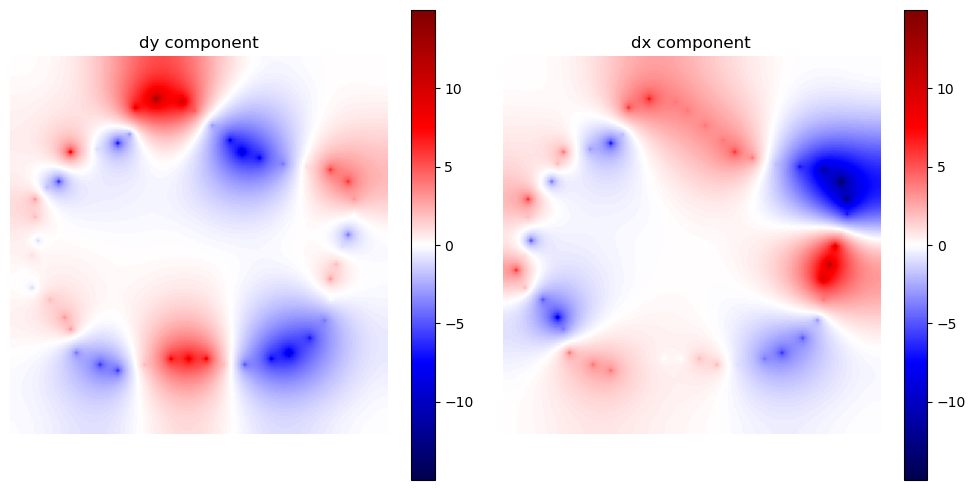

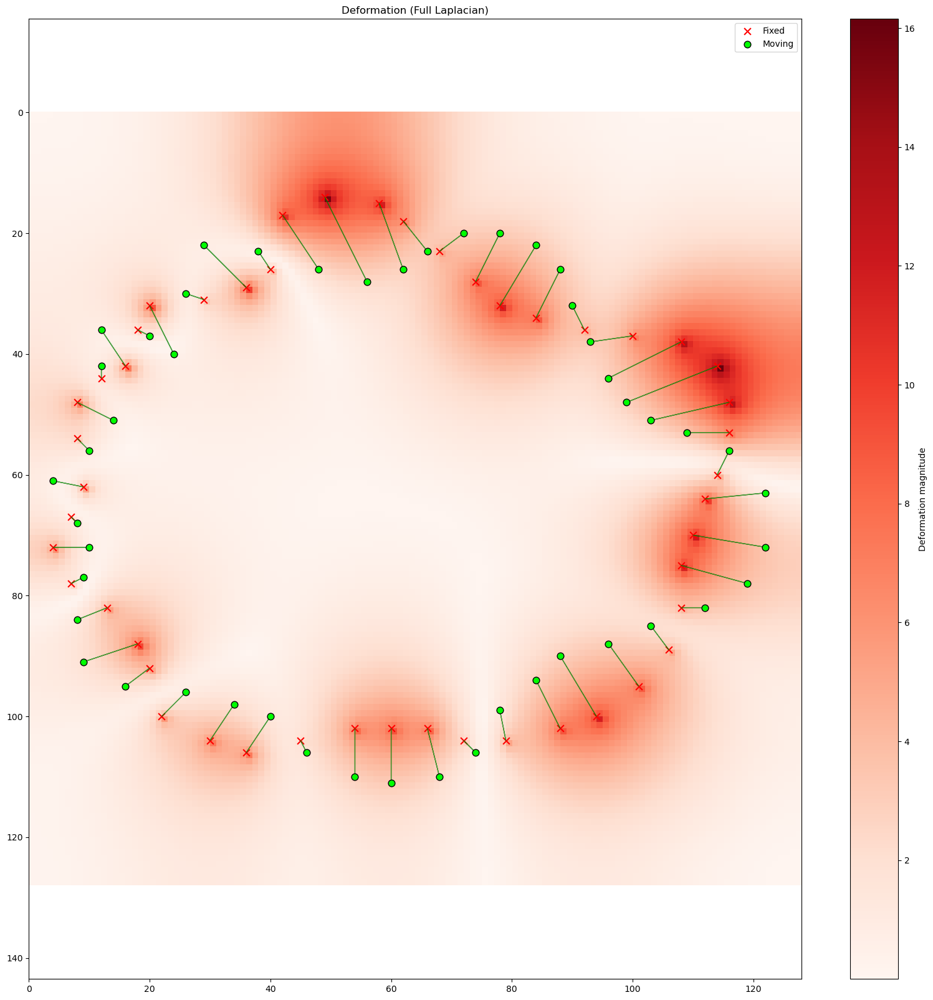

Min Jdet value: -1.6359, Max Jdet value: 3.8170
Number of negative Jdet values: 76
fdata.shape (1, 128, 128)
Time taken to create A:  0.08260774612426758
Error: X=0.41, Y=0.39, Z=0.00, Total=0.61


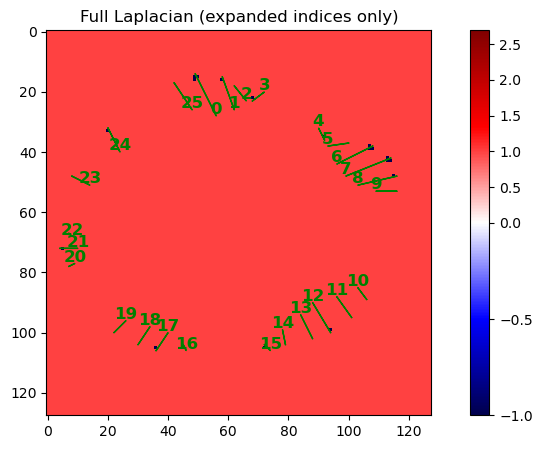

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18994157..1.1813775].


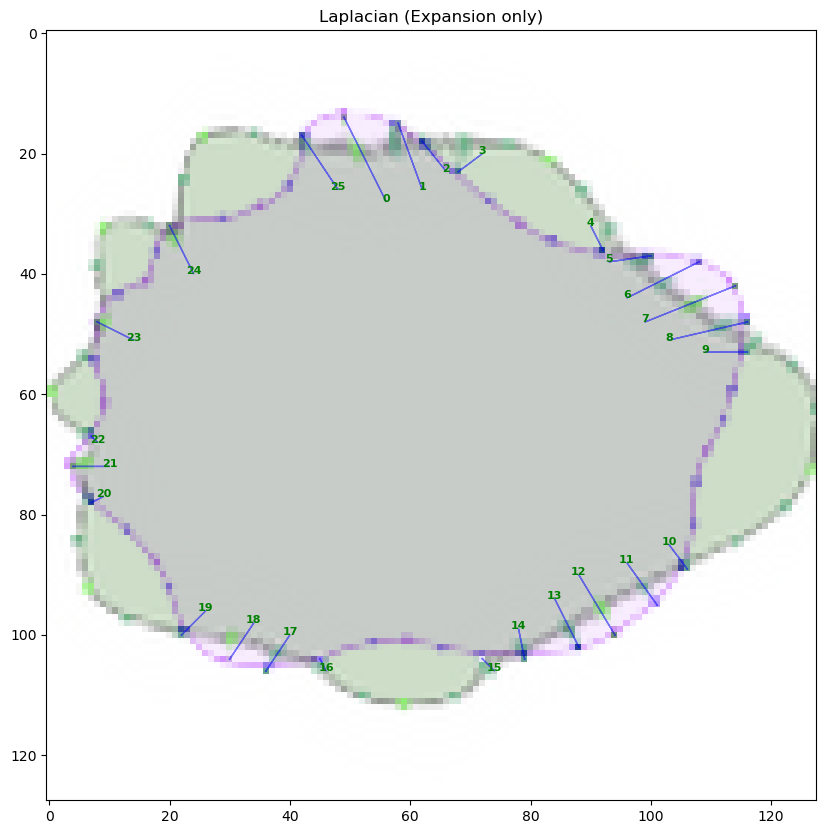

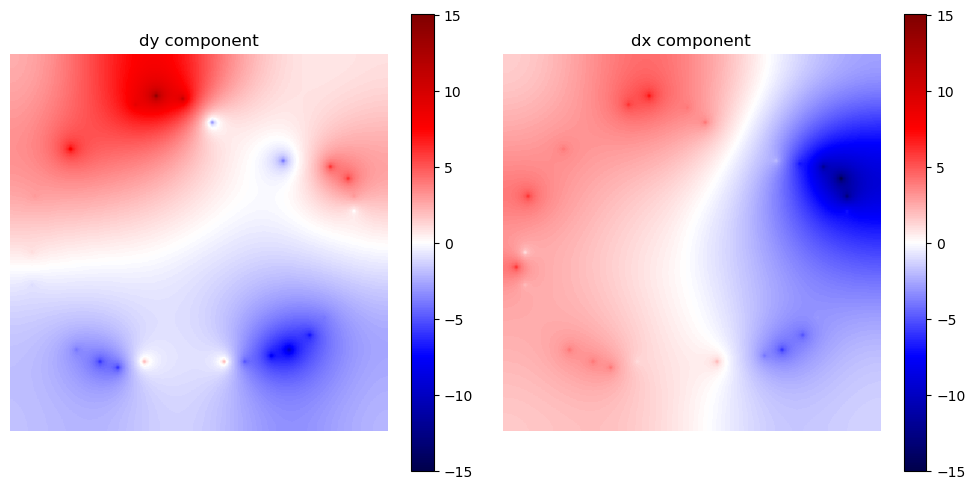

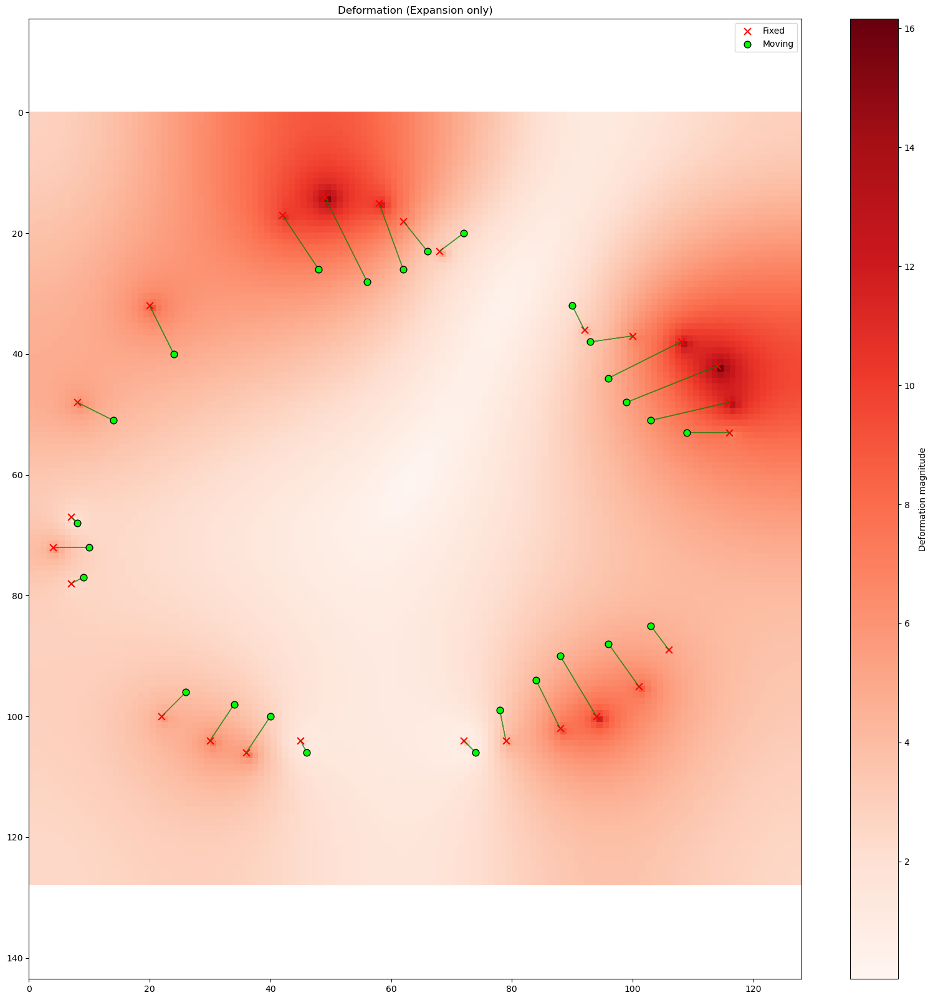

Min Jdet value: -0.9425, Max Jdet value: 2.6953
Number of negative Jdet values: 19
fdata.shape (1, 128, 128)
Time taken to create A:  0.07609272003173828
Error: X=38.16, Y=31.45, Z=0.00, Total=52.63


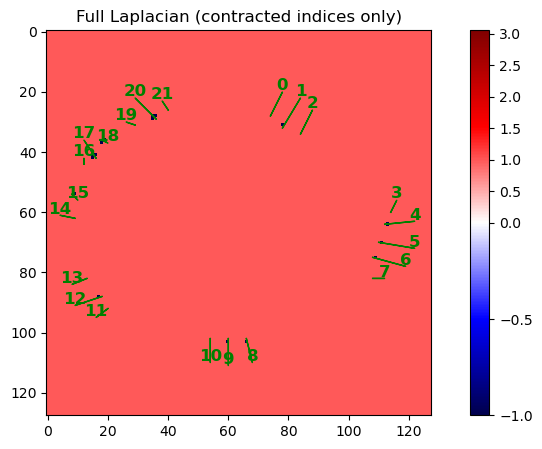

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15153855..1.1489186].


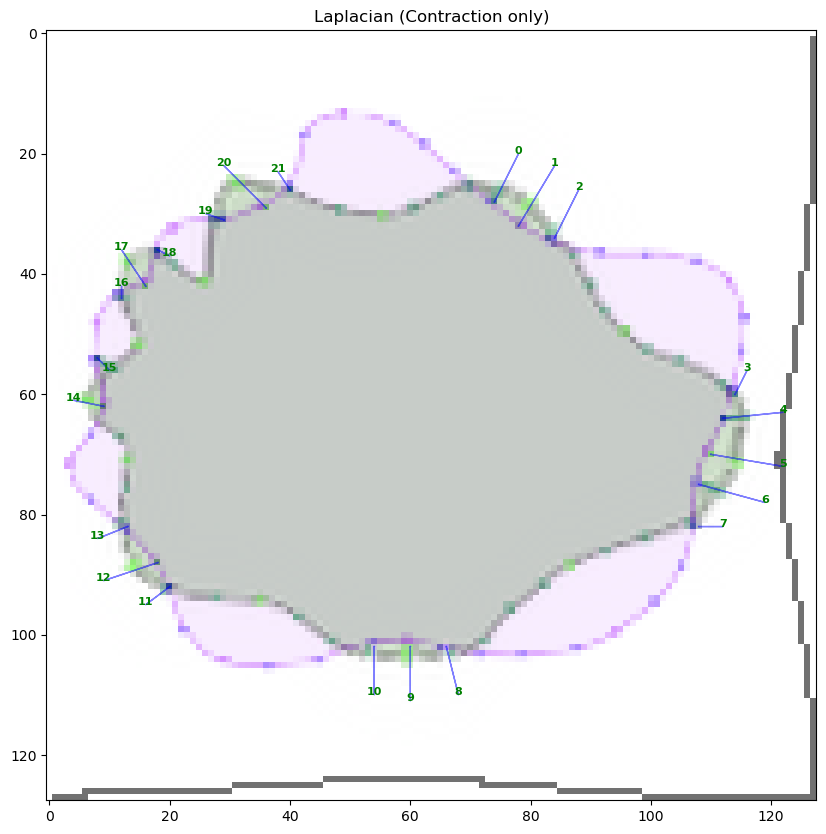

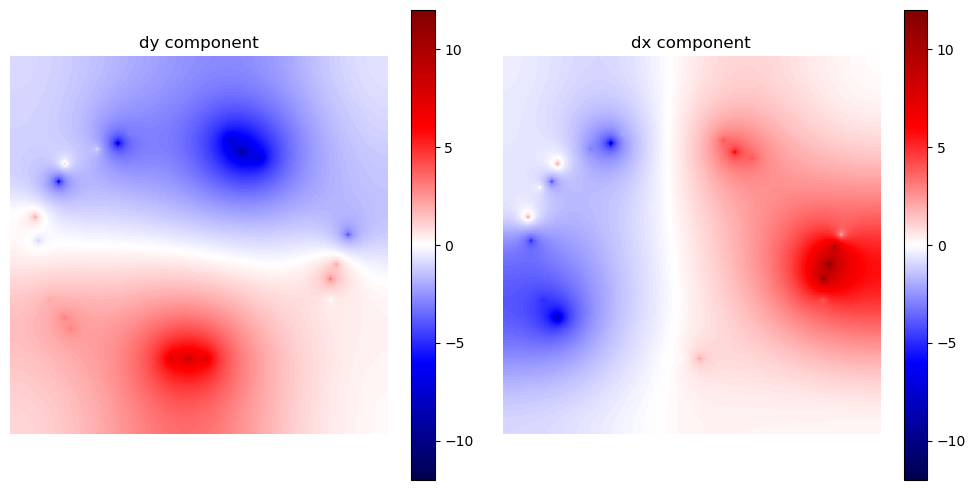

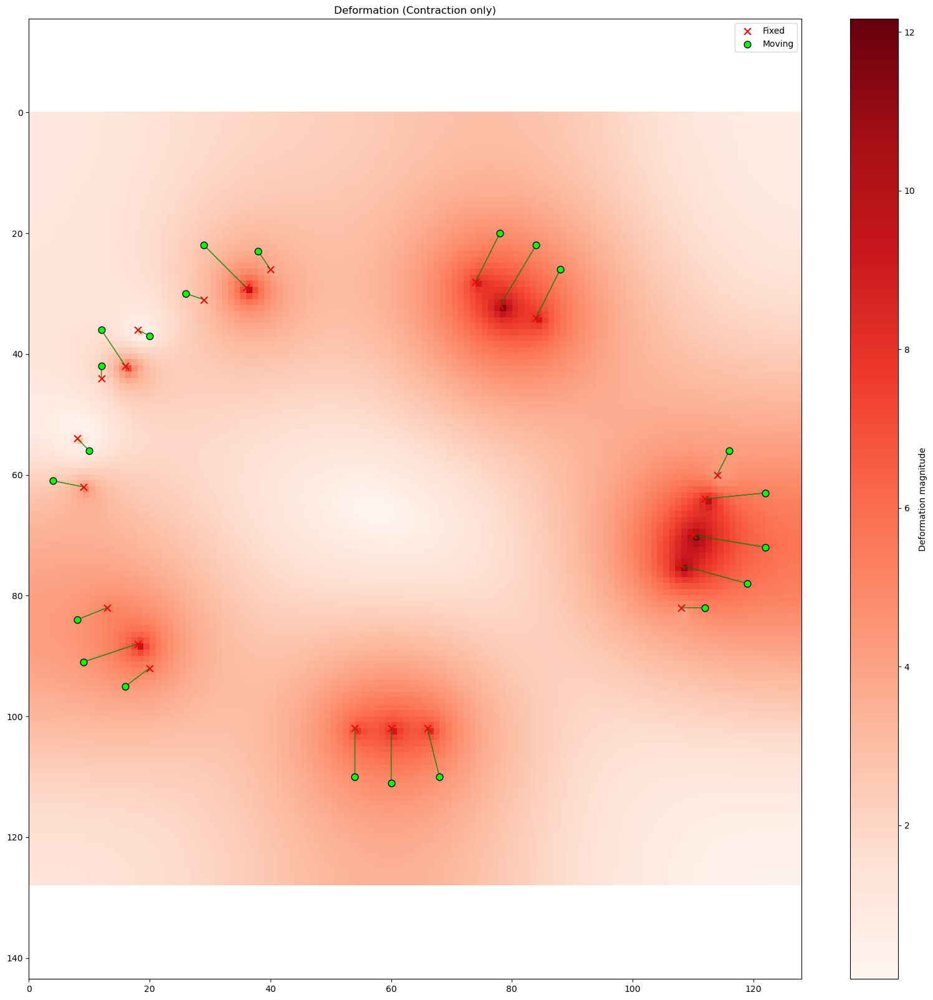

Min Jdet value: -0.6254, Max Jdet value: 3.0521
Number of negative Jdet values: 16
fdata.shape (1, 128, 128)
Time taken to create A:  0.08810877799987793
Error: X=39.85, Y=38.58, Z=0.00, Total=56.79


In [79]:
# Load the correspondences from the CSV file
mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)
scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))

# Load and show the images
moving_image = load_png('moving_image_extra.png', scale=scale)
fixed_image = load_png('fixed_image_extra.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Deformation (Full Laplacian)", show_grid=False)
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with expansion indices only
d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
plot_dxdy(d_expand)
plot_2d_deformation_grid_v2(d_expand, mpoints[expansion_indices], fpoints[expansion_indices], title="Deformation (Expansion only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_expand.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_expand.resolution, mpoints, fpoints, d_expand.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with contraction indices only
d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
plot_dxdy(d_contract)
plot_2d_deformation_grid_v2(d_contract, mpoints[contraction_indices], fpoints[contraction_indices], title="Deformation (Contraction only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_contract.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_contract.resolution, mpoints, fpoints, d_contract.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

##### Clusters

EXPANSION FIRST


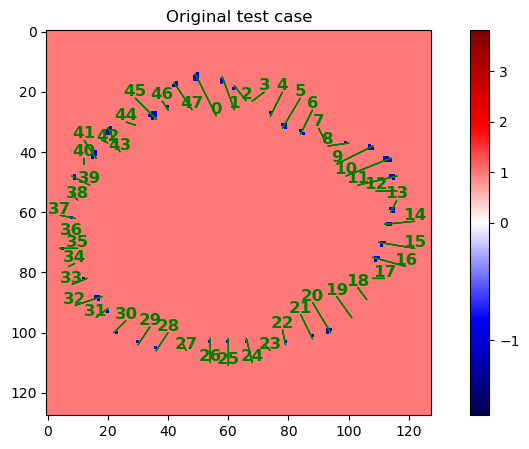

In [ ]:
# Expansion first
print("EXPANSION FIRST")
d = cluster_iteration(mpoints, fpoints, [expansion_indices, contraction_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Expansion first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Expansion first)", show_grid=False)

print("\n\n\n\n")
print("CONTRACTION FIRST")

# Contraction first
d = cluster_iteration(mpoints, fpoints, [contraction_indices, expansion_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Contraction first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Contraction first)", show_grid=False)

#### Scale down 0.25 (extra points)

In [70]:
resolution = (256, 256)  # Original resolution
scale = 0.25  # Scale factor for the image (try 0.11)
correspondences_path = 'correspondences_extra.csv'  # Path to the CSV file with correspondences

# Indices
expansion_indices = [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47]  # Indices that expand the image outwards
contraction_indices = [idx for idx in range(0, 48) if idx not in expansion_indices]  # Indices that shrink the image inwards

Moving and fixed images:


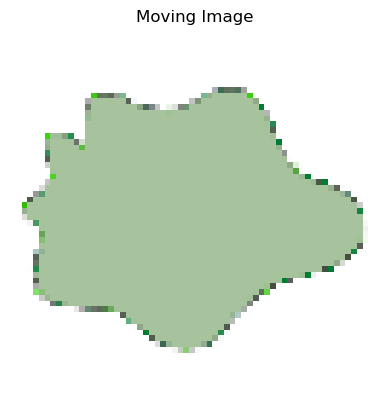

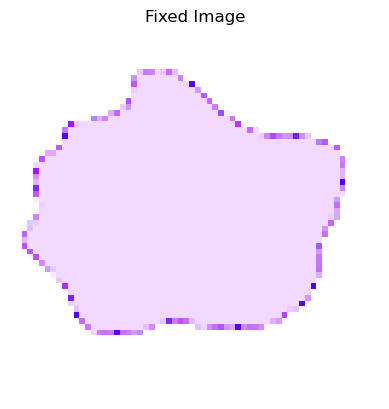

Laplacian tests:


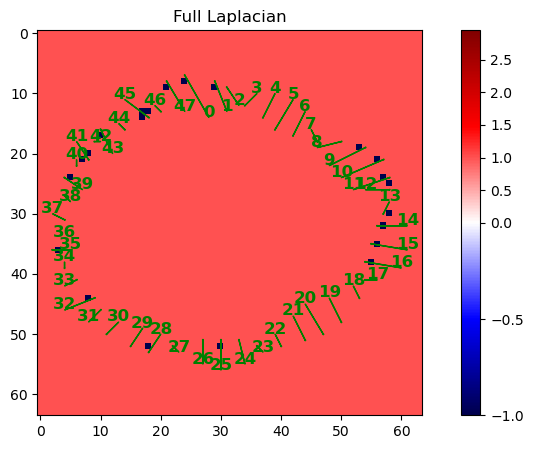

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00018249301..1.1571912].


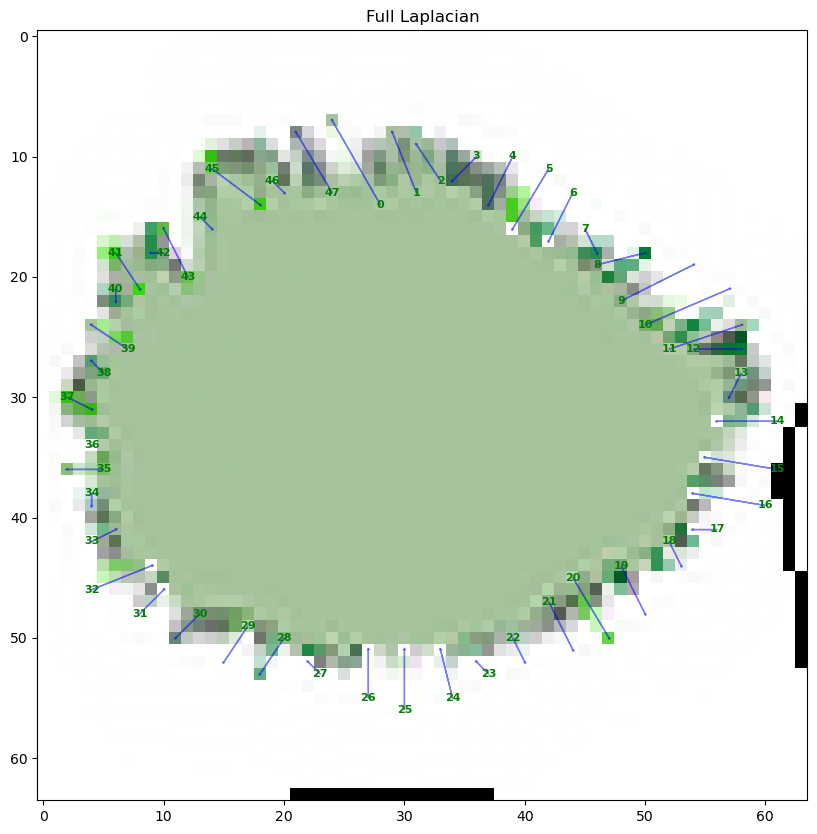

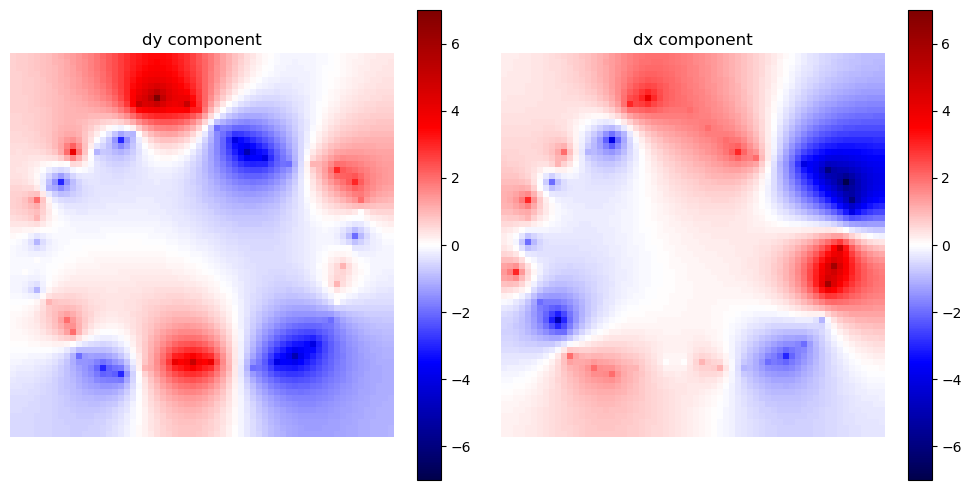

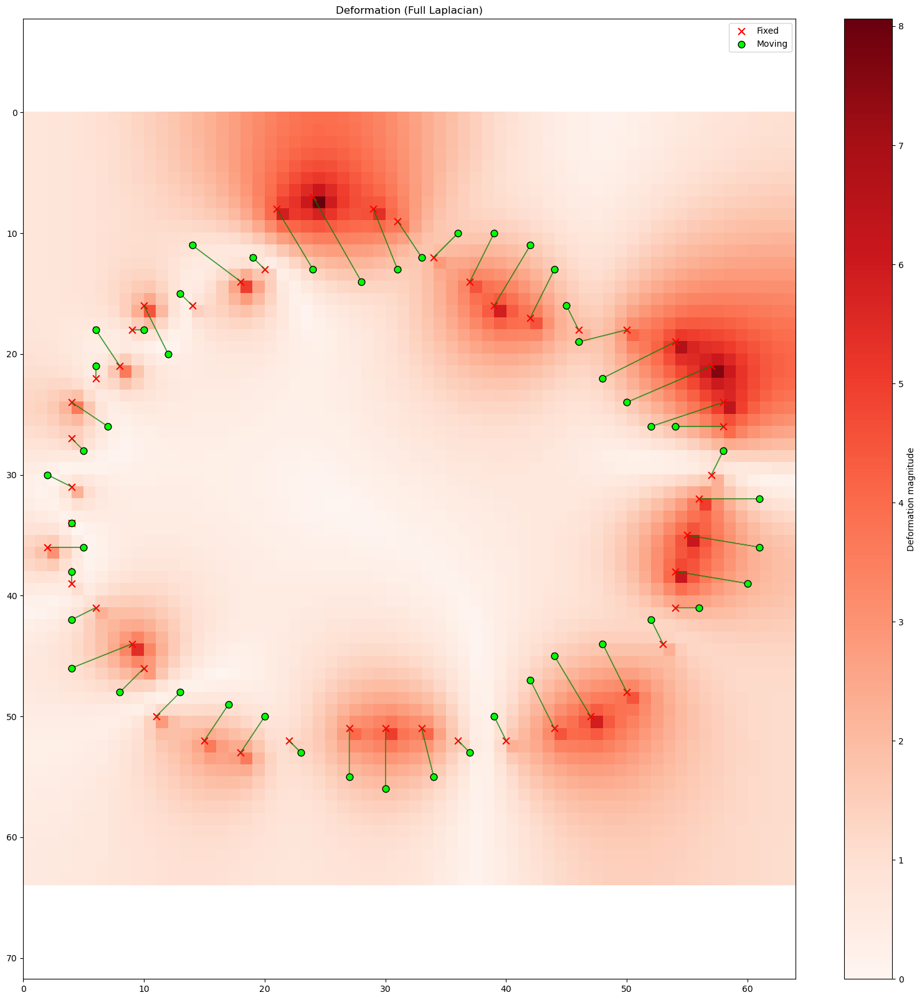

Min Jdet value: -0.5936, Max Jdet value: 2.9501
Number of negative Jdet values: 22
fdata.shape (1, 64, 64)
Time taken to create A:  0.0690152645111084
Error: X=0.19, Y=0.20, Z=0.00, Total=0.29


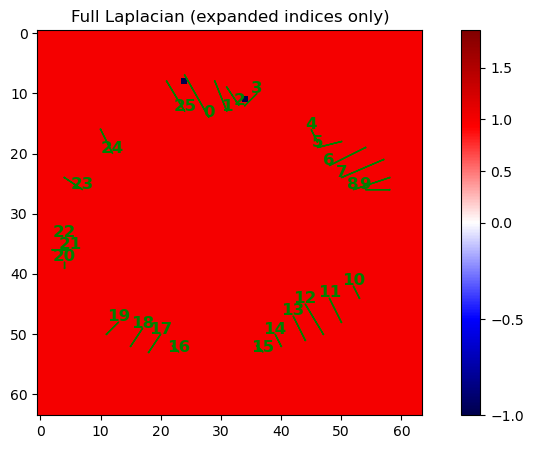

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0005910812..1.1482496].


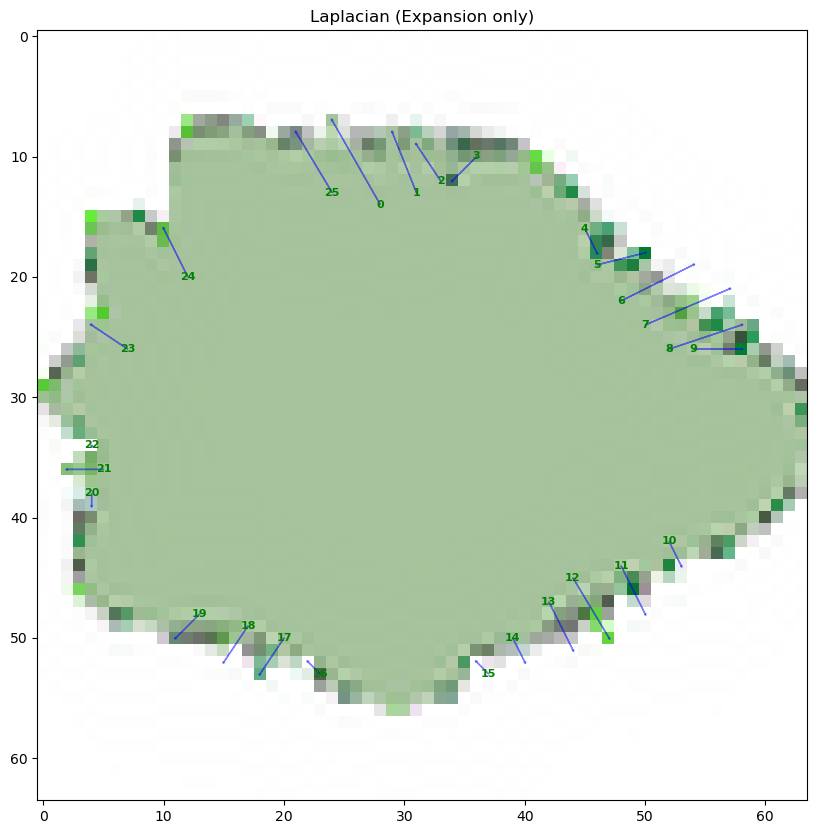

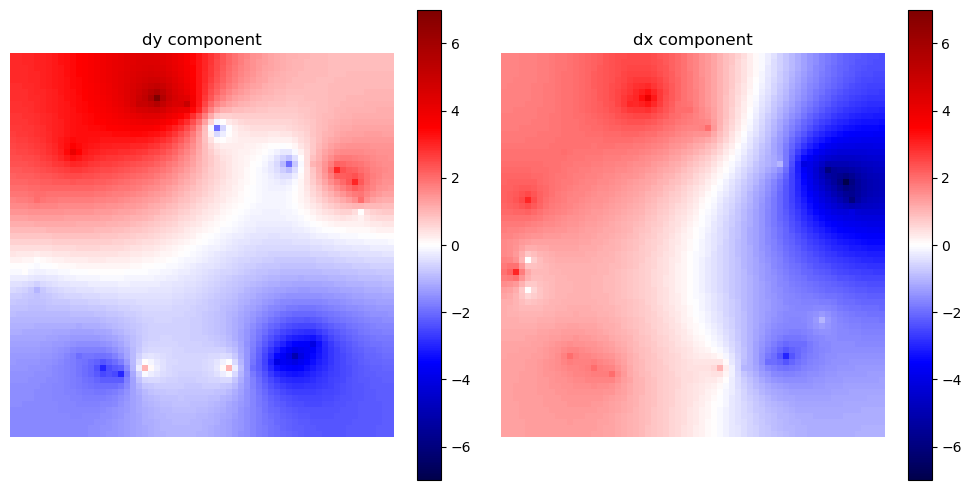

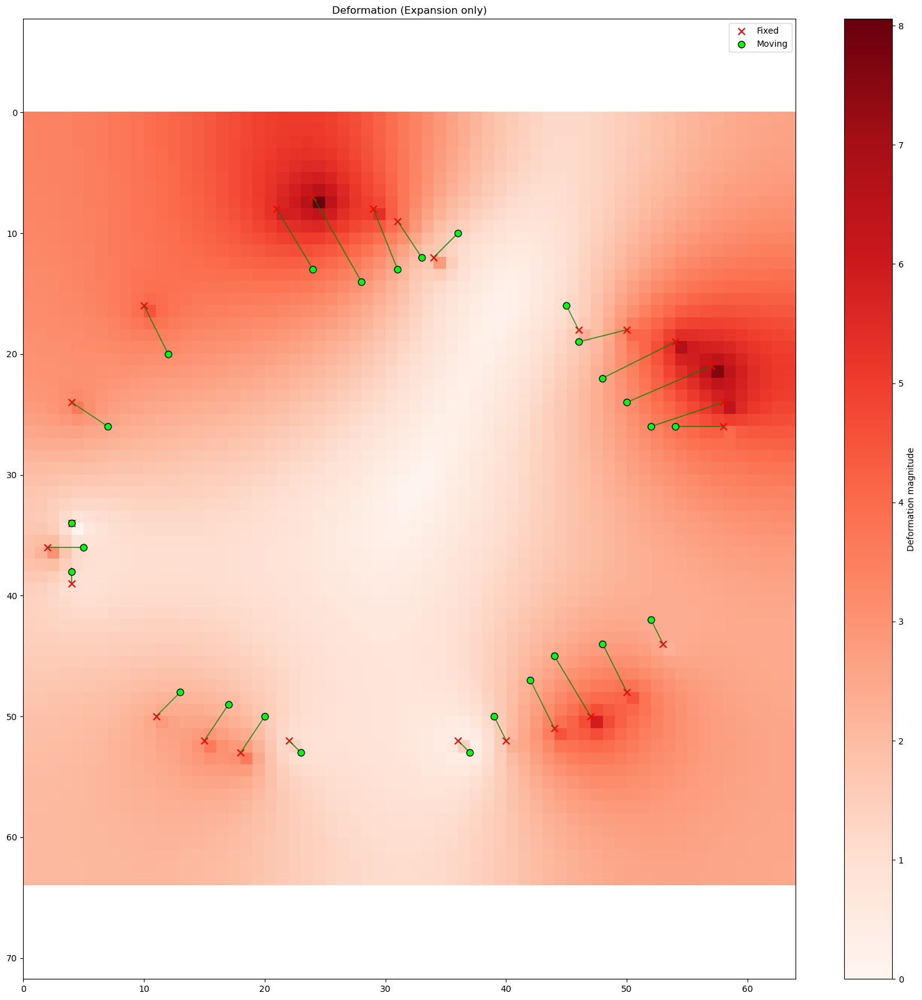

Min Jdet value: -0.2485, Max Jdet value: 1.8600
Number of negative Jdet values: 2
fdata.shape (1, 64, 64)
Time taken to create A:  0.06299901008605957
Error: X=20.00, Y=17.06, Z=0.00, Total=28.50


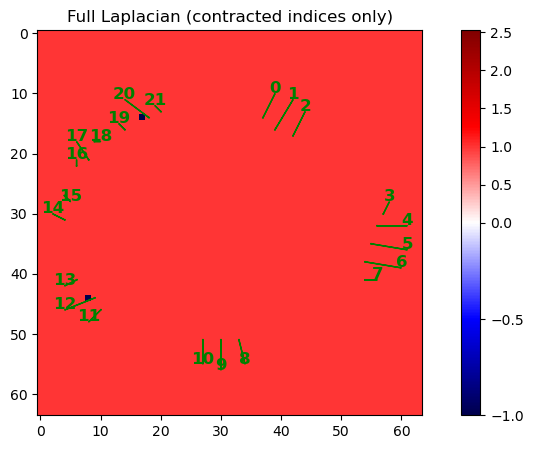

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.661476e-05..1.1304419].


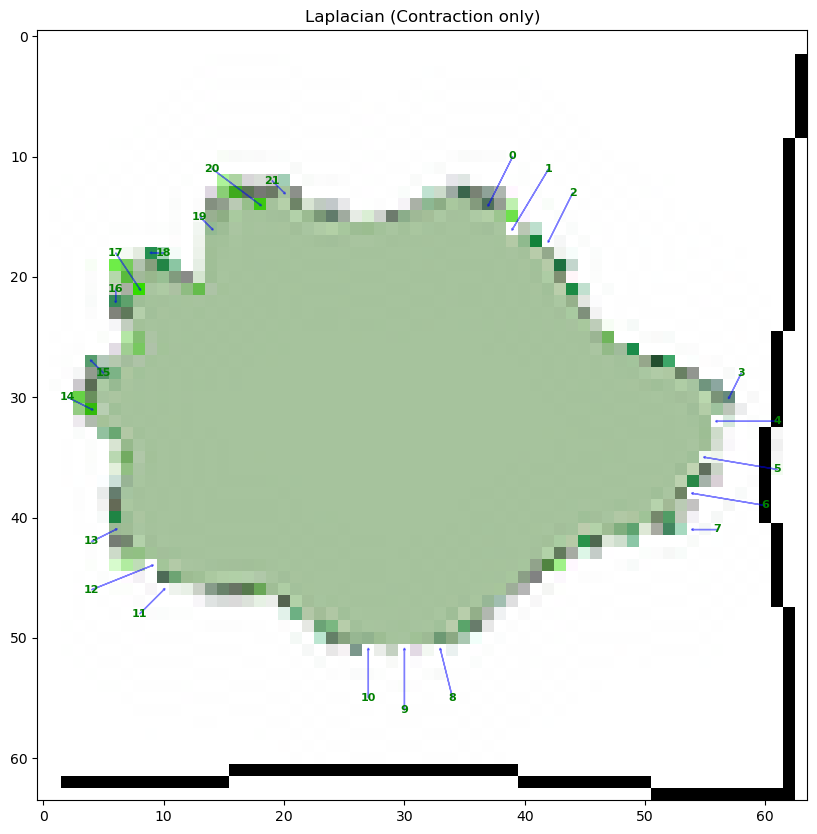

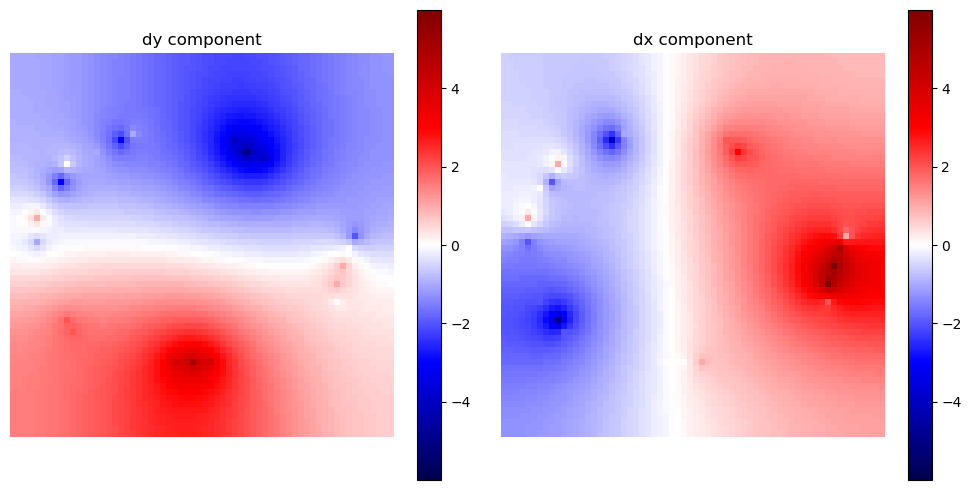

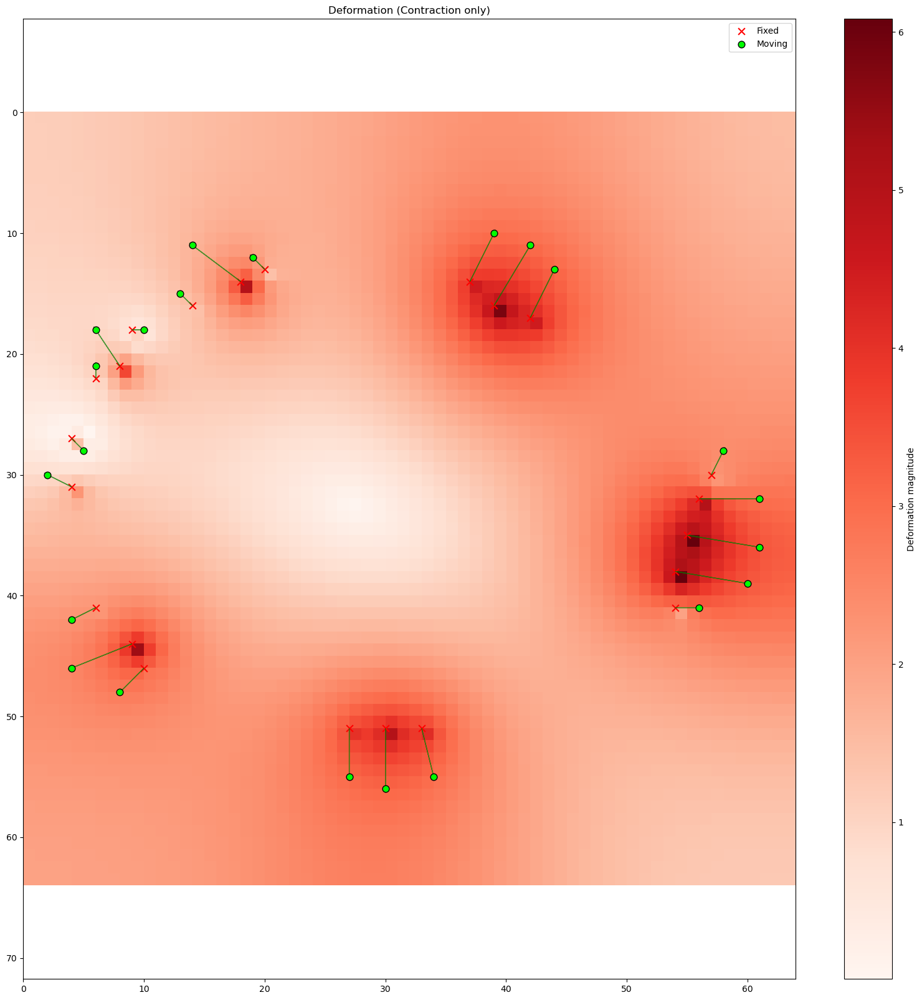

Min Jdet value: -0.0914, Max Jdet value: 2.5260
Number of negative Jdet values: 2
fdata.shape (1, 64, 64)
Time taken to create A:  0.05850791931152344
Error: X=21.06, Y=21.57, Z=0.00, Total=30.35


In [71]:
# Load the correspondences from the CSV file
mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)
scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))

# Load and show the images
moving_image = load_png('moving_image_extra.png', scale=scale)
fixed_image = load_png('fixed_image_extra.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Deformation (Full Laplacian)", show_grid=False)
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with expansion indices only
d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
plot_dxdy(d_expand)
plot_2d_deformation_grid_v2(d_expand, mpoints[expansion_indices], fpoints[expansion_indices], title="Deformation (Expansion only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_expand.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_expand.resolution, mpoints, fpoints, d_expand.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with contraction indices only
d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
plot_dxdy(d_contract)
plot_2d_deformation_grid_v2(d_contract, mpoints[contraction_indices], fpoints[contraction_indices], title="Deformation (Contraction only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_contract.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_contract.resolution, mpoints, fpoints, d_contract.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

##### Clusters

EXPANSION FIRST


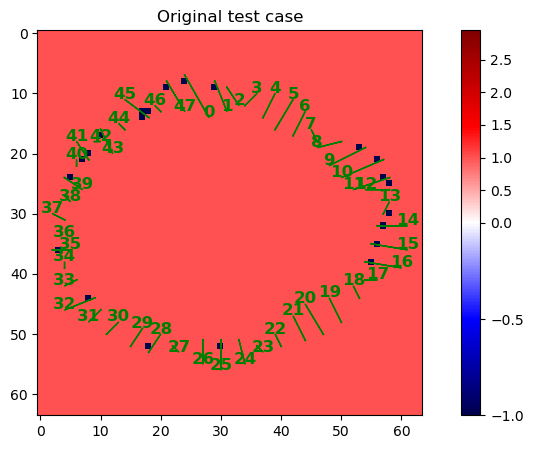


--- Iteration 1: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


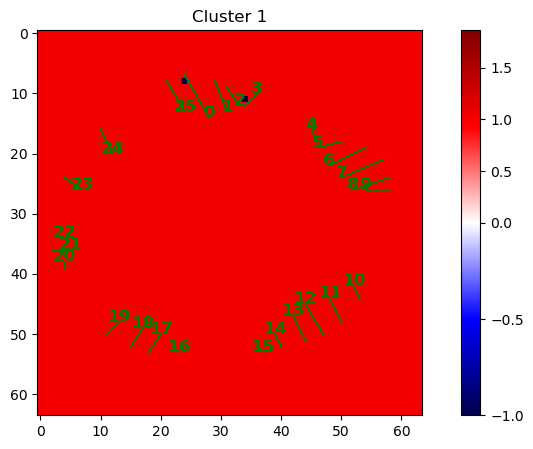

New coordinate for point 4:
	moving:	[ 0 10 39] -> [ 0 10 38]
	fixed:	[ 0 14 37] -> [ 0 13 36]
New coordinate for point 5:
	moving:	[ 0 11 42] -> [ 0 11 42]
	fixed:	[ 0 16 39] -> [ 0 15 39]
New coordinate for point 6:
	moving:	[ 0 13 44] -> [ 0 13 45]
	fixed:	[ 0 17 42] -> [ 0 17 43]
New coordinate for point 13:
	moving:	[ 0 28 58] -> [ 0 28 61]
	fixed:	[ 0 30 57] -> [ 0 30 60]
New coordinate for point 14:
	moving:	[ 0 32 61] -> [ 0 32 64]
	fixed:	[ 0 32 56] -> [ 0 32 59]
New coordinate for point 15:
	moving:	[ 0 36 61] -> [ 0 37 64]
	fixed:	[ 0 35 55] -> [ 0 36 58]
New coordinate for point 16:
	moving:	[ 0 39 60] -> [ 0 40 62]
	fixed:	[ 0 38 54] -> [ 0 39 56]
New coordinate for point 17:
	moving:	[ 0 41 56] -> [ 0 42 58]
	fixed:	[ 0 41 54] -> [ 0 43 56]
New coordinate for point 24:
	moving:	[ 0 55 34] -> [ 0 56 34]
	fixed:	[ 0 51 33] -> [ 0 52 33]
New coordinate for point 25:
	moving:	[ 0 56 30] -> [ 0 57 29]
	fixed:	[ 0 51 30] -> [ 0 52 30]
New coordinate for point 26:
	moving:	[ 0 5

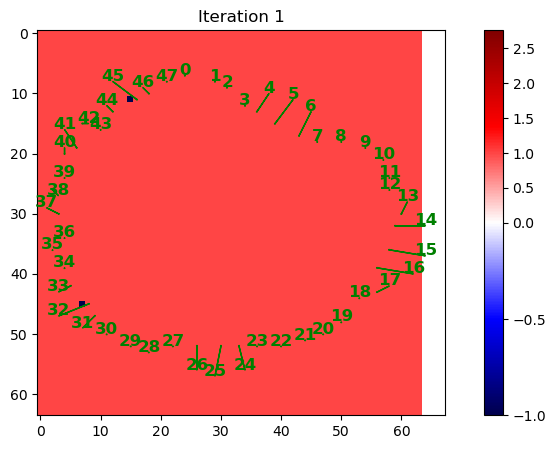


--- Iteration 2: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


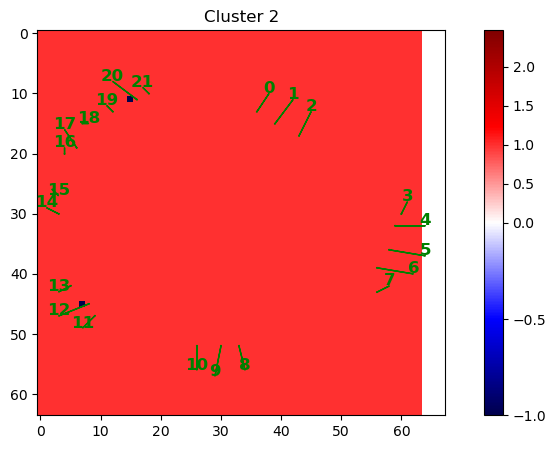

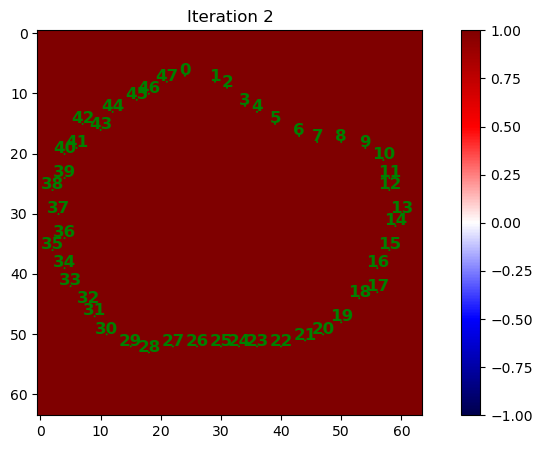


L2 error of combined DVF: 106.3551


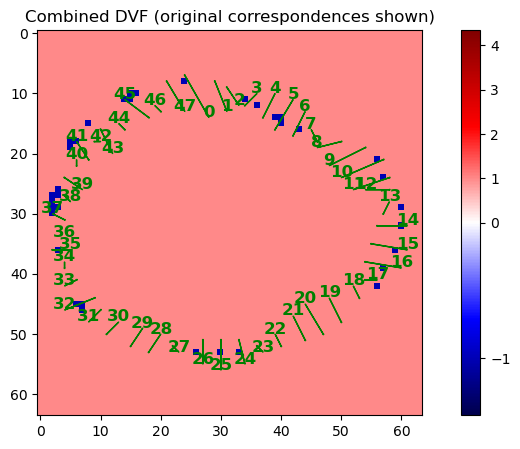

fdata.shape (1, 64, 64)
Time taken to create A:  0.05900883674621582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022984903..1.1523552].


Error: X=32.80, Y=27.37, Z=0.00, Total=49.45
Number of negative Jdet values: 36


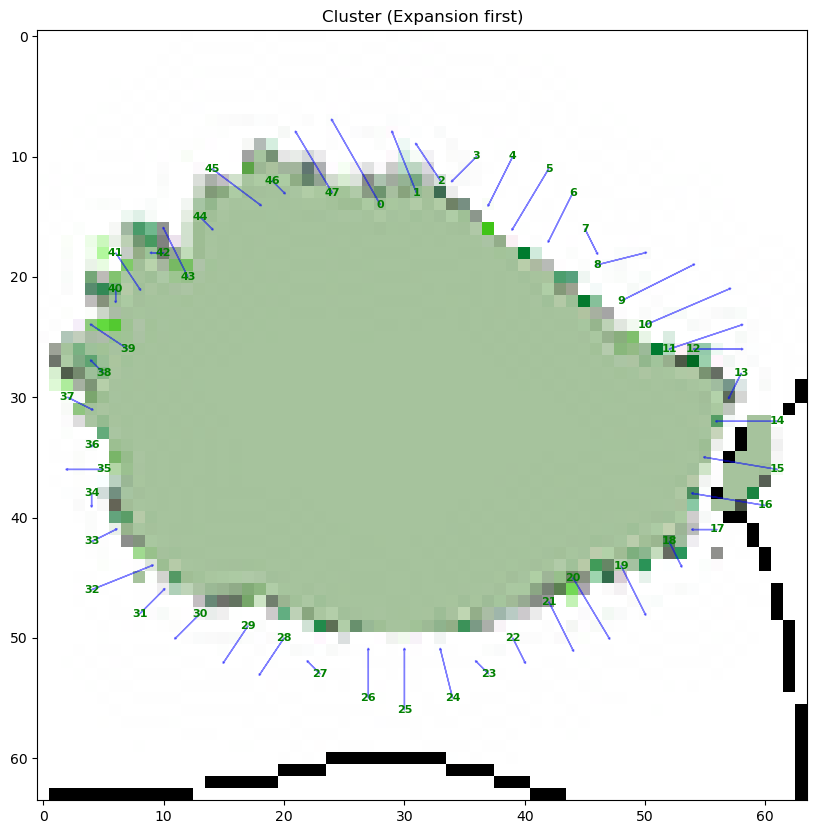

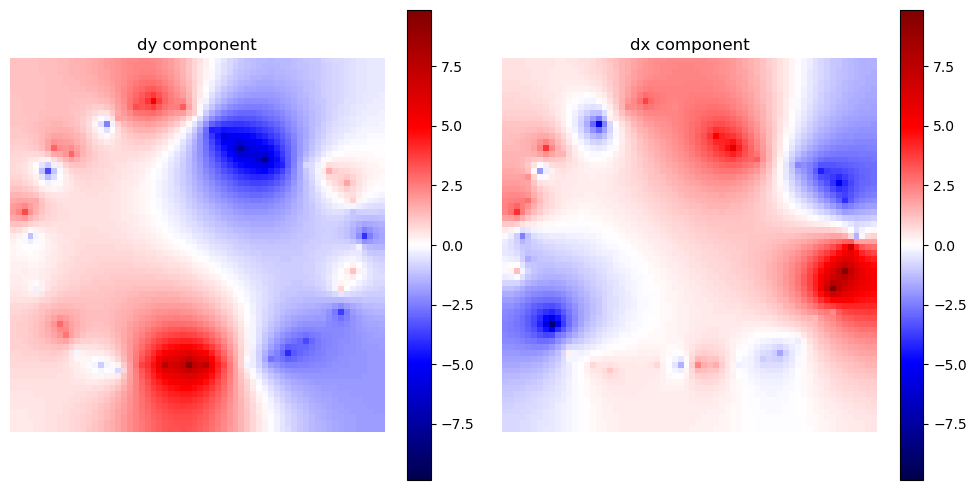

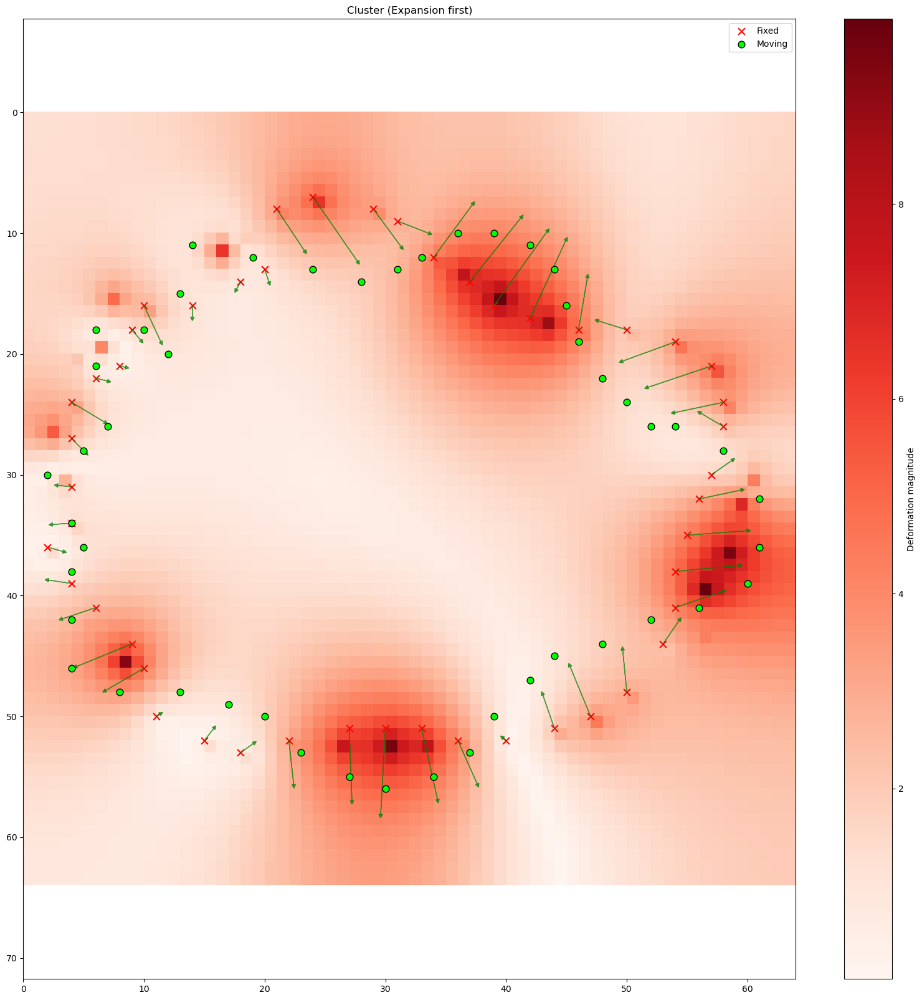






CONTRACTION FIRST


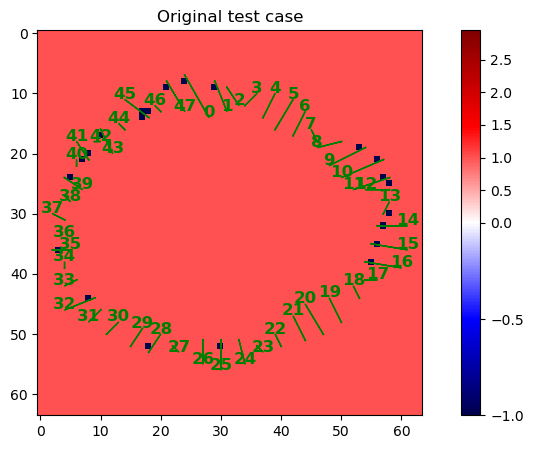


--- Iteration 1: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


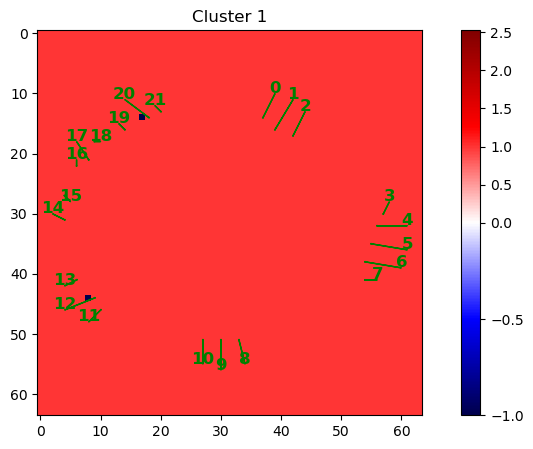

New coordinate for point 0:
	moving:	[ 0 14 28] -> [ 0 16 28]
	fixed:	[ 0  7 24] -> [ 0  9 24]
New coordinate for point 1:
	moving:	[ 0 13 31] -> [ 0 15 31]
	fixed:	[ 0  8 29] -> [ 0 10 29]
New coordinate for point 2:
	moving:	[ 0 12 33] -> [ 0 14 32]
	fixed:	[ 0  9 31] -> [ 0 11 31]
New coordinate for point 3:
	moving:	[ 0 10 36] -> [ 0 13 35]
	fixed:	[ 0 12 34] -> [ 0 15 33]
New coordinate for point 7:
	moving:	[ 0 16 45] -> [ 0 19 43]
	fixed:	[ 0 18 46] -> [ 0 20 44]
New coordinate for point 8:
	moving:	[ 0 19 46] -> [ 0 21 44]
	fixed:	[ 0 18 50] -> [ 0 20 48]
New coordinate for point 9:
	moving:	[ 0 22 48] -> [ 0 24 46]
	fixed:	[ 0 19 54] -> [ 0 21 52]
New coordinate for point 10:
	moving:	[ 0 24 50] -> [ 0 25 48]
	fixed:	[ 0 21 57] -> [ 0 23 55]
New coordinate for point 11:
	moving:	[ 0 26 52] -> [ 0 27 50]
	fixed:	[ 0 24 58] -> [ 0 25 56]
New coordinate for point 12:
	moving:	[ 0 26 54] -> [ 0 27 52]
	fixed:	[ 0 26 58] -> [ 0 27 56]
New coordinate for point 18:
	moving:	[ 0 42 52

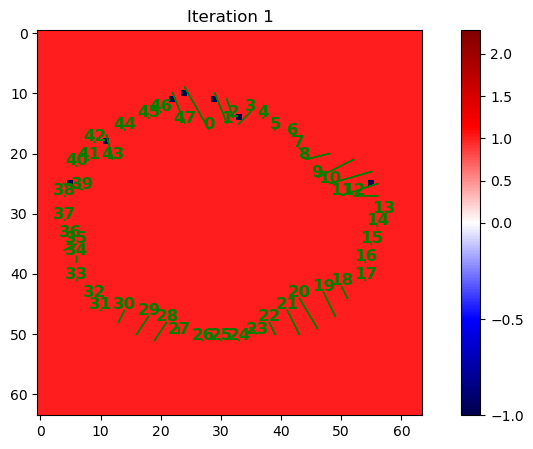


--- Iteration 2: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


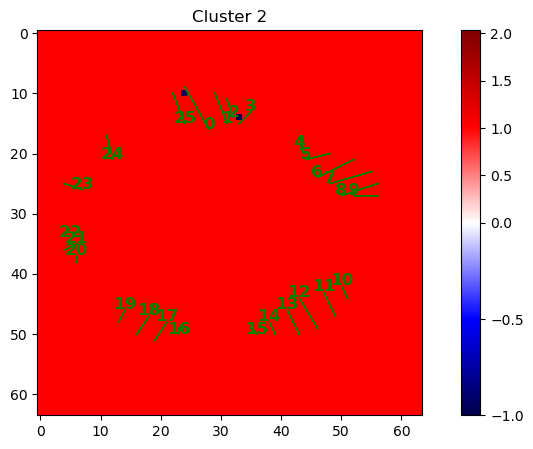

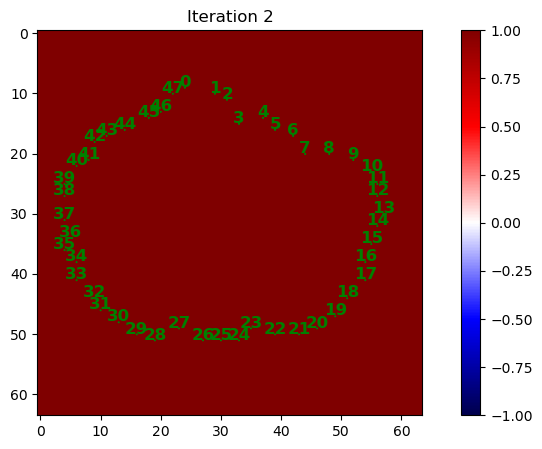


L2 error of combined DVF: 117.5699


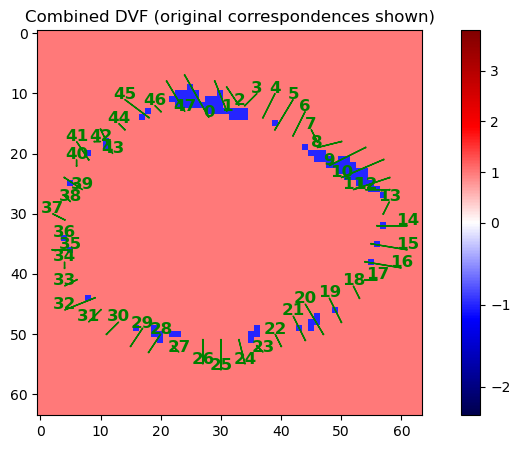

fdata.shape (1, 64, 64)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1447551].


Time taken to create A:  0.06650662422180176
Error: X=26.33, Y=32.49, Z=0.00, Total=42.22
Number of negative Jdet values: 91


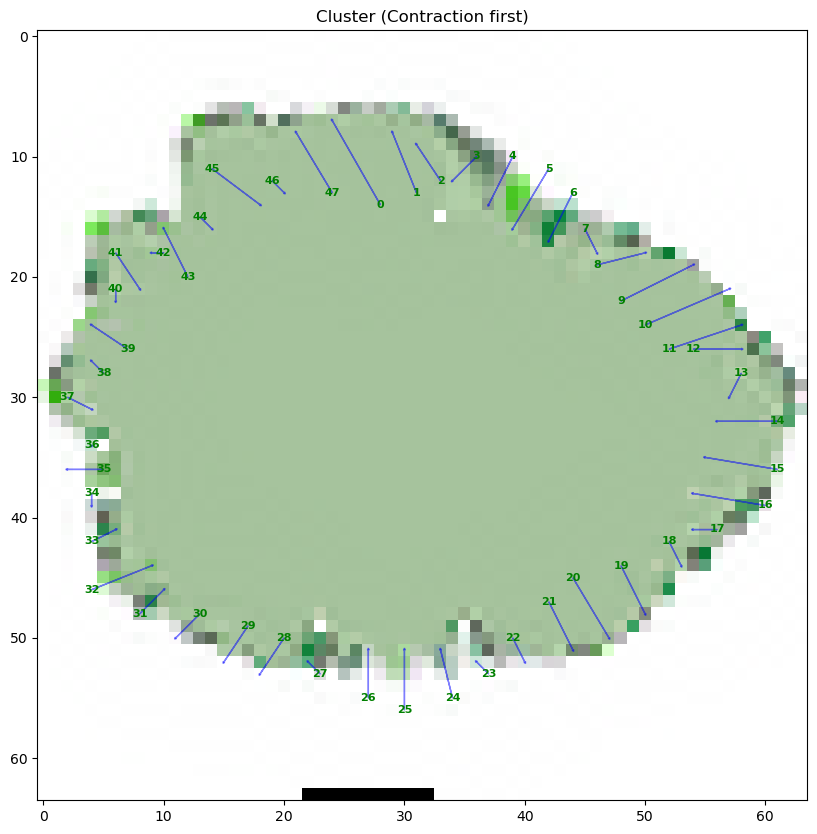

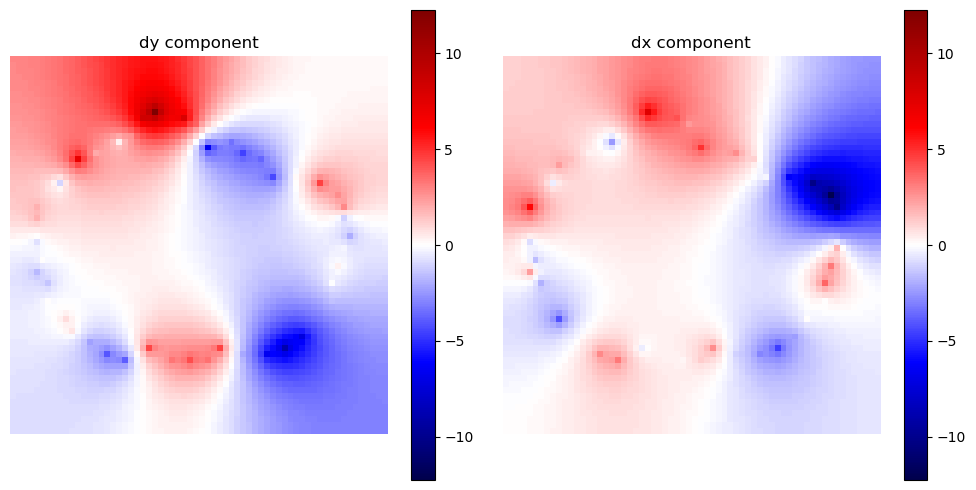

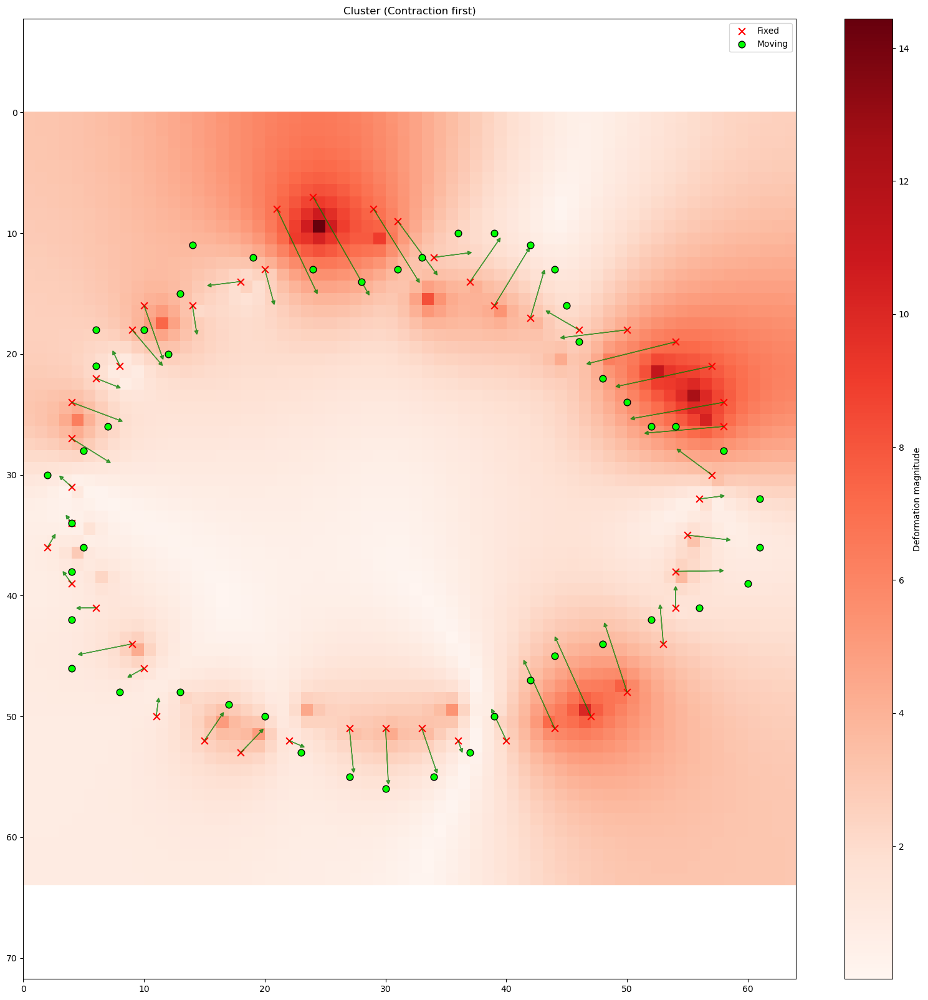

In [72]:
# Expansion first
print("EXPANSION FIRST")
d = cluster_iteration(mpoints, fpoints, [expansion_indices, contraction_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Expansion first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Expansion first)", show_grid=False)

print("\n\n\n\n")
print("CONTRACTION FIRST")

# Contraction first
d = cluster_iteration(mpoints, fpoints, [contraction_indices, expansion_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Contraction first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Contraction first)", show_grid=False)

#### Scale down 0.1 (extra points)

In [73]:
resolution = (256, 256)  # Original resolution
scale = 0.1  # Scale factor for the image (try 0.11)
correspondences_path = 'correspondences_extra.csv'  # Path to the CSV file with correspondences

# Indices
expansion_indices = [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47]  # Indices that expand the image outwards
contraction_indices = [idx for idx in range(0, 48) if idx not in expansion_indices]  # Indices that shrink the image inwards

Moving and fixed images:


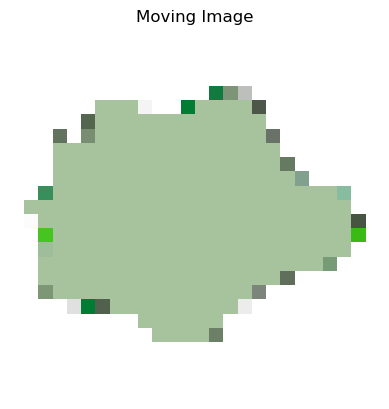

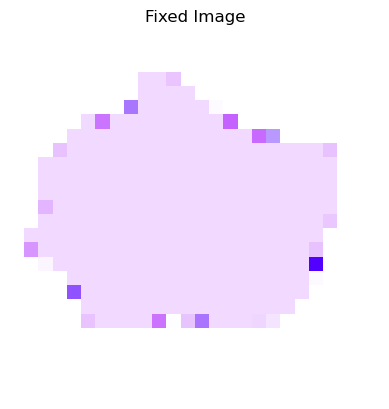

Laplacian tests:


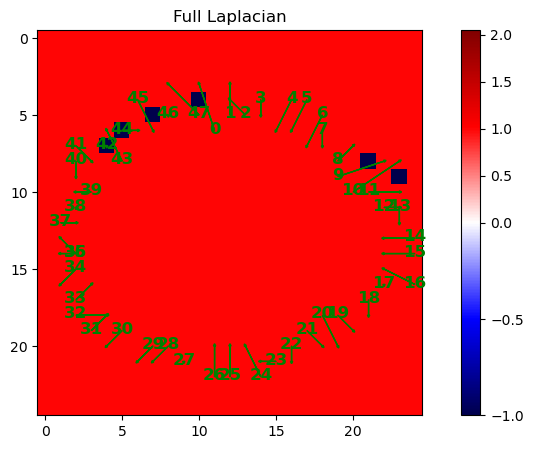

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [3.7162914e-05..1.1639473].


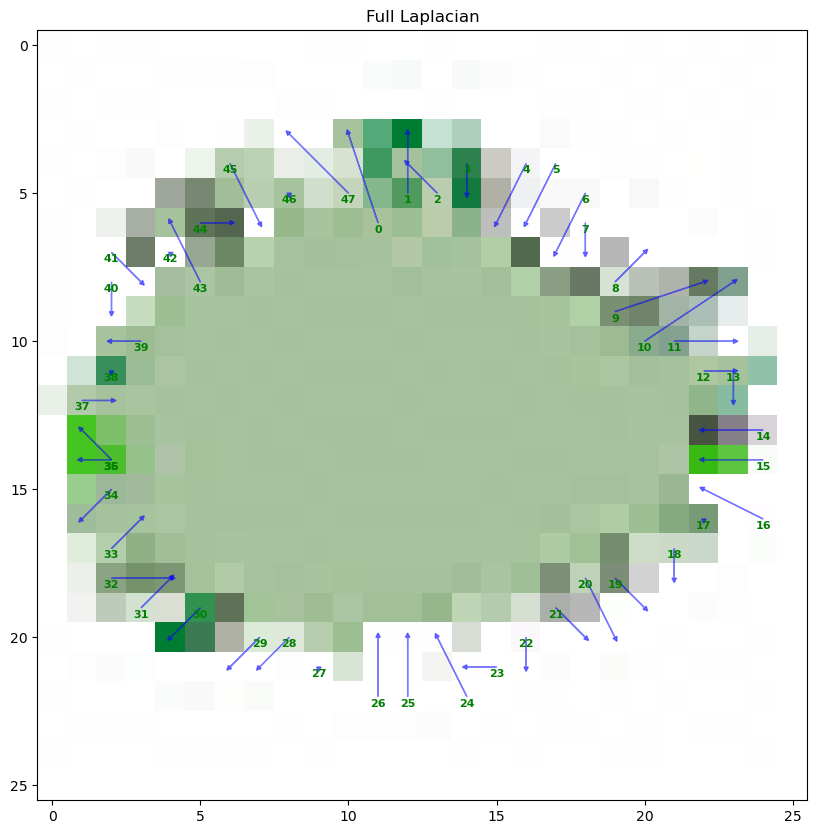

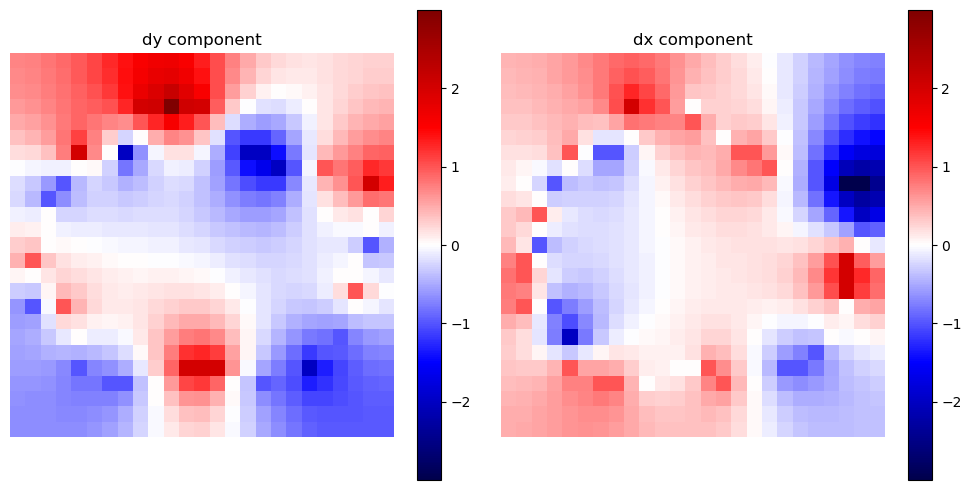

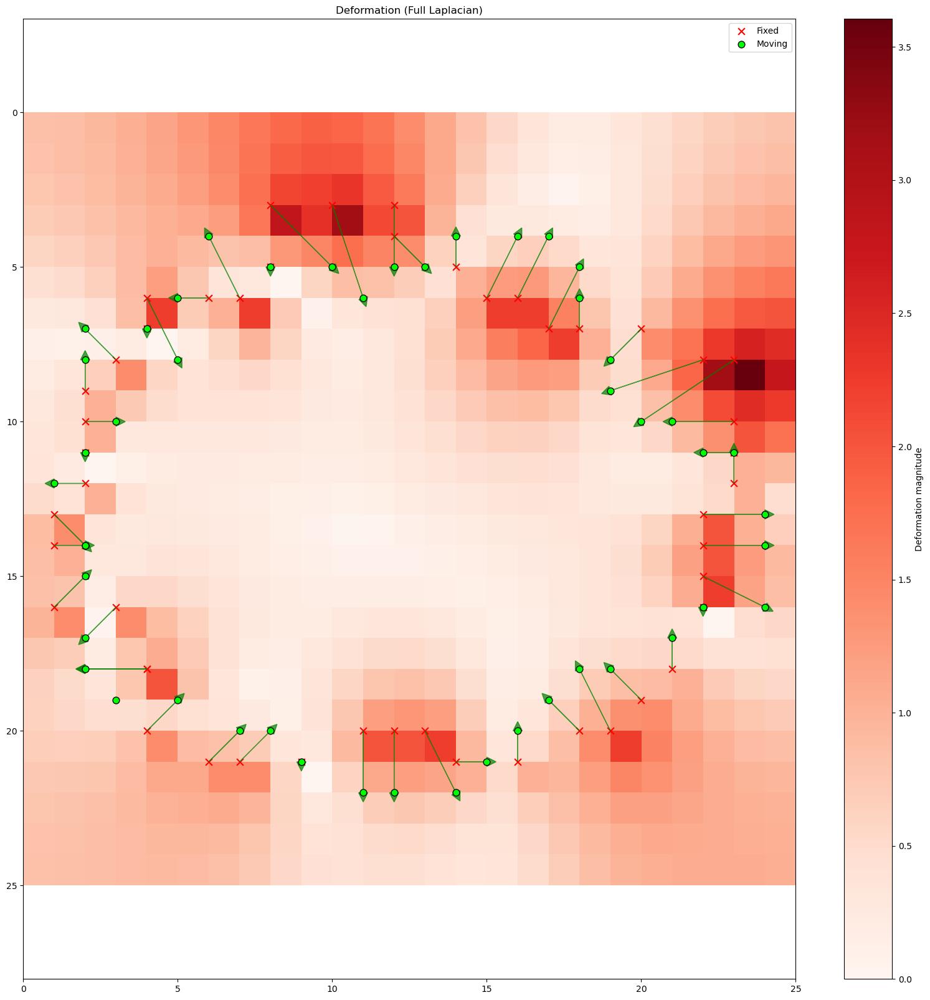

Min Jdet value: -0.4758, Max Jdet value: 2.0464
Number of negative Jdet values: 6
fdata.shape (1, 25, 25)
Time taken to create A:  0.06250762939453125
Error: X=0.07, Y=0.08, Z=0.00, Total=0.10


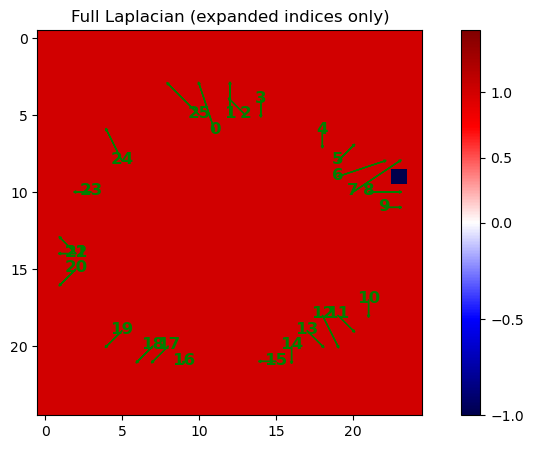

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [3.341025e-05..1.1680869].


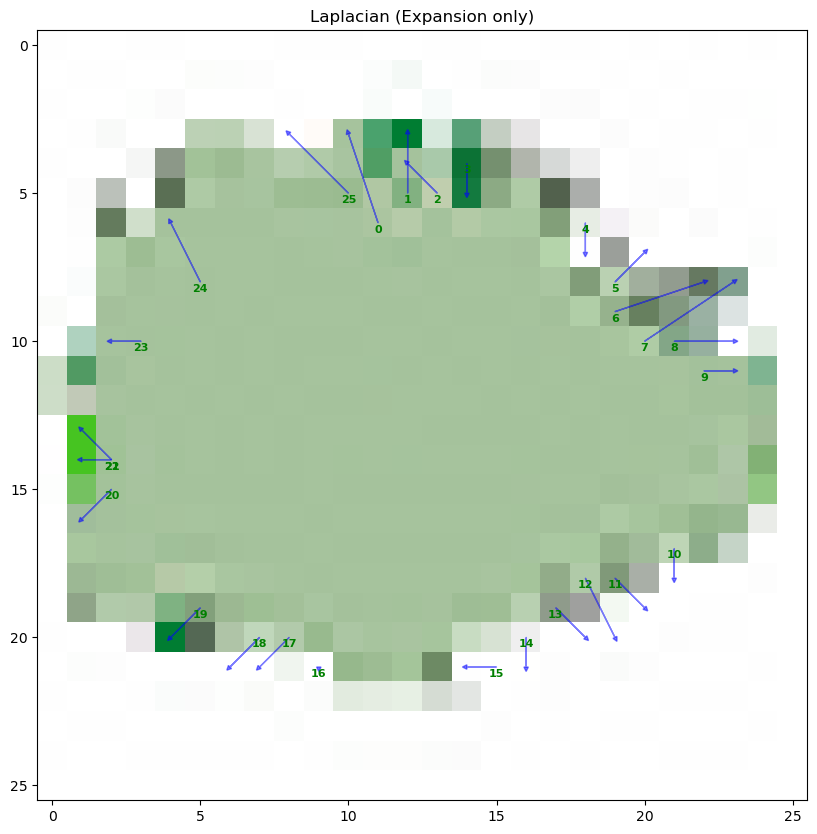

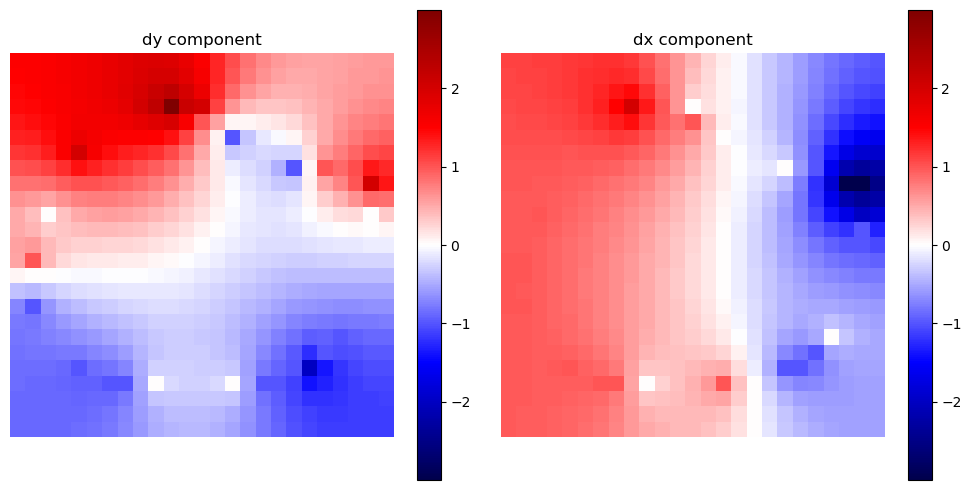

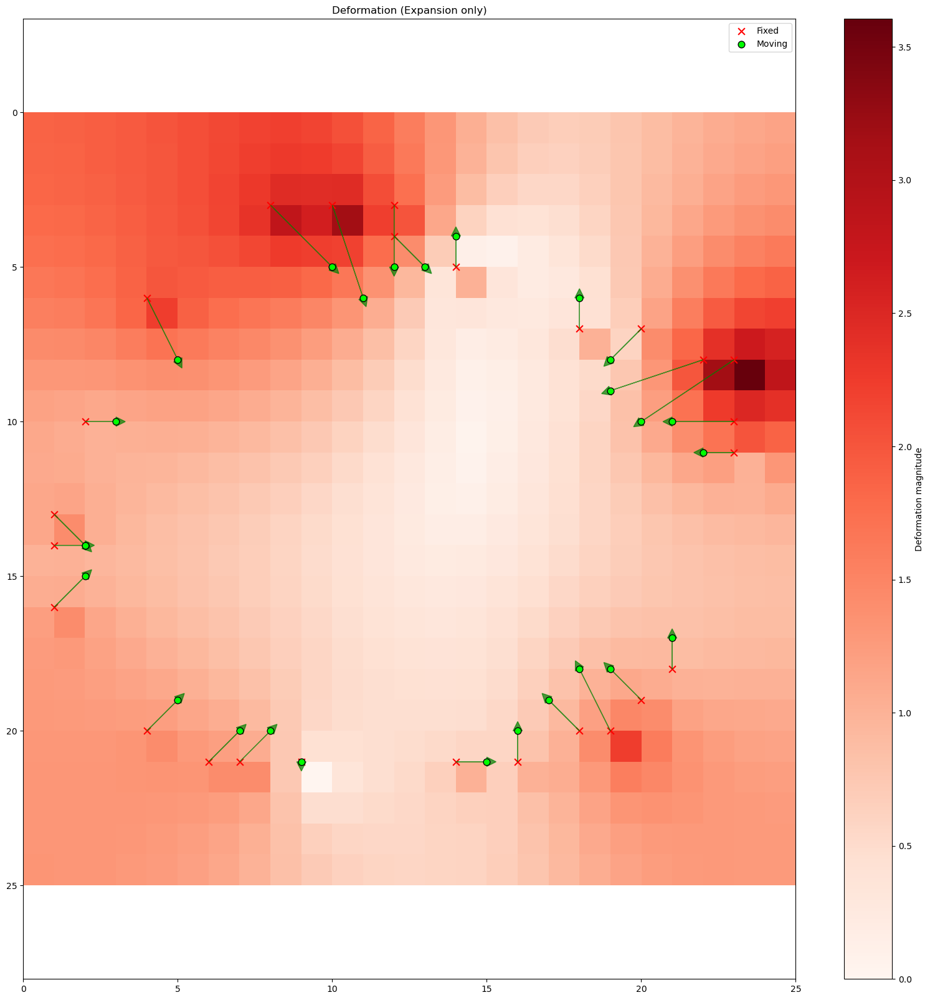

Min Jdet value: -0.0531, Max Jdet value: 1.4750
Number of negative Jdet values: 1
fdata.shape (1, 25, 25)
Time taken to create A:  0.0620119571685791
Error: X=7.75, Y=7.36, Z=0.00, Total=11.90


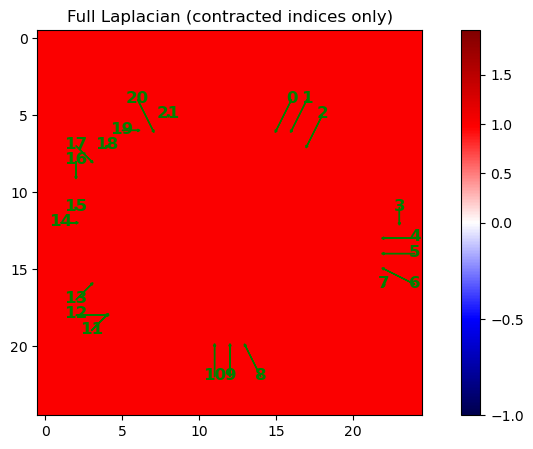

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06993921..1.1117969].


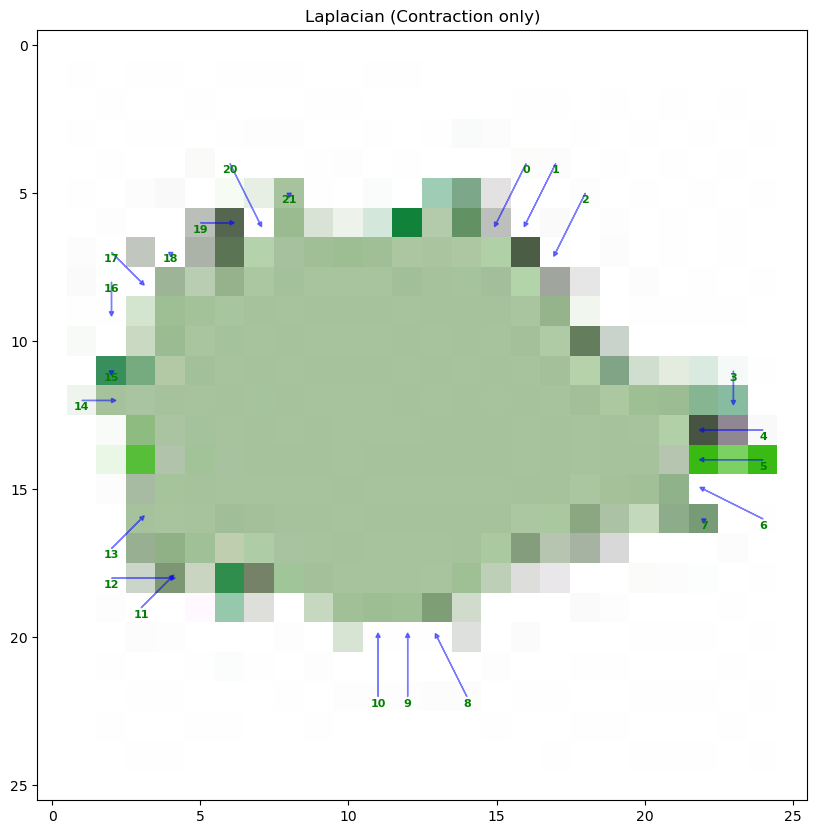

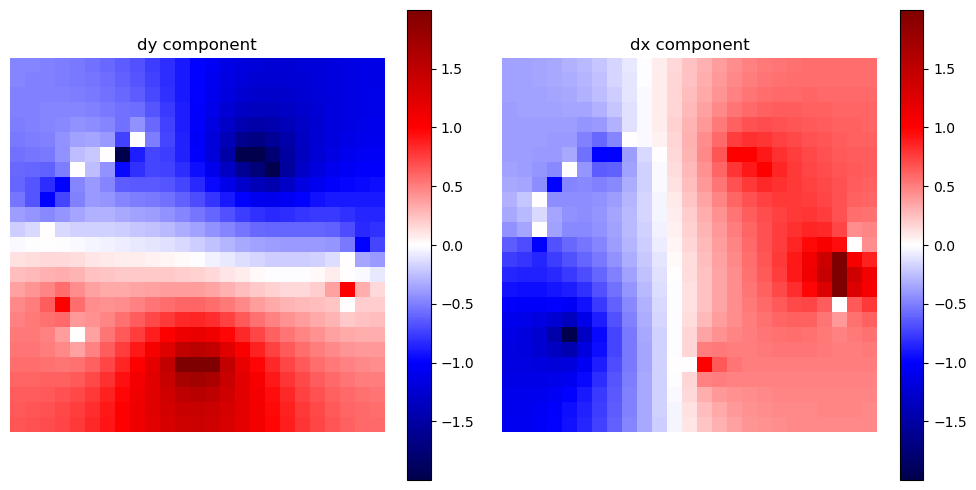

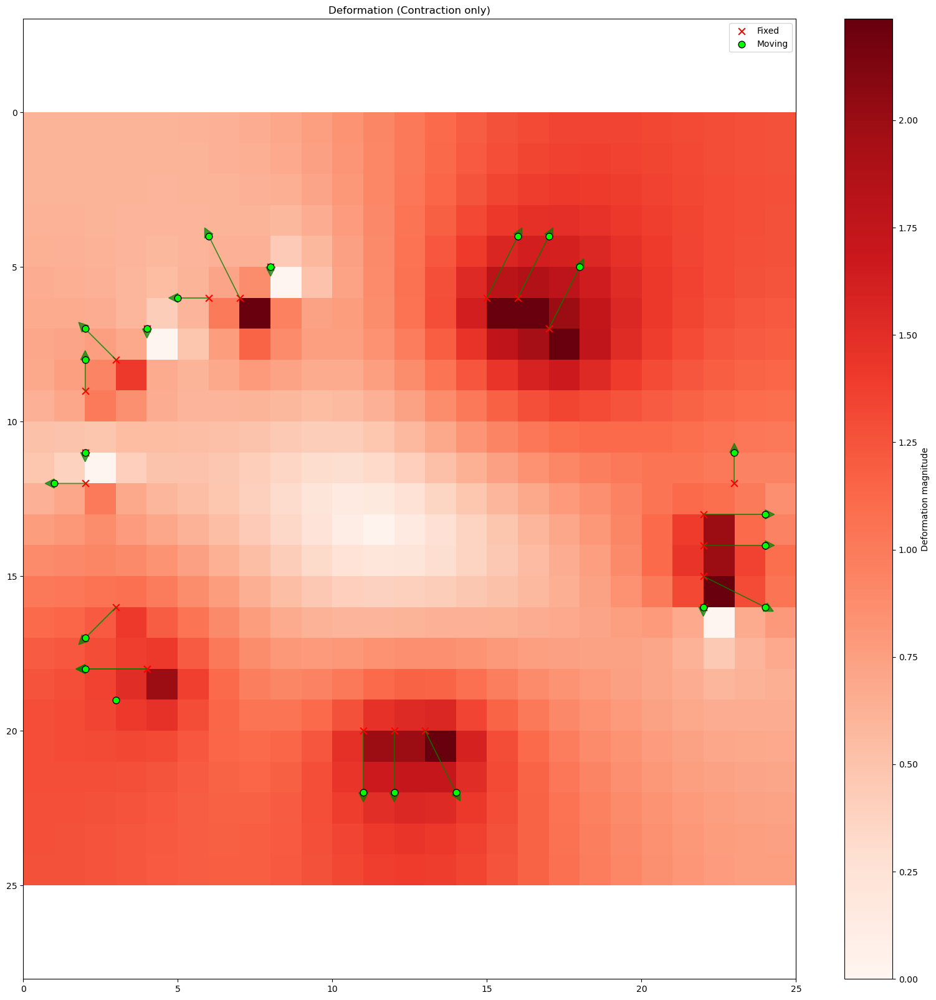

Min Jdet value: 0.4238, Max Jdet value: 1.9484
Number of negative Jdet values: 0
fdata.shape (1, 25, 25)
Time taken to create A:  0.06209206581115723
Error: X=8.83, Y=9.63, Z=0.00, Total=11.86


In [74]:
# Load the correspondences from the CSV file
mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)
scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))

# Load and show the images
moving_image = load_png('moving_image_extra.png', scale=scale)
fixed_image = load_png('fixed_image_extra.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Deformation (Full Laplacian)", show_grid=False)
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with expansion indices only
d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
plot_dxdy(d_expand)
plot_2d_deformation_grid_v2(d_expand, mpoints[expansion_indices], fpoints[expansion_indices], title="Deformation (Expansion only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_expand.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_expand.resolution, mpoints, fpoints, d_expand.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

# Run with contraction indices only
d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
plot_dxdy(d_contract)
plot_2d_deformation_grid_v2(d_contract, mpoints[contraction_indices], fpoints[contraction_indices], title="Deformation (Contraction only)", show_grid=False)
print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d_contract.count_negatives()}")
err_x, err_y, err_z, total_err = compute_error(d_contract.resolution, mpoints, fpoints, d_contract.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

##### Clusters

EXPANSION FIRST


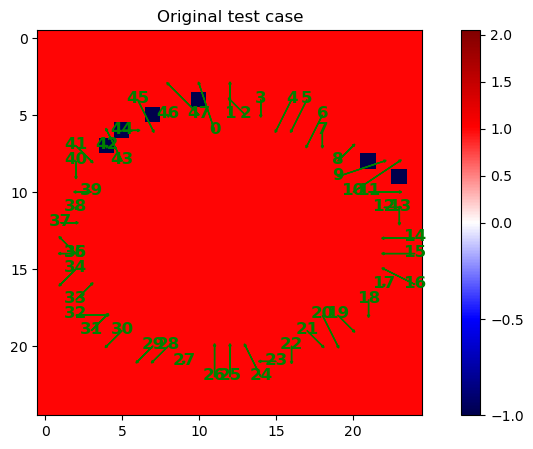


--- Iteration 1: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


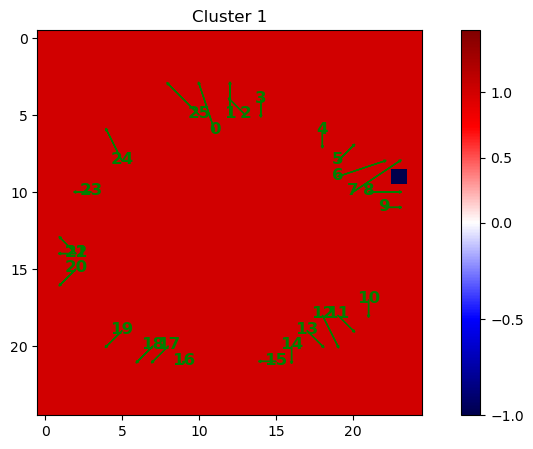

New coordinate for point 4:
	moving:	[ 0  4 16] -> [ 0  4 16]
	fixed:	[ 0  6 15] -> [ 0  6 15]
New coordinate for point 5:
	moving:	[ 0  4 17] -> [ 0  4 17]
	fixed:	[ 0  6 16] -> [ 0  6 16]
New coordinate for point 6:
	moving:	[ 0  5 18] -> [ 0  5 18]
	fixed:	[ 0  7 17] -> [ 0  7 17]
New coordinate for point 13:
	moving:	[ 0 11 23] -> [ 0 11 24]
	fixed:	[ 0 12 23] -> [ 0 12 24]
New coordinate for point 14:
	moving:	[ 0 13 24] -> [ 0 13 25]
	fixed:	[ 0 13 22] -> [ 0 13 23]
New coordinate for point 15:
	moving:	[ 0 14 24] -> [ 0 14 25]
	fixed:	[ 0 14 22] -> [ 0 14 23]
New coordinate for point 16:
	moving:	[ 0 16 24] -> [ 0 17 25]
	fixed:	[ 0 15 22] -> [ 0 15 23]
New coordinate for point 17:
	moving:	[ 0 16 22] -> [ 0 17 23]
	fixed:	[ 0 16 22] -> [ 0 17 23]
New coordinate for point 24:
	moving:	[ 0 22 14] -> [ 0 22 14]
	fixed:	[ 0 20 13] -> [ 0 20 13]
New coordinate for point 25:
	moving:	[ 0 22 12] -> [ 0 22 12]
	fixed:	[ 0 20 12] -> [ 0 20 12]
New coordinate for point 26:
	moving:	[ 0 2

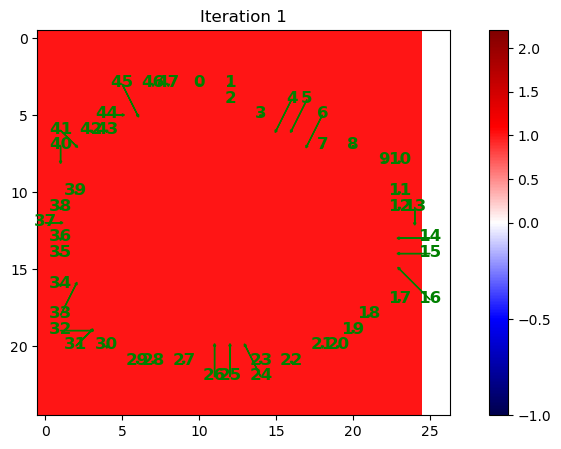


--- Iteration 2: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


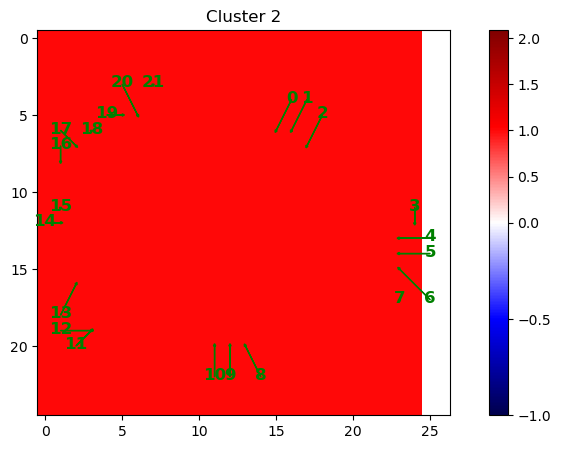

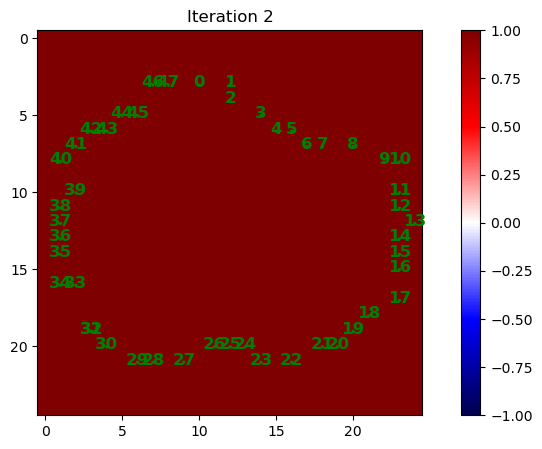


L2 error of combined DVF: 25.7565


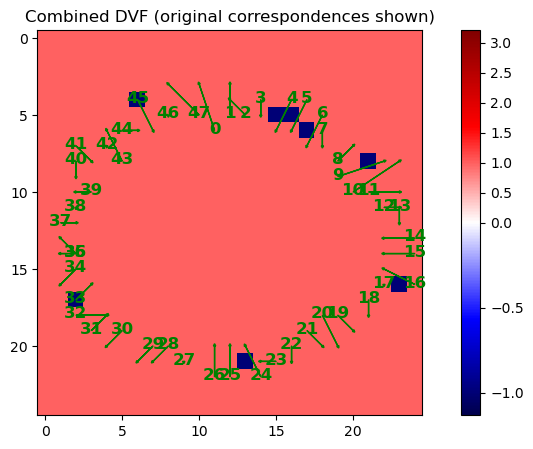

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.044386145..1.0937505].


fdata.shape (1, 25, 25)
Time taken to create A:  0.053009033203125
Error: X=15.37, Y=21.64, Z=0.00, Total=30.31
Number of negative Jdet values: 8


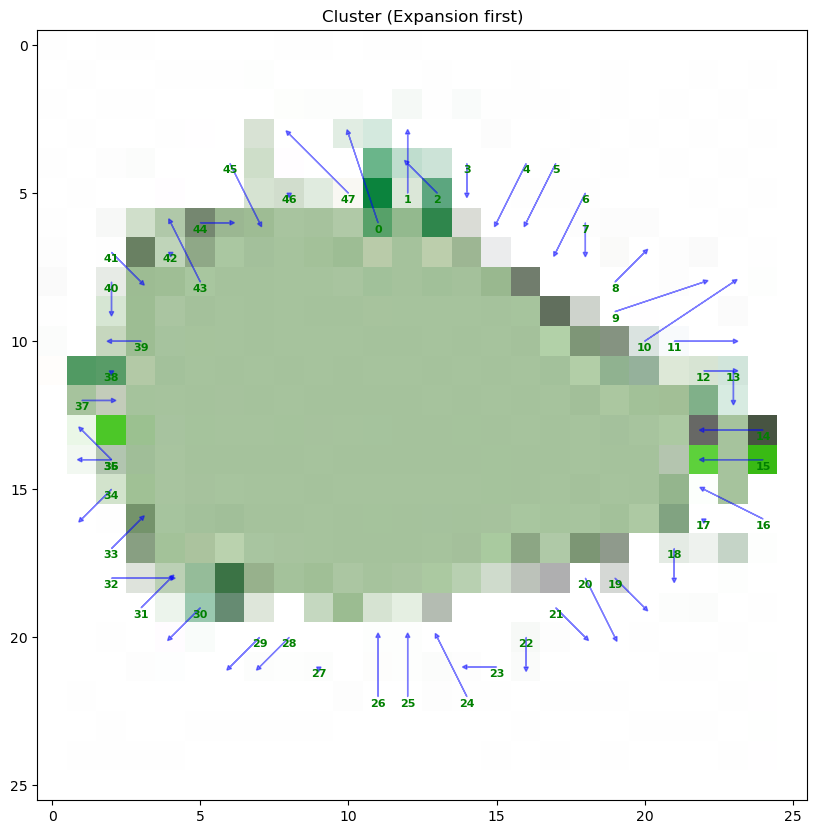

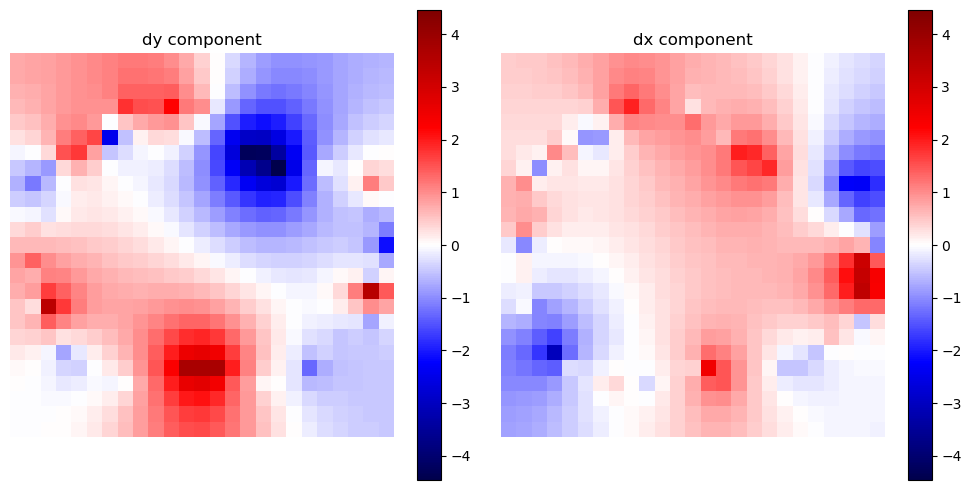

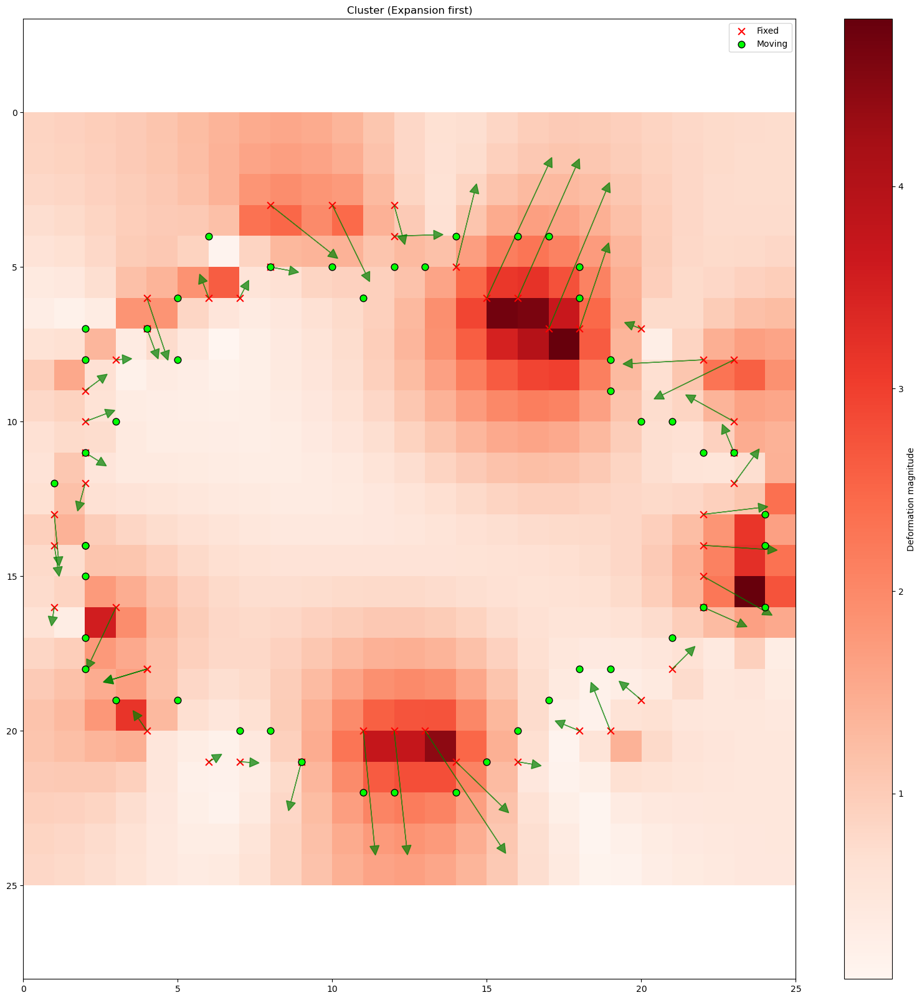






CONTRACTION FIRST


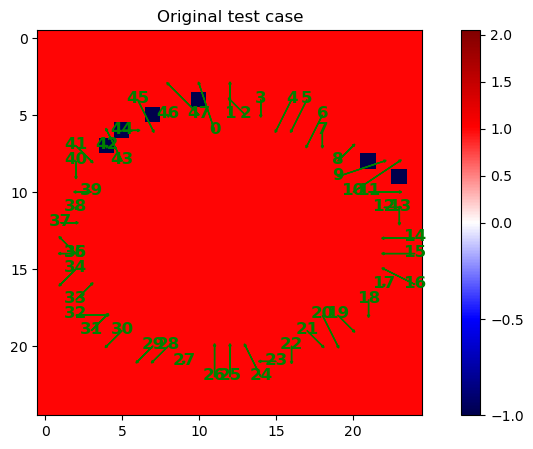


--- Iteration 1: Fixing cluster [4, 5, 6, 13, 14, 15, 16, 17, 24, 25, 26, 31, 32, 33, 37, 38, 40, 41, 42, 44, 45, 46] ---


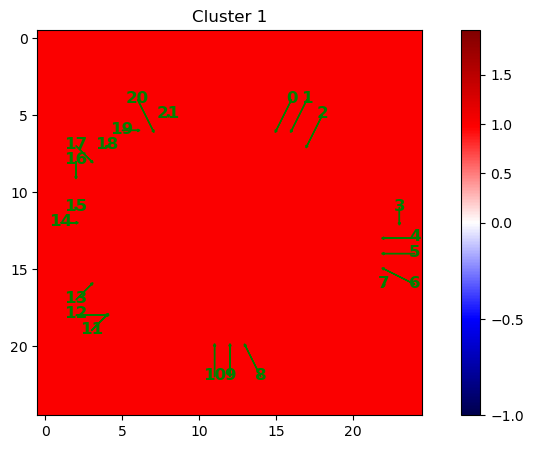

New coordinate for point 0:
	moving:	[ 0  6 11] -> [ 0  7 11]
	fixed:	[ 0  3 10] -> [ 0  4 10]
New coordinate for point 1:
	moving:	[ 0  5 12] -> [ 0  6 12]
	fixed:	[ 0  3 12] -> [ 0  4 12]
New coordinate for point 2:
	moving:	[ 0  5 13] -> [ 0  6 13]
	fixed:	[ 0  4 12] -> [ 0  5 12]
New coordinate for point 3:
	moving:	[ 0  4 14] -> [ 0  5 13]
	fixed:	[ 0  5 14] -> [ 0  6 14]
New coordinate for point 7:
	moving:	[ 0  6 18] -> [ 0  8 17]
	fixed:	[ 0  7 18] -> [ 0  8 17]
New coordinate for point 8:
	moving:	[ 0  8 19] -> [ 0  9 18]
	fixed:	[ 0  7 20] -> [ 0  8 19]
New coordinate for point 9:
	moving:	[ 0  9 19] -> [ 0 10 18]
	fixed:	[ 0  8 22] -> [ 0  9 21]
New coordinate for point 10:
	moving:	[ 0 10 20] -> [ 0 11 20]
	fixed:	[ 0  8 23] -> [ 0  9 23]
New coordinate for point 11:
	moving:	[ 0 10 21] -> [ 0 11 21]
	fixed:	[ 0 10 23] -> [ 0 11 23]
New coordinate for point 12:
	moving:	[ 0 11 22] -> [ 0 12 22]
	fixed:	[ 0 11 23] -> [ 0 12 23]
New coordinate for point 18:
	moving:	[ 0 17 21

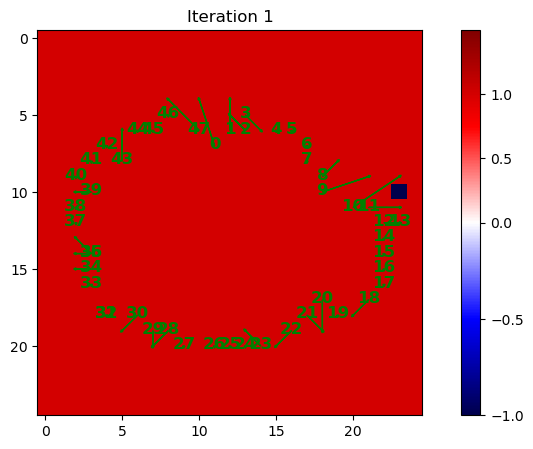


--- Iteration 2: Fixing cluster [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 18, 19, 20, 21, 22, 23, 27, 28, 29, 30, 34, 35, 36, 39, 43, 47] ---


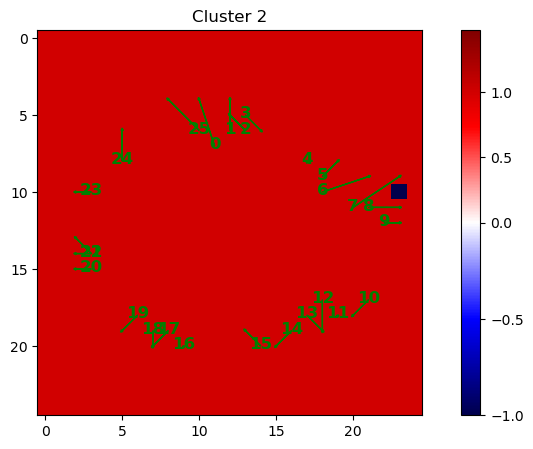

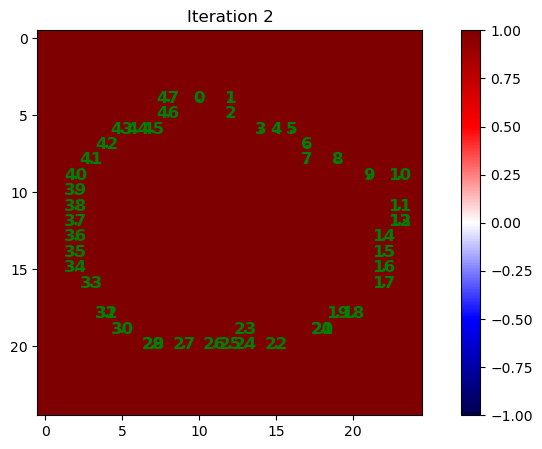


L2 error of combined DVF: 26.6164


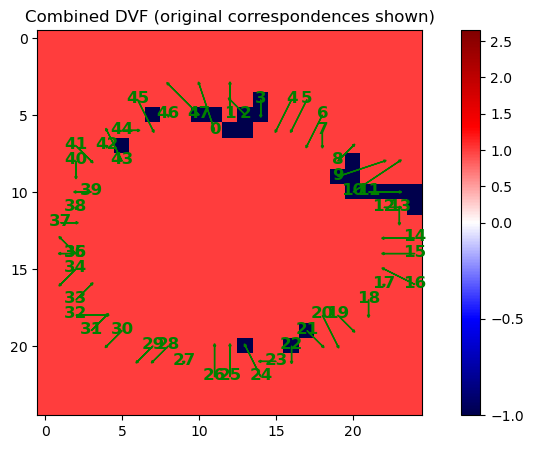

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0040642545..1.1264675].


fdata.shape (1, 25, 25)
Time taken to create A:  0.056513309478759766
Error: X=19.15, Y=20.18, Z=0.00, Total=28.88
Number of negative Jdet values: 21


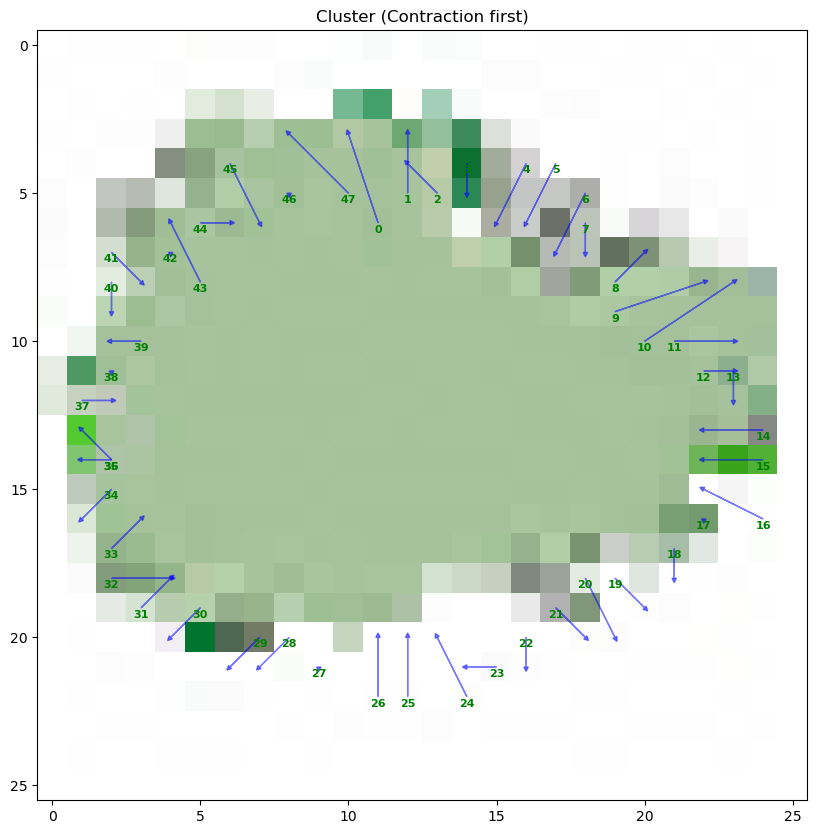

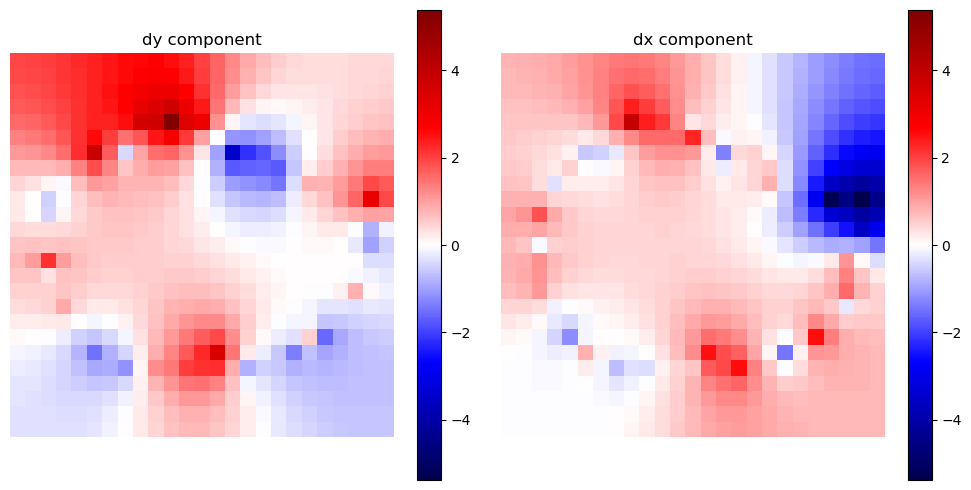

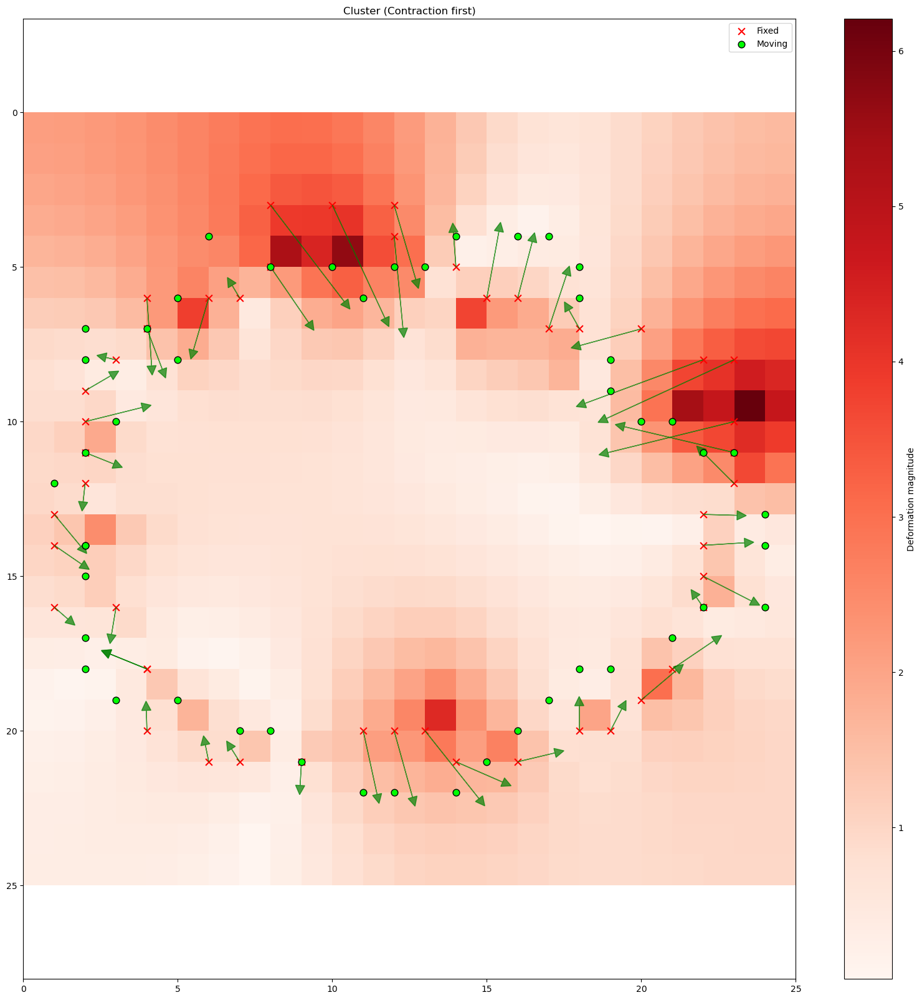

In [75]:
# Expansion first
print("EXPANSION FIRST")
d = cluster_iteration(mpoints, fpoints, [expansion_indices, contraction_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Expansion first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Expansion first)", show_grid=False)

print("\n\n\n\n")
print("CONTRACTION FIRST")

# Contraction first
d = cluster_iteration(mpoints, fpoints, [contraction_indices, expansion_indices], scaled_resolution, fontsize=0, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")
apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Cluster (Contraction first)")
plot_dxdy(d)
plot_2d_deformation_grid_v2(d, mpoints, fpoints, title="Cluster (Contraction first)", show_grid=False)

#### Move up some points

In [ ]:
# Load the correspondences from the CSV file
mpoints = np.array([
    [0, 20, 5],
    [0, 20, 10],
])
fpoints = np.array([
    [0, 10, 5],
    [0, 10, 10],
])
scale = 0.5
#mpoints, fpoints = load_csv_data(correspondences_path, scale=scale)

scaled_resolution = (int(resolution[0] * scale), int(resolution[1] * scale))
#scaled_resolution = (24, 24)

# Load and show the images
moving_image = load_png('moving_image_extra.png', scale=scale)
fixed_image = load_png('fixed_image_extra.png', scale=scale)
print("Moving and fixed images:")
show_png(moving_image, title="Moving Image")
show_png(fixed_image, title="Fixed Image")

#################################################################################
# Run Laplacian tests
#################################################################################
print("Laplacian tests:")

# Original test case
d = Data(mpoints, fpoints, scaled_resolution)
d.show("Full Laplacian", fontsize=0)

pprint(d.deformation[1:, 0, :, :])
plt.figure(figsize=(10, 5))
plt.imshow(d.deformation[1, 0, :, :], cmap='seismic')
plt.colorbar()
plt.title("Deformation field (dy)")
plt.show()

apply_transformation(d, moving_image, fixed_image, mpoints, fpoints, title="Full Laplacian")
print(f"Min Jdet value: {np.min(d.jdet_field):.4f}, Max Jdet value: {np.max(d.jdet_field):.4f}")
print(f"Number of negative Jdet values: {d.count_negatives()}")

# Run with expansion indices only
#d_expand = Data(mpoints[expansion_indices], fpoints[expansion_indices], scaled_resolution)
#d_expand.show("Full Laplacian (expanded indices only)", fontsize=0)
#apply_transformation(d_expand, moving_image, fixed_image, mpoints[expansion_indices], fpoints[expansion_indices], title="Laplacian (Expansion only)")
#print(f"Min Jdet value: {np.min(d_expand.jdet_field):.4f}, Max Jdet value: {np.max(d_expand.jdet_field):.4f}")
#print(f"Number of negative Jdet values: {d_expand.count_negatives()}")

# Run with contraction indices only
#d_contract = Data(mpoints[contraction_indices], fpoints[contraction_indices], scaled_resolution)
#d_contract.show("Full Laplacian (contracted indices only)", fontsize=0)
#apply_transformation(d_contract, moving_image, fixed_image, mpoints[contraction_indices], fpoints[contraction_indices], title="Laplacian (Contraction only)")
#print(f"Min Jdet value: {np.min(d_contract.jdet_field):.4f}, Max Jdet value: {np.max(d_contract.jdet_field):.4f}")
#print(f"Number of negative Jdet values: {d_contract.count_negatives()}")

#### Grid analysis

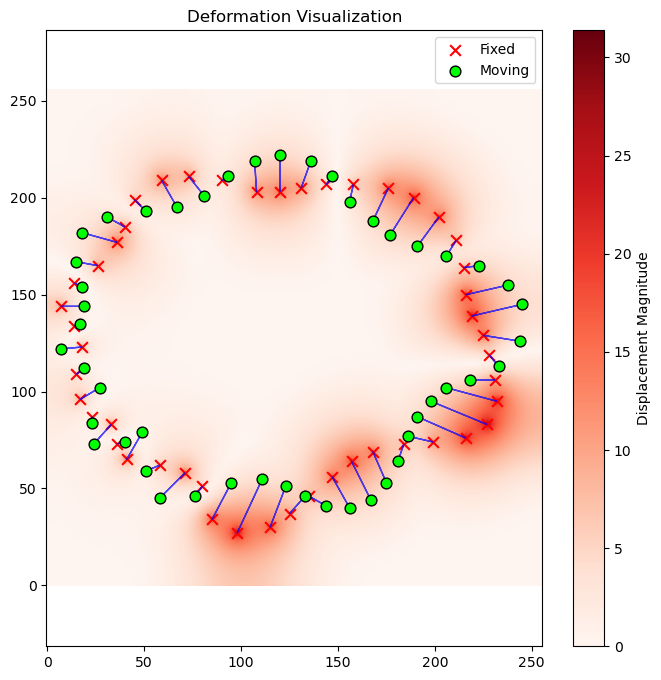

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def plot_2d_deformation_grid_v2(deformation, moving_points=None, fixed_points=None, title=None, show_arrows=True, show_points=True, figsize=(8,8)):
    """
    Visualize a 2D deformation grid (deformation shape: 3,1,H,W, order Z,y,x), overlaying moving, fixed, and deformed fixed points.
    Args:
        deformation: np.ndarray, shape (3, 1, H, W), order (Z, y, x)
        moving_points: np.ndarray, shape (N, 2) or (N, 3)
        fixed_points: np.ndarray, shape (N, 2) or (N, 3)
        title: str
        show_arrows: bool
        show_points: bool
        figsize: tuple
    """
    # Extract y and x displacements
    dy = deformation[1, 0, :, :]
    dx = deformation[2, 0, :, :]
    H, W = dy.shape
    Y, X = np.mgrid[0:H, 0:W]
    plt.figure(figsize=figsize)
    plt.imshow(np.hypot(dx, dy), cmap='Reds', alpha=1)
    plt.colorbar(label='Displacement Magnitude')
    # Overlay fixed points and their deformed positions
    if fixed_points is not None:
        fixed_points = np.asarray(fixed_points)
        if fixed_points.shape[1] == 3:
            y_fp, x_fp = fixed_points[:,1], fixed_points[:,2]
        else:
            y_fp, x_fp = fixed_points[:,0], fixed_points[:,1]
        plt.scatter(x_fp, y_fp, c='red', marker='x', label='Fixed', s=60)
        # Compute new positions after deformation
        y_fp_int = np.round(y_fp).astype(int)
        x_fp_int = np.round(x_fp).astype(int)
        y_fp_int = np.clip(y_fp_int, 0, H-1)
        x_fp_int = np.clip(x_fp_int, 0, W-1)
        new_y = y_fp + dy[y_fp_int, x_fp_int]
        new_x = x_fp + dx[y_fp_int, x_fp_int]
        #plt.scatter(new_x, new_y, c='magenta', marker='s', label='Deformed Fixed', edgecolor='k', s=80)
        # Optionally, draw arrows from original to deformed fixed points
        if show_arrows:
            for x0, y0, x1, y1 in zip(x_fp, y_fp, new_x, new_y):
                plt.arrow(x0, y0, x1-x0, y1-y0, color='blue', head_width=0.3, head_length=0.3, alpha=0.7)
    # Optionally, overlay moving points as reference
    if moving_points is not None:
        moving_points = np.asarray(moving_points)
        if moving_points.shape[1] == 3:
            y_mp, x_mp = moving_points[:,1], moving_points[:,2]
        else:
            y_mp, x_mp = moving_points[:,0], moving_points[:,1]
        plt.scatter(x_mp, y_mp, c='lime', marker='o', label='Moving', edgecolor='k', s=60)
    if title:
        plt.title(title)
    plt.legend()
    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.show()
    
plot_2d_deformation_grid_v2(d.deformation, moving_points=mpoints, fixed_points=fpoints, title="Deformation Visualization")

### Iterations

In [ ]:
# Example usage for your test case
resolution = (28, 28)
fontsize = 0
clusters = [[0, 2], [2, 3], [4, 5]]
cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)

## END

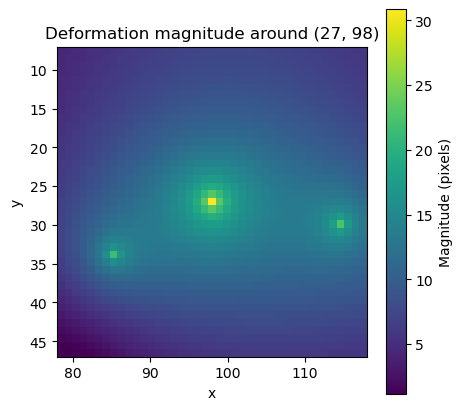

<Axes: title={'center': 'Deformation magnitude around (27, 98)'}, xlabel='x', ylabel='y'>

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def plot_deformation_magnitude_window(deformation, center, window_size=20, ax=None, show=True):
    """
    Plots the deformation magnitude in a square window around a given (y, x) center.
    deformation: (3, 1, H, W), order (Z, y, x)
    center: (y, x) tuple, center of the window
    window_size: int, half-width of the window (total size = 2*window_size+1)
    ax: matplotlib axis (optional)
    show: whether to call plt.show()
    """
    H, W = deformation.shape[2:]
    y0, x0 = center
    y1 = max(0, y0 - window_size)
    y2 = min(H, y0 + window_size + 1)
    x1 = max(0, x0 - window_size)
    x2 = min(W, x0 + window_size + 1)
    # Only y and x displacements
    dy = deformation[1, 0, y1:y2, x1:x2]
    dx = deformation[2, 0, y1:y2, x1:x2]
    mag = np.sqrt(dx**2 + dy**2)
    if ax is None:
        fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(mag, cmap='viridis', origin='upper', extent=[x1, x2-1, y2-1, y1])
    ax.set_title(f'Deformation magnitude around ({y0}, {x0})')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.colorbar(im, ax=ax, label='Magnitude (pixels)')
    if show:
        plt.show()
    return ax

# Example usage:
plot_deformation_magnitude_window(d.deformation, center=(27, 98), window_size=20)

d:\anaconda3\envs\tissuecyte\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


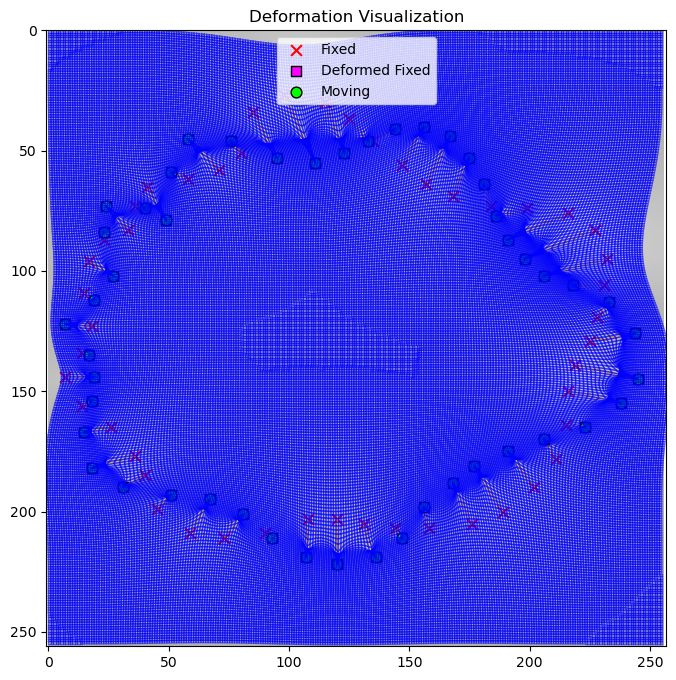

In [17]:
plot_2d_deformation_grid_v2(d.deformation, moving_points=mpoints, fixed_points=fpoints, title="Deformation Visualization", grid_spacing=1)
                            #xy_window=[45, 65, 100, 125])

d:\anaconda3\envs\tissuecyte\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


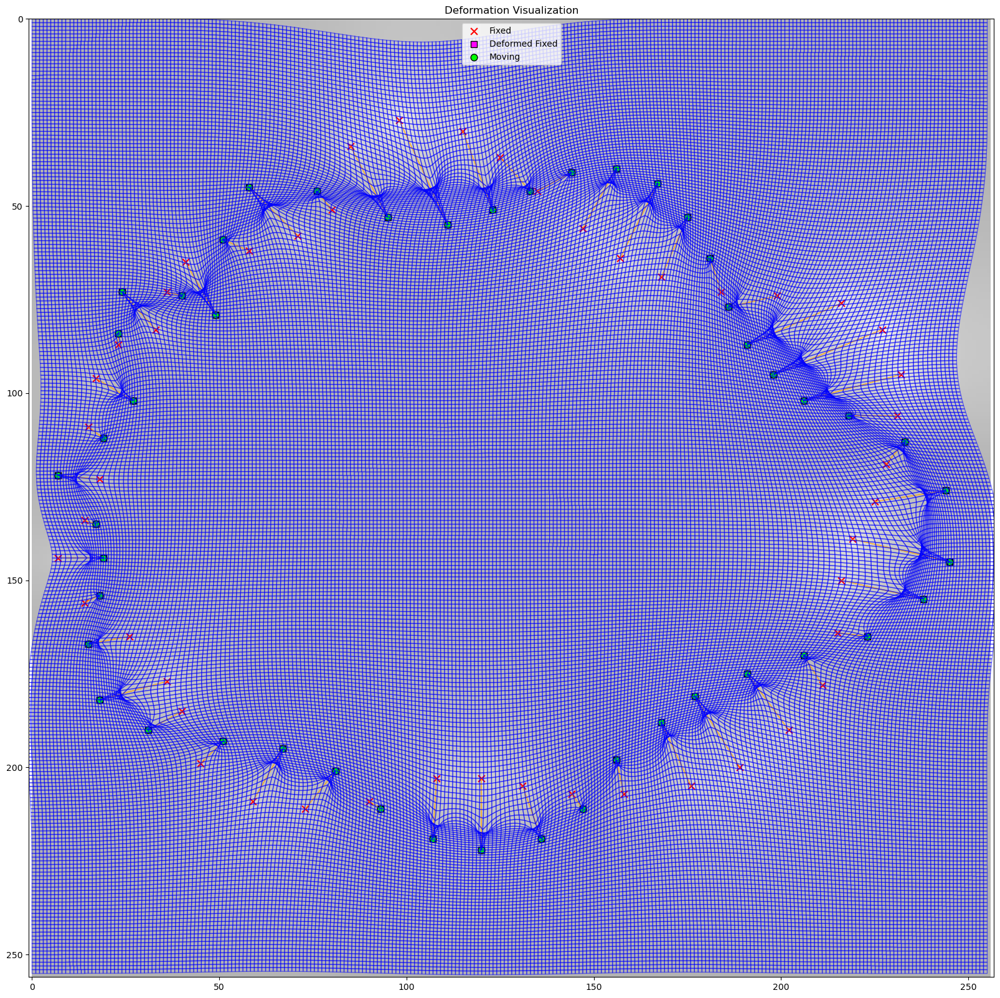

In [18]:
plot_2d_deformation_grid_v2(d.deformation, moving_points=mpoints, fixed_points=fpoints, title="Deformation Visualization", grid_spacing=1, figsize=(20, 20))